<img src="http://imgur.com/1ZcRyrc.png" style="float: left; margin: 15px; height: 80px">

# Project 3

### Regression and Classification with the Ames Housing Data

---

You have just joined a new "full stack" real estate company in Ames, Iowa. The strategy of the firm is two-fold:
- Own the entire process from the purchase of the land all the way to sale of the house, and anything in between.
- Use statistical analysis to optimize investment and maximize return.

The company is still small, and though investment is substantial the short-term goals of the company are more oriented towards purchasing existing houses and flipping them as opposed to constructing entirely new houses. That being said, the company has access to a large construction workforce operating at rock-bottom prices.

This project uses the [Ames housing data recently made available on kaggle](https://www.kaggle.com/c/house-prices-advanced-regression-techniques).

In [55]:
import numpy as np
import scipy.stats as stats
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor

from pandas_profiling import ProfileReport


sns.set_style('whitegrid')

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 1. Estimating the value of homes from fixed characteristics.

---

Your superiors have outlined this year's strategy for the company:
1. Develop an algorithm to reliably estimate the value of residential houses based on *fixed* characteristics.
2. Identify characteristics of houses that the company can cost-effectively change/renovate with their construction team.
3. Evaluate the mean dollar value of different renovations.

Then we can use that to buy houses that are likely to sell for more than the cost of the purchase plus renovations.

Your first job is to tackle #1. You have a dataset of housing sale data with a huge amount of features identifying different aspects of the house. The full description of the data features can be found in a separate file:

    housing.csv
    data_description.txt
    
You need to build a reliable estimator for the price of the house given characteristics of the house that cannot be renovated. Some examples include:
- The neighborhood
- Square feet
- Bedrooms, bathrooms
- Basement and garage space

and many more. 

Some examples of things that **ARE renovate-able:**
- Roof and exterior features
- "Quality" metrics, such as kitchen quality
- "Condition" metrics, such as condition of garage
- Heating and electrical components

and generally anything you deem can be modified without having to undergo major construction on the house.

---

**Your goals:**
1. Perform any cleaning, feature engineering, and EDA you deem necessary.
- Be sure to remove any houses that are not residential from the dataset.
- Identify **fixed** features that can predict price.
- Train a model on pre-2010 data and evaluate its performance on the 2010 houses.
- Characterize your model. How well does it perform? What are the best estimates of price?

> **Note:** The EDA and feature engineering component to this project is not trivial! Be sure to always think critically and creatively. Justify your actions! Use the data description file!

In [56]:
# Importing the data file containing the housing data
house = pd.read_csv('./housing.csv')

In [57]:
# Looking at the head of the housing data file to explore nature of the data.
house.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [58]:
# Looking at the shape of the dataframe. 
# Original dataframe has 1460 rows and 81 columns
print(house.shape)

(1460, 81)


In [59]:
#Reviewing which variable have null values
list(zip(house.columns.to_list(),house.isnull().sum().to_list()))

[('Id', 0),
 ('MSSubClass', 0),
 ('MSZoning', 0),
 ('LotFrontage', 259),
 ('LotArea', 0),
 ('Street', 0),
 ('Alley', 1369),
 ('LotShape', 0),
 ('LandContour', 0),
 ('Utilities', 0),
 ('LotConfig', 0),
 ('LandSlope', 0),
 ('Neighborhood', 0),
 ('Condition1', 0),
 ('Condition2', 0),
 ('BldgType', 0),
 ('HouseStyle', 0),
 ('OverallQual', 0),
 ('OverallCond', 0),
 ('YearBuilt', 0),
 ('YearRemodAdd', 0),
 ('RoofStyle', 0),
 ('RoofMatl', 0),
 ('Exterior1st', 0),
 ('Exterior2nd', 0),
 ('MasVnrType', 8),
 ('MasVnrArea', 8),
 ('ExterQual', 0),
 ('ExterCond', 0),
 ('Foundation', 0),
 ('BsmtQual', 37),
 ('BsmtCond', 37),
 ('BsmtExposure', 38),
 ('BsmtFinType1', 37),
 ('BsmtFinSF1', 0),
 ('BsmtFinType2', 38),
 ('BsmtFinSF2', 0),
 ('BsmtUnfSF', 0),
 ('TotalBsmtSF', 0),
 ('Heating', 0),
 ('HeatingQC', 0),
 ('CentralAir', 0),
 ('Electrical', 1),
 ('1stFlrSF', 0),
 ('2ndFlrSF', 0),
 ('LowQualFinSF', 0),
 ('GrLivArea', 0),
 ('BsmtFullBath', 0),
 ('BsmtHalfBath', 0),
 ('FullBath', 0),
 ('HalfBath', 0),


In [60]:
# Columns names for reference use
house.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [61]:
# Using the Pandas Profiling library to investigate the variables and data characteristics
house_profile_report = ProfileReport(house)
house_profile_report

C:\Users\matth\Anaconda3\lib\site-packages\pandas_profiling\describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,81
Number of observations,1460
Total Missing (%),5.9%
Total size in memory,924.0 KiB
Average record size in memory,648.1 B
Numeric,38
Categorical,43
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [62]:
#Send report to a data file for easier checking
ProfileReport.to_file(house_profile_report, outputfile='house_profile_report.html')

In [63]:
list(zip(house.columns.to_list(),house.dtypes.to_list()))

[('Id', dtype('int64')),
 ('MSSubClass', dtype('int64')),
 ('MSZoning', dtype('O')),
 ('LotFrontage', dtype('float64')),
 ('LotArea', dtype('int64')),
 ('Street', dtype('O')),
 ('Alley', dtype('O')),
 ('LotShape', dtype('O')),
 ('LandContour', dtype('O')),
 ('Utilities', dtype('O')),
 ('LotConfig', dtype('O')),
 ('LandSlope', dtype('O')),
 ('Neighborhood', dtype('O')),
 ('Condition1', dtype('O')),
 ('Condition2', dtype('O')),
 ('BldgType', dtype('O')),
 ('HouseStyle', dtype('O')),
 ('OverallQual', dtype('int64')),
 ('OverallCond', dtype('int64')),
 ('YearBuilt', dtype('int64')),
 ('YearRemodAdd', dtype('int64')),
 ('RoofStyle', dtype('O')),
 ('RoofMatl', dtype('O')),
 ('Exterior1st', dtype('O')),
 ('Exterior2nd', dtype('O')),
 ('MasVnrType', dtype('O')),
 ('MasVnrArea', dtype('float64')),
 ('ExterQual', dtype('O')),
 ('ExterCond', dtype('O')),
 ('Foundation', dtype('O')),
 ('BsmtQual', dtype('O')),
 ('BsmtCond', dtype('O')),
 ('BsmtExposure', dtype('O')),
 ('BsmtFinType1', dtype('O')),

Text(0.5, 1.0, 'Distribution of House Sale Price')

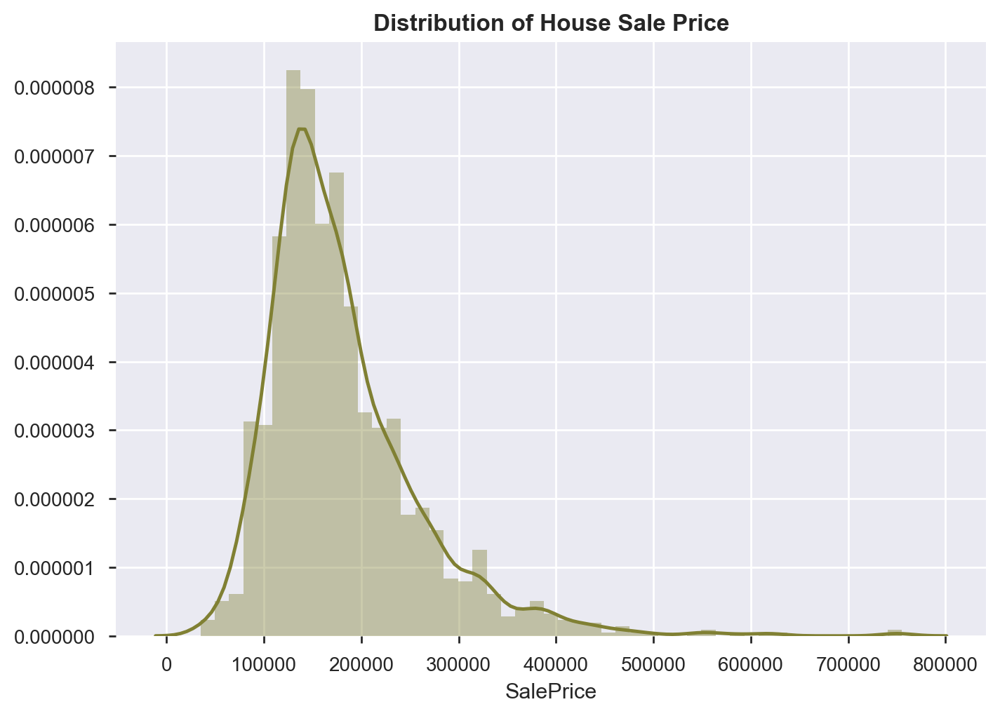

In [64]:
#Distribution of House Sale Prices shows a positively skewed distribution
sns.distplot(house['SalePrice'],color=(0.5,0.5,0.2))
plt.title('Distribution of House Sale Price', fontweight='bold')

In [65]:
#Investigating list of house prices over $500000
house[house.SalePrice > 500000]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
178,179,20,RL,63.0,17423,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2009,New,Partial,501837
440,441,20,RL,105.0,15431,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2009,WD,Normal,555000
691,692,60,RL,104.0,21535,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2007,WD,Normal,755000
769,770,60,RL,47.0,53504,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,6,2010,WD,Normal,538000
803,804,60,RL,107.0,13891,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,1,2009,New,Partial,582933
898,899,20,RL,100.0,12919,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,3,2010,New,Partial,611657
1046,1047,60,RL,85.0,16056,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,New,Partial,556581
1169,1170,60,RL,118.0,35760,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,7,2006,WD,Normal,625000
1182,1183,60,RL,160.0,15623,Pave,NaN,IR1,Lvl,AllPub,...,555,Ex,MnPrv,NaN,0,7,2007,WD,Abnorml,745000


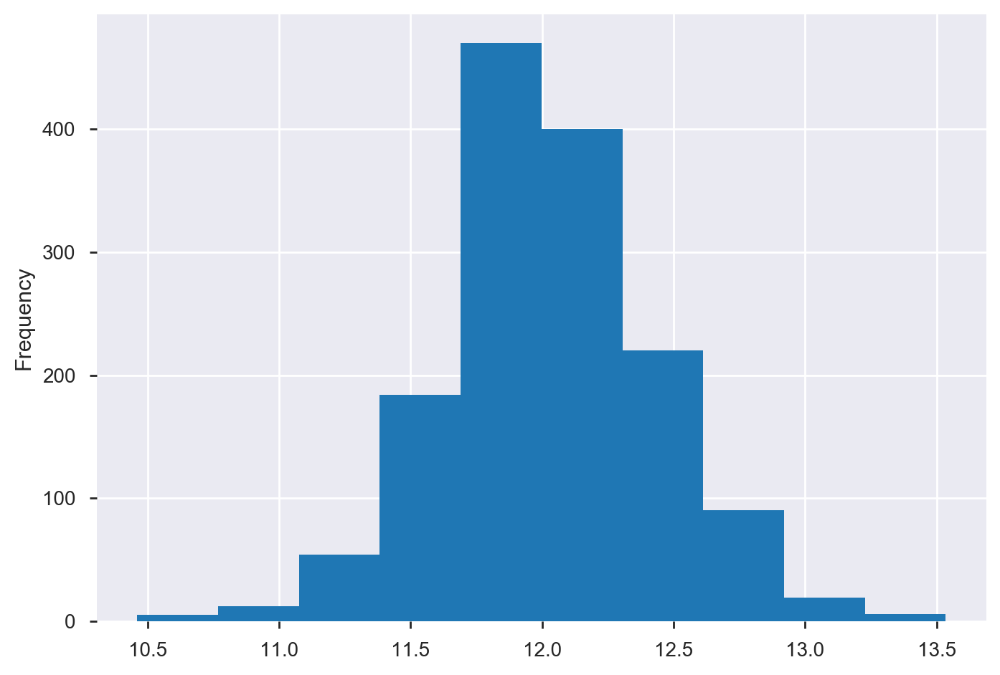

In [66]:
#plotting a log tranform of SalePrice to see if this improves to a more normal distribution
np.log(house.SalePrice).plot(kind='hist')
#Log transformation of target variable is more normally distributed. Thus, the log of the sale price
#will be the target 

In [67]:
#Log distribution of Sale prices is more normally distributed and thus

In [68]:
# Explore correlationship amongst variables
spearman_corr = house.select_dtypes(include=['int64','float64']).corr(method='spearman').round(decimals=2)
spearman_corr

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.00,0.02,-0.03,-0.01,-0.03,0.00,-0.01,-0.01,-0.04,-0.01,...,-0.04,-0.00,-0.01,-0.04,0.01,0.06,-0.04,0.02,0.00,-0.02
MSSubClass,0.02,1.00,-0.31,-0.27,0.11,-0.07,0.04,0.01,0.03,-0.11,...,0.02,0.03,0.01,-0.04,-0.02,0.03,-0.03,0.02,-0.03,0.01
LotFrontage,-0.03,-0.31,1.00,0.65,0.25,-0.08,0.19,0.12,0.26,0.15,...,0.11,0.18,-0.10,0.06,0.04,0.08,0.02,0.03,0.00,0.41
LotArea,-0.01,-0.27,0.65,1.00,0.23,-0.05,0.10,0.08,0.18,0.17,...,0.18,0.18,-0.07,0.06,0.09,0.08,0.06,0.01,-0.03,0.46
OverallQual,-0.03,0.11,0.25,0.23,1.00,-0.18,0.65,0.56,0.41,0.13,...,0.26,0.44,-0.16,0.03,0.05,0.06,-0.09,0.06,-0.03,0.81
OverallCond,0.00,-0.07,-0.08,-0.05,-0.18,1.00,-0.42,-0.04,-0.18,-0.01,...,-0.04,-0.13,0.11,0.03,0.07,-0.01,0.09,-0.01,0.05,-0.13
YearBuilt,-0.01,0.04,0.19,0.10,0.65,-0.42,1.00,0.68,0.40,0.19,...,0.29,0.39,-0.41,0.02,-0.07,0.01,-0.09,0.02,-0.01,0.65
YearRemodAdd,-0.01,0.01,0.12,0.08,0.56,-0.04,0.68,1.00,0.23,0.06,...,0.23,0.35,-0.24,0.05,-0.05,0.00,-0.09,0.02,0.05,0.57
MasVnrArea,-0.04,0.03,0.26,0.18,0.41,-0.18,0.40,0.23,1.00,0.24,...,0.17,0.21,-0.18,0.04,0.04,0.00,-0.05,0.02,0.00,0.42
BsmtFinSF1,-0.01,-0.11,0.15,0.17,0.13,-0.01,0.19,0.06,0.24,1.00,...,0.18,0.08,-0.15,0.05,0.07,0.06,0.01,-0.02,0.02,0.30


In [69]:
#Create a copy of the dataset for cleaning
house_clean = house.copy()

In [70]:
#Creating a log transformed target SalePrice variable
house_clean['log_SalePrice'] = np.log(house.SalePrice)

Text(0.5, 1.0, 'Distribution of Log House Sale Price ($)')

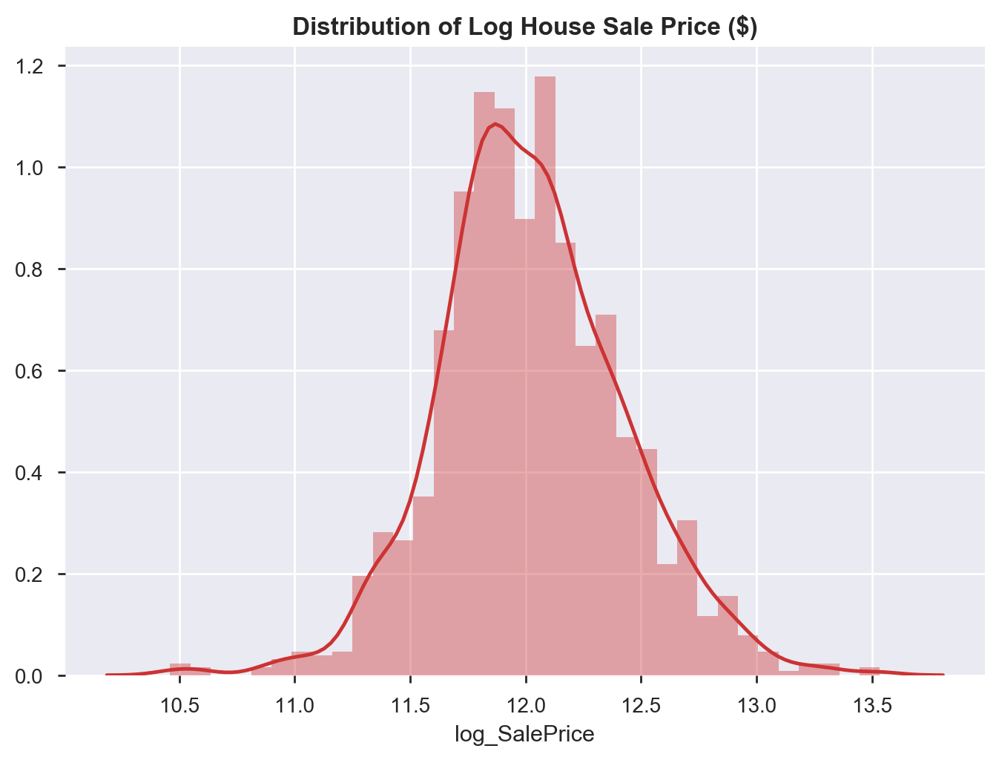

In [71]:
#Distribution of log Sale Prices shows a positively skewed distribution
sns.distplot(house_clean['log_SalePrice'],color=(0.8,0.2,0.2))
plt.title('Distribution of Log House Sale Price ($)', fontweight='bold')

In [72]:
house_clean['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

**LotFrontage**

In [73]:
##Investigating the rows where LotFrontage information is missing to inform decision on how to deal with missing values
#I would expect that missing values may be for lots that are in complexes but there doesn't seem to be any of this type in the data
#Perhaps properties on second floor of a duplex?
house_clean['LotFrontage'].isnull().sum()

259

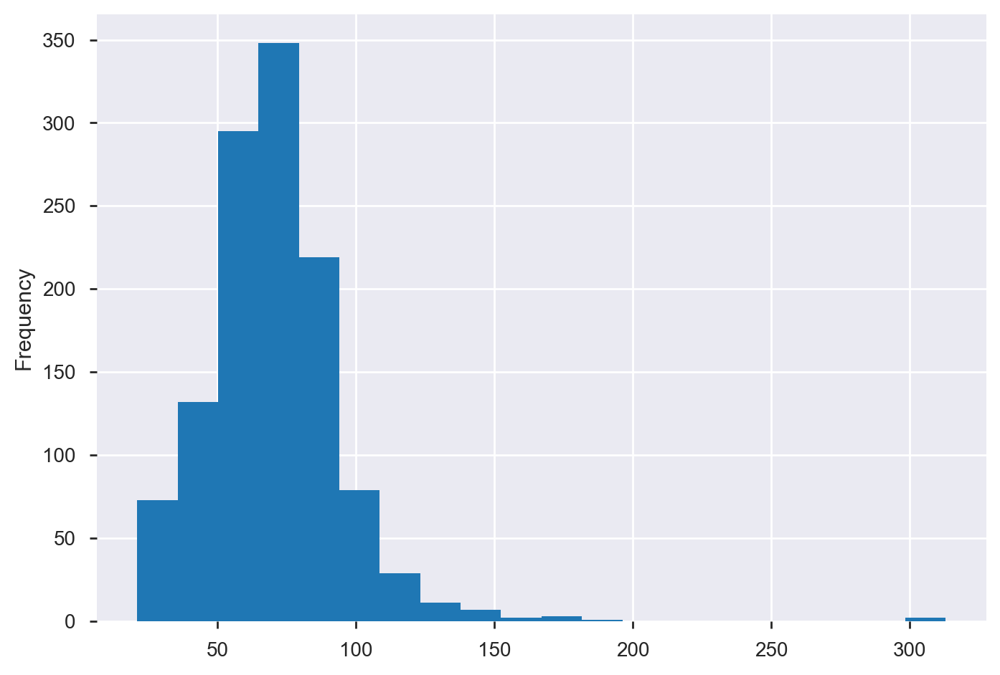

In [74]:
#Investigating distributuion of LotFrontage
house_clean.LotFrontage.plot(kind='hist', bins =20)

In [75]:
#Data set doesn't seem to contain any houses in high rise buildings which may explain why
#some lot frontages missing. However, the data set appears to contain more low rise buildings.
#Therefore, for missing data in LotFrontage, have imputed the median for missing values
house_clean['LotFrontage_recoded']=house_clean['LotFrontage'].copy()
house_clean['LotFrontage_recoded'].fillna(np.median(house_clean['LotFrontage_recoded']))

0       65.0
1       80.0
2       68.0
3       60.0
4       84.0
        ... 
1455    62.0
1456    85.0
1457    66.0
1458    68.0
1459    75.0
Name: LotFrontage_recoded, Length: 1460, dtype: float64

In [76]:
LotFrontage_median = house_clean['LotFrontage_recoded'].describe()[5]

In [77]:
house_clean['LotFrontage_recoded'].fillna(LotFrontage_median,inplace=True)

In [78]:
house_clean['LotFrontage_recoded'].isnull().sum()

0

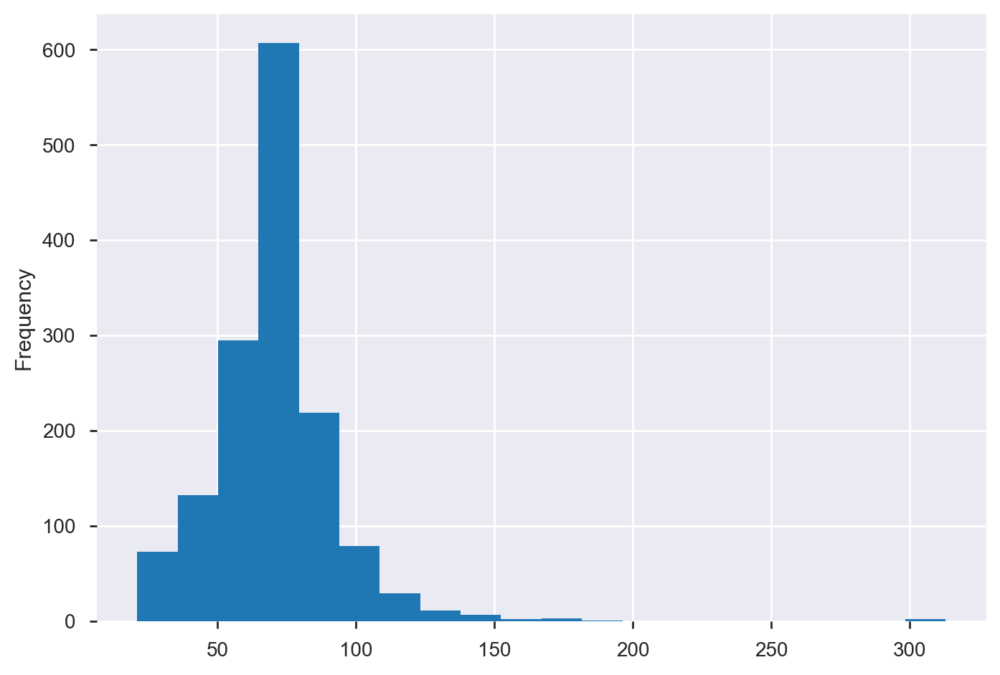

In [79]:
#Investigating distributuion of LotFrontage
house_clean.LotFrontage_recoded.plot(kind='hist', bins =20)

In [80]:
#Investigating EXTREME upper and lower ranges for lotfrontage in terms of outlier ranges against IQR*3 criteria
upper= ((np.quantile([house_clean['LotFrontage_recoded']],0.75) - np.quantile([house_clean['LotFrontage_recoded']],0.25))*3) + np.quantile([house_clean['LotFrontage_recoded']],0.75)
lower=(np.quantile([house_clean['LotFrontage_recoded']],0.25)-(np.quantile([house_clean['LotFrontage_recoded']],0.75) - np.quantile([house_clean['LotFrontage_recoded']],0.25))*3)

print("Upper:",upper)
print("Lower:",lower)

Upper: 136.0
Lower: 3.0


In [81]:
#Investigating list of houses with frontage flagged as extreme outliers
house_clean[house_clean.LotFrontage_recoded > upper]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,log_SalePrice,LotFrontage_recoded
171,172,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,5,2010,WD,Normal,215000,12.278393,141.0
197,198,75,RL,174.0,25419,Pave,NaN,Reg,Lvl,AllPub,...,GdPrv,NaN,0,3,2006,WD,Abnorml,235000,12.367341,174.0
231,232,60,RL,174.0,15138,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,7,2009,WD,Normal,403000,12.906692,174.0
277,278,20,RL,140.0,19138,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,6,2010,WD,Normal,141000,11.856515,140.0
313,314,20,RL,150.0,215245,Pave,NaN,IR3,Low,AllPub,...,NaN,NaN,0,6,2009,WD,Normal,375000,12.834681,150.0
446,447,20,RL,137.0,16492,Pave,NaN,IR1,Lvl,AllPub,...,NaN,NaN,0,6,2010,WD,Normal,190000,12.154779,137.0
807,808,70,RL,144.0,21384,Pave,NaN,Reg,Lvl,AllPub,...,NaN,NaN,0,5,2009,WD,Normal,223500,12.317167,144.0
909,910,60,RL,149.0,12589,Pave,NaN,IR2,Lvl,AllPub,...,NaN,NaN,0,6,2009,WD,Normal,174000,12.066811,149.0
934,935,20,RL,313.0,27650,Pave,NaN,IR2,HLS,AllPub,...,NaN,NaN,0,11,2008,WD,Normal,242000,12.396693,313.0
1107,1108,60,RL,168.0,23257,Pave,NaN,IR3,HLS,AllPub,...,NaN,NaN,0,9,2006,New,Partial,274725,12.523526,168.0


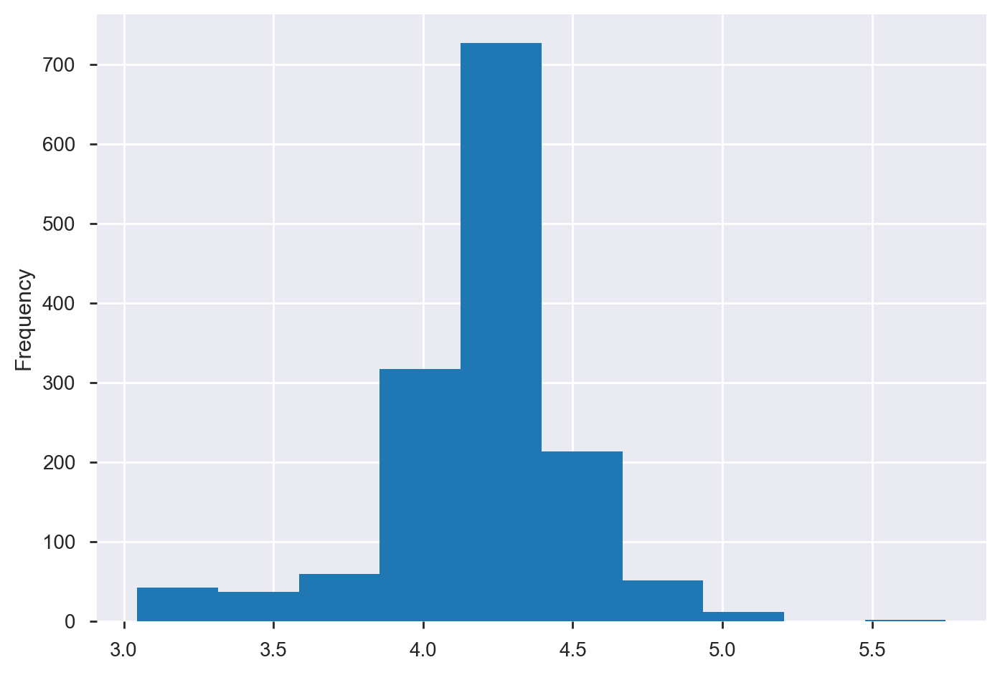

In [82]:
np.log(house_clean['LotFrontage_recoded']).plot(kind='hist')

In [83]:
#Investigating list of houses with frontage flagged as extreme outliers at lower range
#Here there are no data 
house_clean[house_clean.LotFrontage_recoded < lower]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,log_SalePrice,LotFrontage_recoded


In [84]:
house_clean['log_LotFrontage_recoded'] = house_clean['LotFrontage_recoded'].agg(np.log)

In [85]:
house_clean['log_LotFrontage_recoded'].isnull().sum()

0

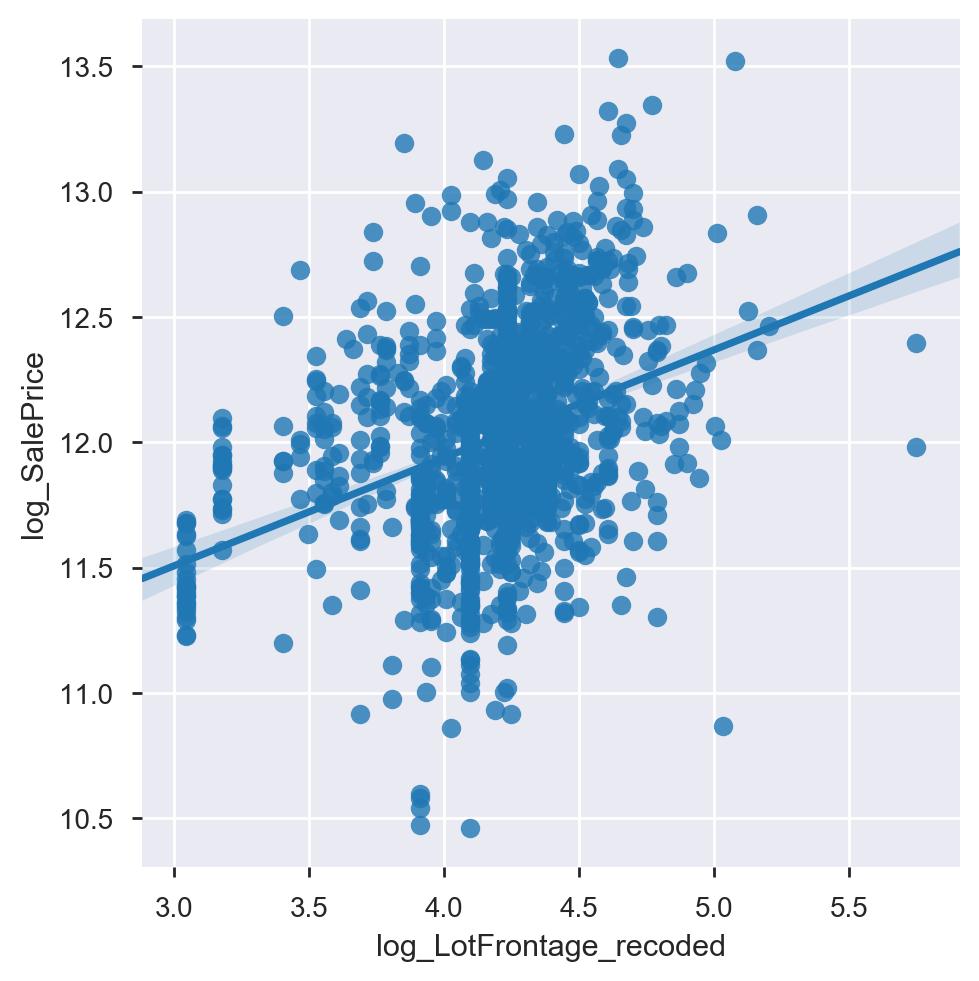

In [86]:
#Investigating LotFrontage relationship to target 
sns.lmplot(x='log_LotFrontage_recoded',y='log_SalePrice',data=house_clean)
print()

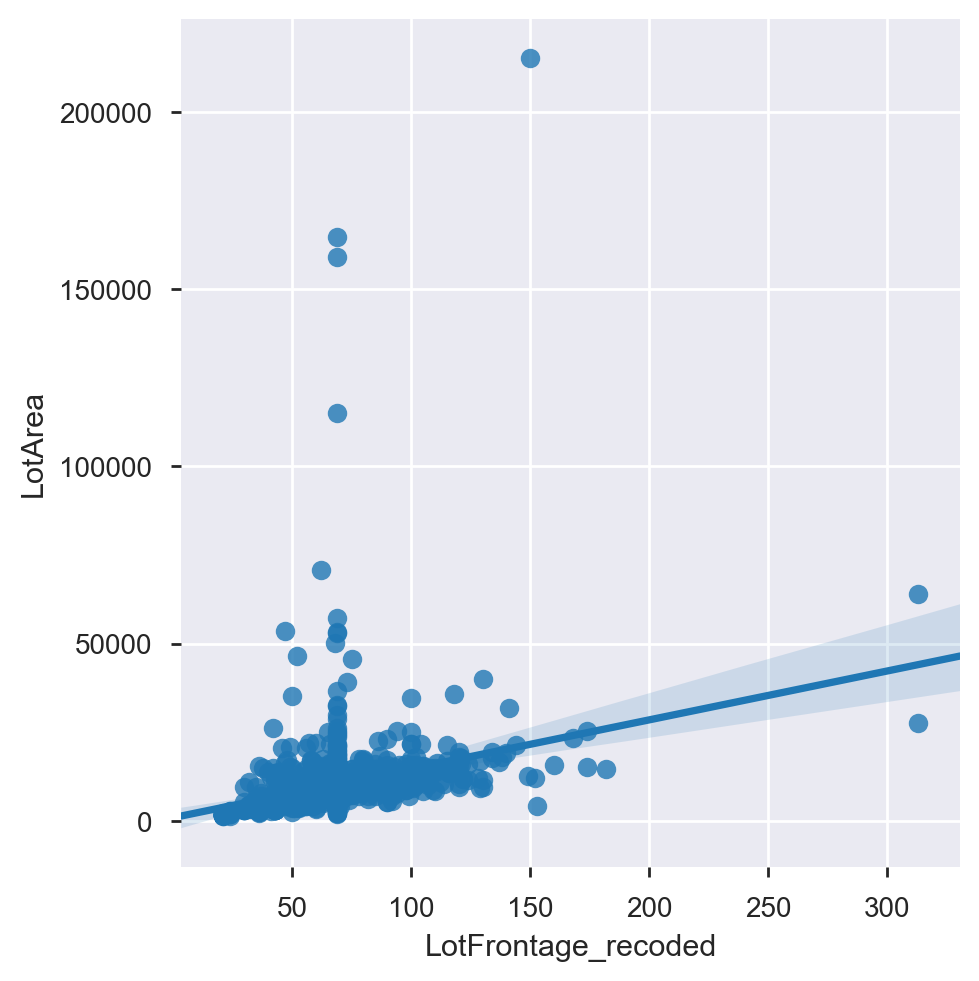

In [87]:
#Investigating LotFrontage relationship to LotArea 
sns.lmplot(x='LotFrontage_recoded',y='LotArea',data=house_clean)
print()

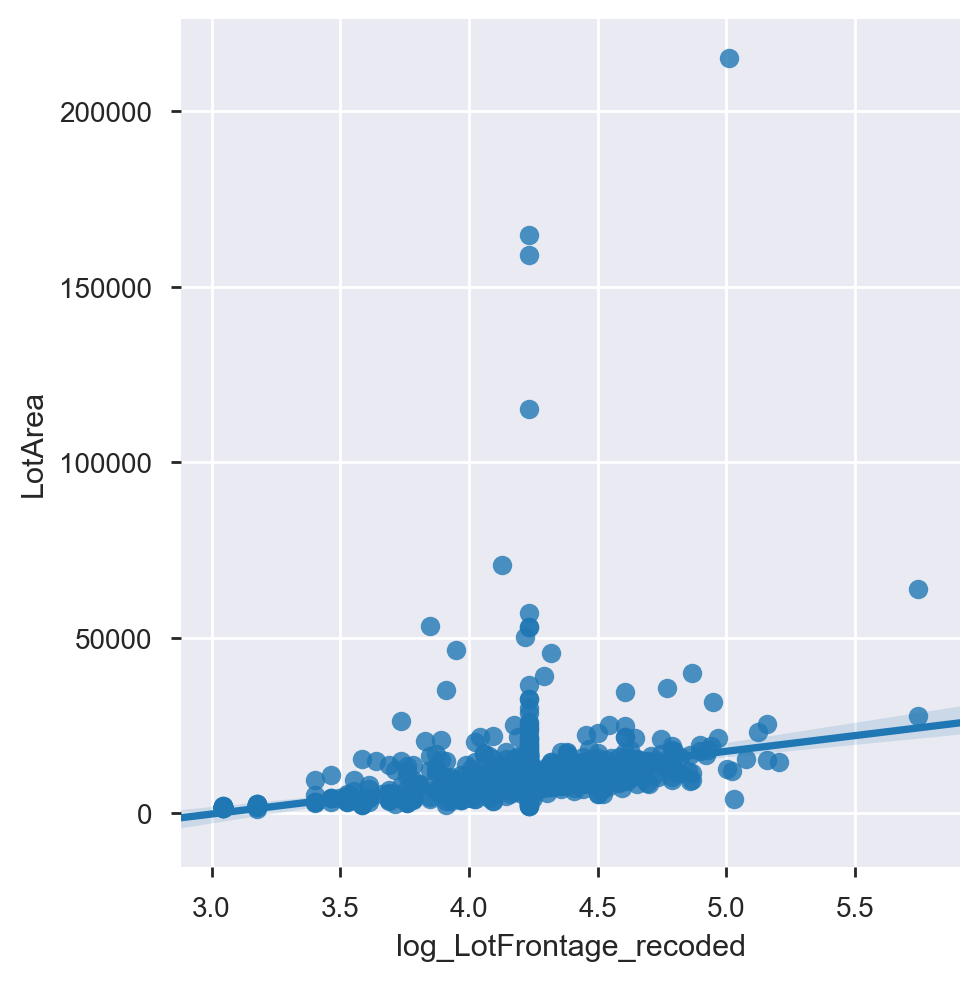

In [88]:
#Investigating LotFrontage relationship to LotArea 
sns.lmplot(x='log_LotFrontage_recoded',y='LotArea',data=house_clean)
print()

In [89]:
#Investigating correlations between lotfrontage and lotarea to assess if any issues of multicollinarity 
#Suggests that LotFrontage r
print(stats.pearsonr(house_clean.LotFrontage_recoded,house_clean.LotArea))
print(stats.spearmanr(house_clean.LotFrontage_recoded,house_clean.LotArea))

(0.30452217074370935, 1.0523028975692497e-32)
SpearmanrResult(correlation=0.5540815656298507, pvalue=2.9333028802367796e-118)


In [90]:
#Recode alley_recoded null values to No Alley Access to match data dictionary and facilitate modelling
house_clean['alley_recoded']= house_clean['Alley'].copy()
house_clean["alley_recoded"].fillna('No_alley_access', inplace = True)

In [91]:
#Verifying that alley_recoded properly and no null values missing
print(house_clean['alley_recoded'].unique())
print(house_clean['alley_recoded'].isnull().sum())

['No_alley_access' 'Grvl' 'Pave']
0


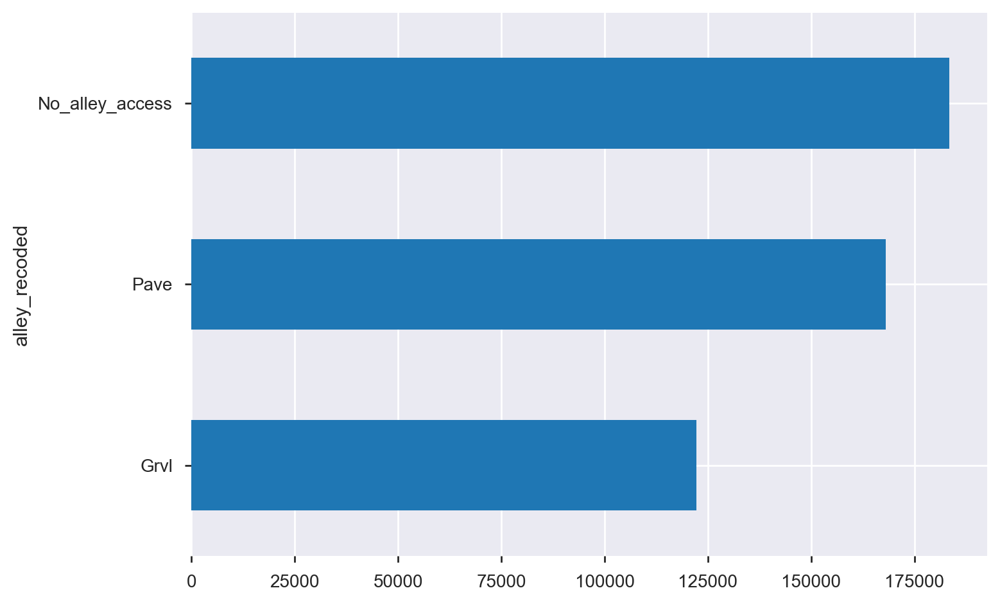

In [92]:
#Investigating Alley sales prices as a potential indicator
(house_clean.groupby(by='alley_recoded').SalePrice.agg(np.mean).round(decimals=0)).sort_values(ascending=True).plot(kind='barh')
#Suggests gravel may reduce sale price

In [93]:
#Investigating class size for street
house_clean.groupby(by='Street').size()

Street
Grvl       6
Pave    1454
dtype: int64

In [94]:
#Dropping Street from data set
house_clean.drop(columns=['Street'], inplace=True)

In [95]:
house_clean.LotShape.isnull().sum()

0

In [96]:
house_clean.groupby(by='LotShape').size()

LotShape
IR1    484
IR2     41
IR3     10
Reg    925
dtype: int64

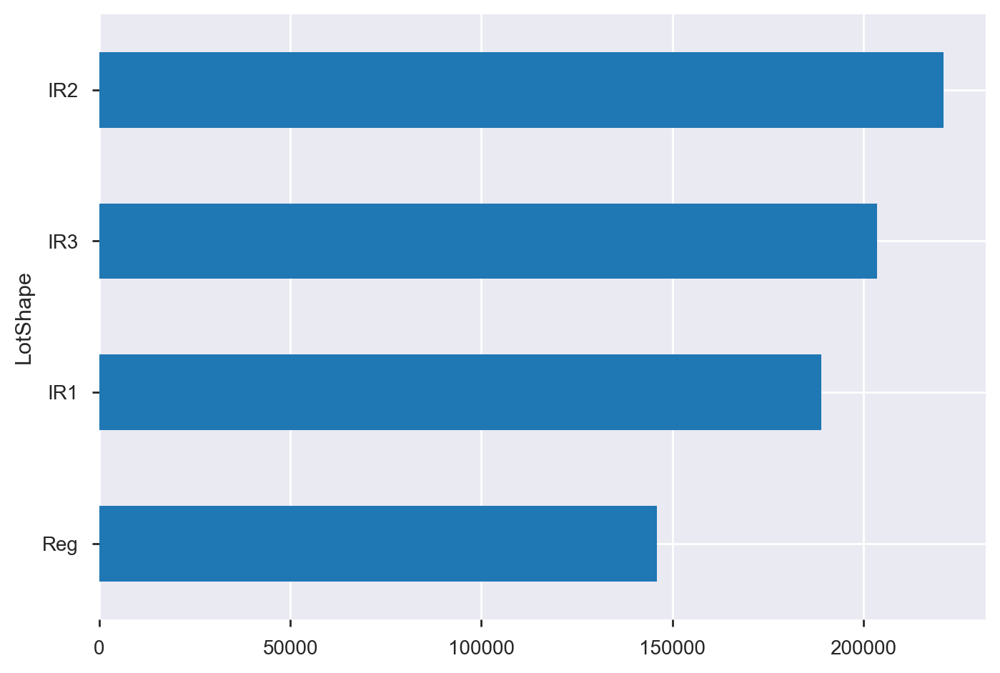

In [97]:
#Investigating LotShape sales prices as a potential indicator
(house_clean.groupby(by='LotShape').SalePrice.agg(np.median).round(decimals=0)).sort_values(ascending=True).plot(kind='barh')
#Suggests that Irregular shapes as more attractive probably due to uniquness. 

In [98]:
house_clean.LotConfig.isnull().sum()

0

In [99]:
#Small group count for FR3 (rontage on 3 sides of property)
house_clean.groupby(by='LotConfig').size()

LotConfig
Corner      263
CulDSac      94
FR2          47
FR3           4
Inside     1052
dtype: int64

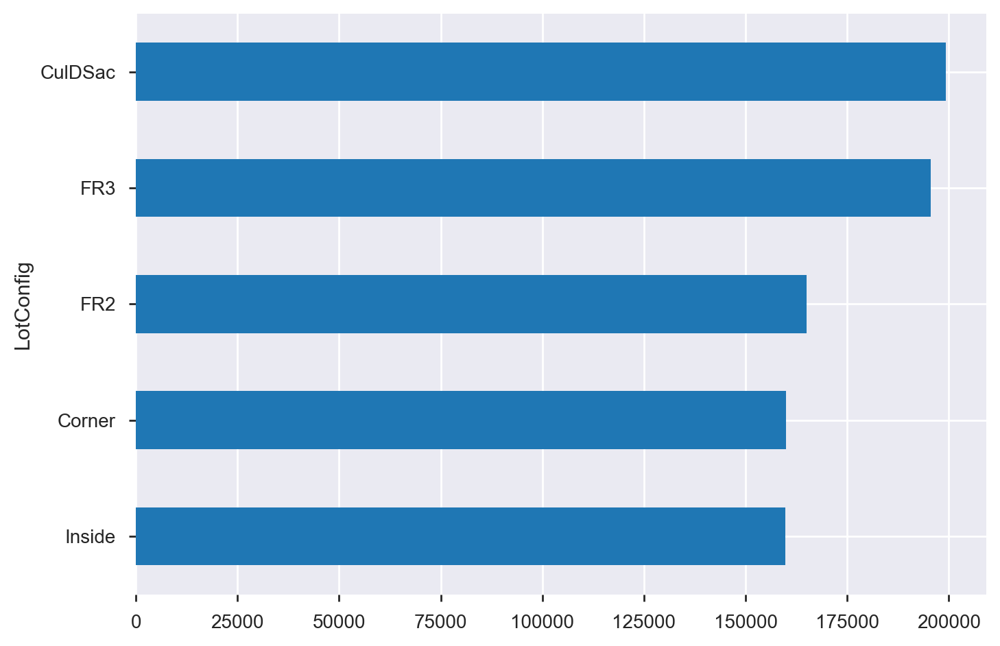

In [100]:
#Investigating LotConfig sales prices as a potential indicator
(house_clean.groupby(by='LotConfig').SalePrice.agg(np.median).round(decimals=0)).sort_values(ascending=True).plot(kind='barh')
#Suggests that cul de sacs more valued

In [101]:
house_clean.LandSlope.isnull().sum()

0

In [102]:
#Small group count for Severe
house_clean.groupby(by='LandSlope').size()

LandSlope
Gtl    1382
Mod      65
Sev      13
dtype: int64

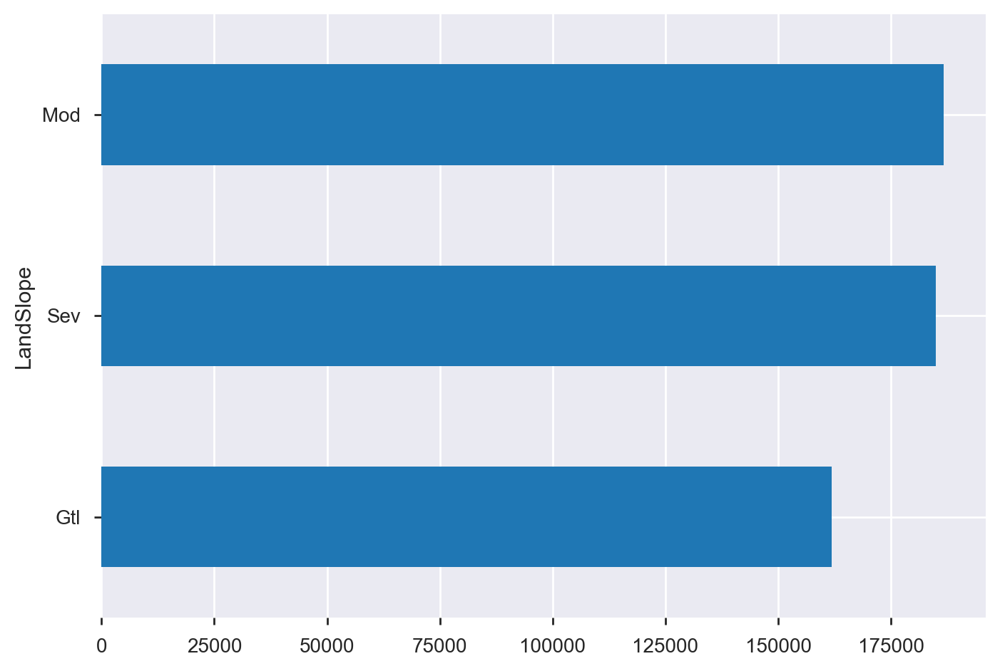

In [103]:
#Investigating LandSlope sales prices as a potential indicator
(house_clean.groupby(by='LandSlope').SalePrice.agg(np.median).round(decimals=0)).sort_values(ascending=True).plot(kind='barh')
#Suggests that properties on moderate to severe slopes have higher sale prices

In [104]:
house_clean.Neighborhood.isnull().sum()

0

In [105]:
#Investigating class sizes for neighbourhood
house_clean.groupby(by='Neighborhood').size()
#Some small numbers of sales in some neighbourhoods (e.g. Blueste,NPkVill)

Neighborhood
Blmngtn     17
Blueste      2
BrDale      16
BrkSide     58
ClearCr     28
CollgCr    150
Crawfor     51
Edwards    100
Gilbert     79
IDOTRR      37
MeadowV     17
Mitchel     49
NAmes      225
NPkVill      9
NWAmes      73
NoRidge     41
NridgHt     77
OldTown    113
SWISU       25
Sawyer      74
SawyerW     59
Somerst     86
StoneBr     25
Timber      38
Veenker     11
dtype: int64

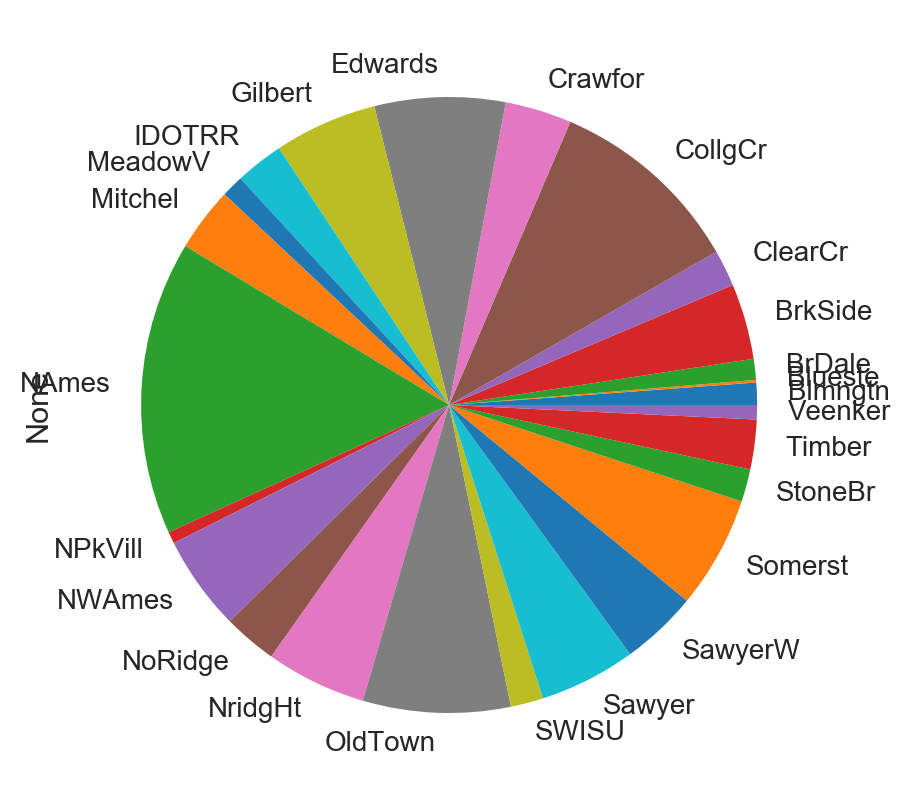

In [106]:
percent_house_neigh = house_clean.groupby(by='Neighborhood').size() / house_clean.groupby(by='Neighborhood').size().sum()
percent_house_neigh.plot(kind='pie', figsize = (5,5))

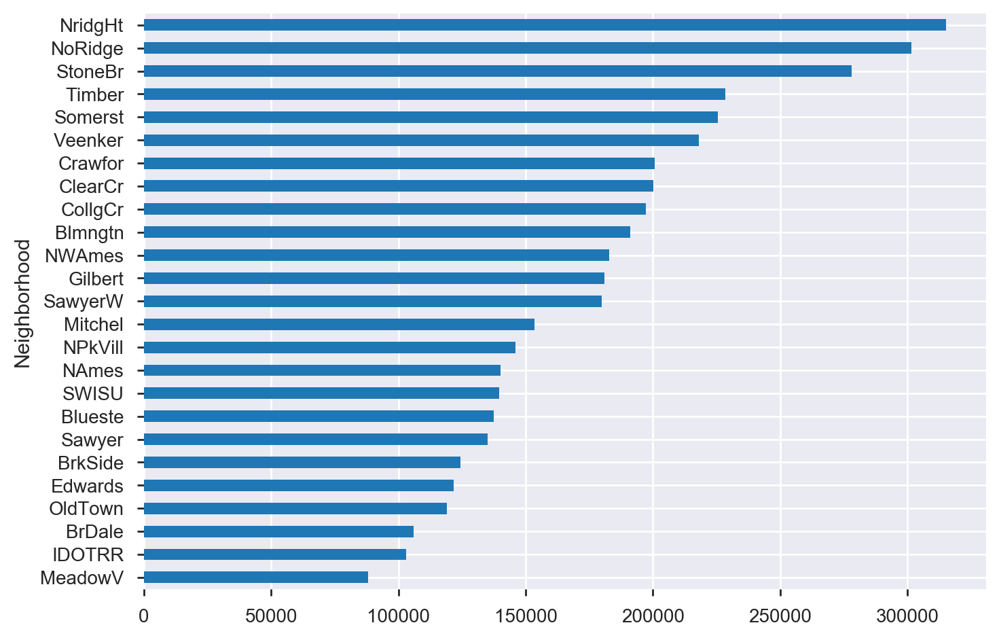

In [107]:
#Investigating median sale price by neighborhood
neighbourhood_sale_median = house_clean.groupby(by=['Neighborhood']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)
neighbourhood_sale_median.plot(kind='barh', rot=0)

In [108]:
# neighbourhood_sale = house_clean[['Neighborhood','log_SalePrice']].copy()
# neighbourhood_sale.sort_values(by)
# neighbourhood_sale_plot = neighbourhood_sale.groupby(by='Neighborhood').agg(np.mean).sort_values(by='log_SalePrice', ascending=False)
# neighbourhood_sale_plot

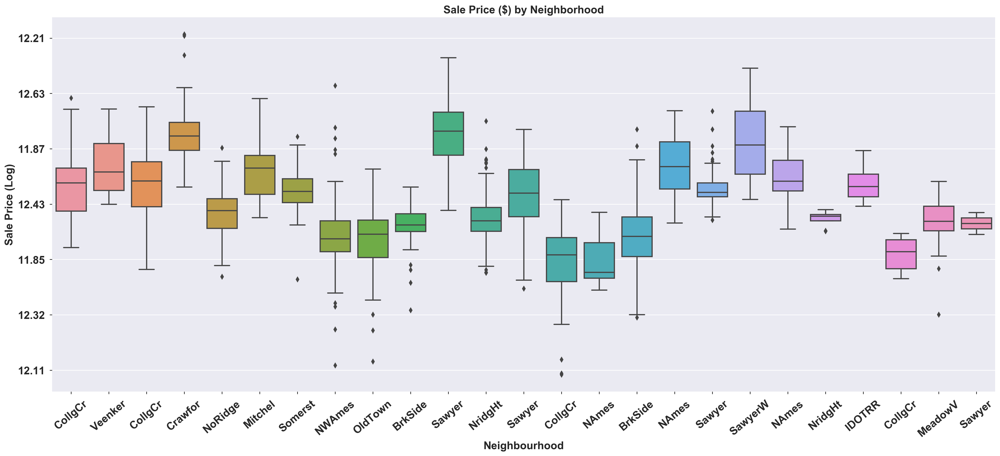

In [109]:
plt.figure(figsize=(25,10))
ax=sns.boxplot(x='Neighborhood',y='log_SalePrice',data=house_clean, 
               )
ax.set_xticklabels(house_clean['Neighborhood'], rotation=40, fontdict={'fontsize': 16,
        'fontweight' : 'bold'})
ax.set_yticklabels(np.round(house_clean['log_SalePrice'],decimals=2),fontdict={'fontsize': 16,
        'fontweight' : 'bold'})
ax.set_title('Sale Price ($) by Neighborhood', fontdict={'fontsize': 16,
        'fontweight' : 'bold'})

plt.xlabel('Neighbourhood', fontdict={'fontsize': 16, 'fontweight' : 'bold'})
plt.ylabel('Sale Price (Log)', fontdict={'fontsize': 16, 'fontweight' : 'bold'})
plt.show()

In [110]:
#Checking if Condition1 has any null values that may need recoding
house.Condition1.isnull().sum()

0

In [111]:
#Investigating class sizes for Condition1
house_clean.groupby(by='Condition1').size()
#Some small numbers of sales in some neighbourhoods (e.g. Blueste,NPkVill)

Condition1
Artery      48
Feedr       81
Norm      1260
PosA         8
PosN        19
RRAe        11
RRAn        26
RRNe         2
RRNn         5
dtype: int64

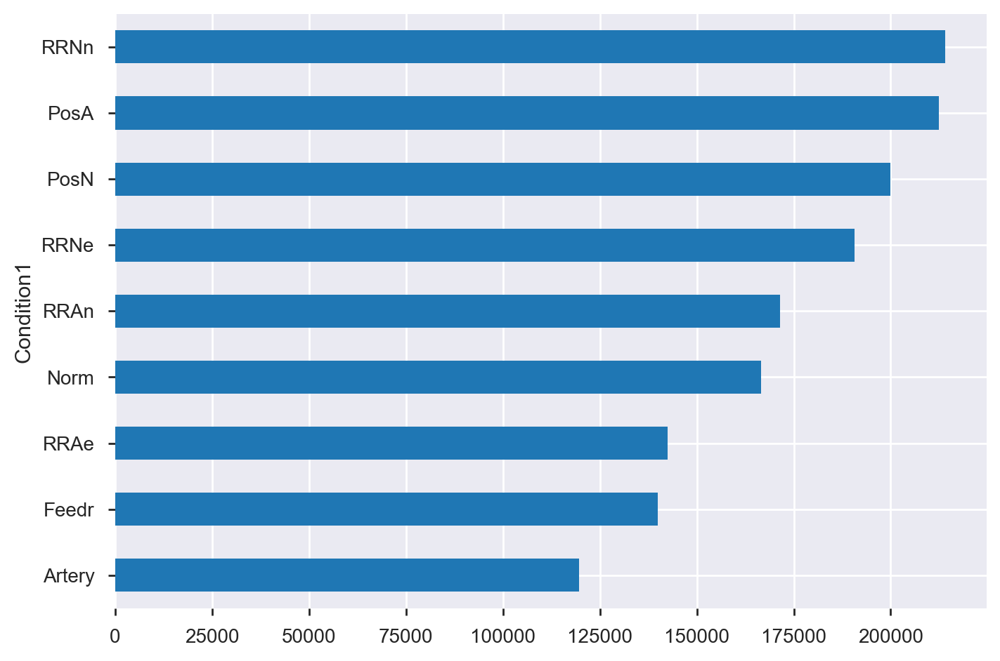

In [112]:
Condition1_price_median = house_clean.groupby(by=['Condition1']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

Condition1_price_median.plot(kind='barh', rot=0)
#Suggests that being near or adjaent to a positive feature (e.g. park) increases prices
#Being adjancent to railways a positive, but need to be careful as small class and probably needs to be combined in
# a reduced class i.e. near/adjacent railroad
#However, being closs to major roads (ie. Feeder and arterial roads a negative on prices)
#Probably useful to reduce the number of classes in data set to reduce complexity.

In [113]:
#Recoding condition proximity variables based on theoretically appropriate values
#In this case, clear that being close to railways and near positive features a benefit while
#being adjancent may be less positive in addition to being close to busy arterial or feeder roads
house_clean["Condition1_recoded"] = house_clean["Condition1"].map({'Artery': 'On or near Artery or Feeder Road', 
                                                       'Feedr': 'On or near Artery or Feeder Road',
                                                       'Norm': 'Norm',
                                                       'PosA': 'AdjNear_positive',
                                                       'PosN': 'AdjNear_positive',
                                                       'RRNn': 'Ajacent or near railroad',
                                                       'RRNe': 'Ajacent or near railroad',
                                                       'RRAe': 'Ajacent or near railroad',
                                                       'RRAn': 'Ajacent or near railroad'
                                                      }) 

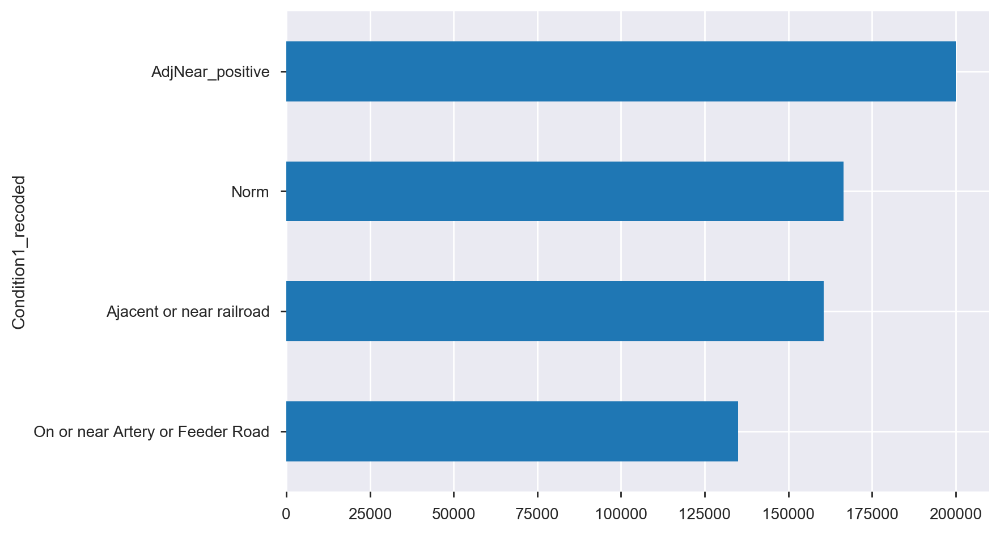

In [114]:
#Plotting median sale prices by each recoded condition category
Condition1re_price_median = house_clean.groupby(by=['Condition1_recoded']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

Condition1re_price_median.plot(kind='barh', rot=0)

In [115]:
house_clean.groupby(by='Condition1_recoded').size()

Condition1_recoded
AdjNear_positive                      27
Ajacent or near railroad              44
Norm                                1260
On or near Artery or Feeder Road     129
dtype: int64

In [116]:
#Dropping Condition2 due to small sizes
house_clean.drop(columns=['Condition2'], inplace=True)

In [117]:
#Checking if BldgType has any null values that may need recoding
house.BldgType.isnull().sum()

0

In [118]:
#Investigating class sizes for BldgType
house_clean.groupby(by='BldgType').size()

BldgType
1Fam      1220
2fmCon      31
Duplex      52
Twnhs       43
TwnhsE     114
dtype: int64

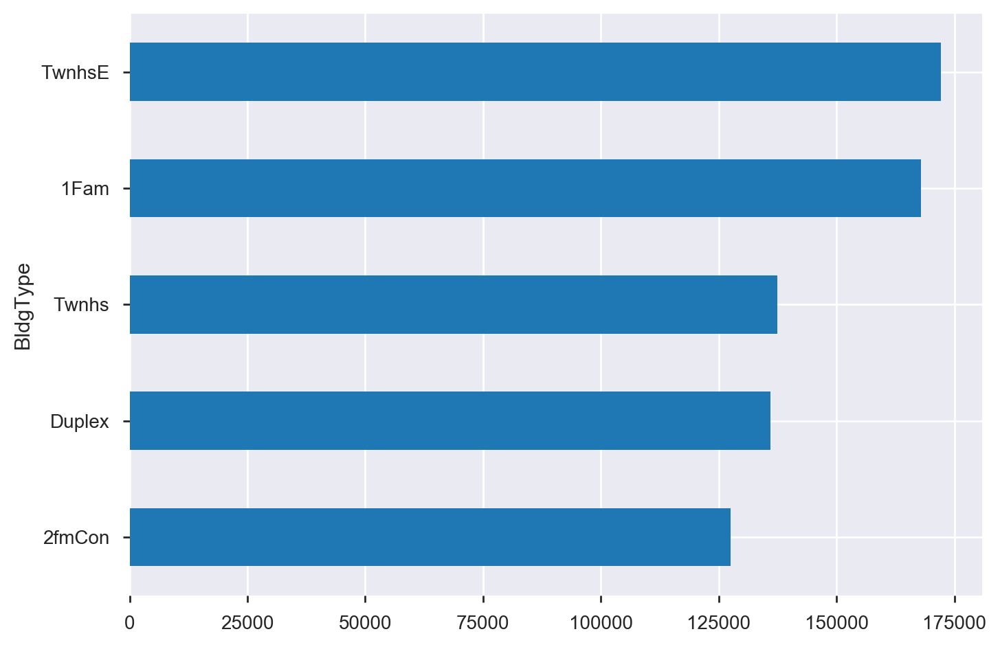

In [119]:
BldgType_sale = house_clean.groupby(by=['BldgType']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

BldgType_sale.plot(kind='barh', rot=0)

In [120]:
#Checking if has any null values that may need recoding
house.HouseStyle.isnull().sum()

0

In [121]:
#Investigating class sizes
house_clean.groupby(by='HouseStyle').size()

HouseStyle
1.5Fin    154
1.5Unf     14
1Story    726
2.5Fin      8
2.5Unf     11
2Story    445
SFoyer     37
SLvl       65
dtype: int64

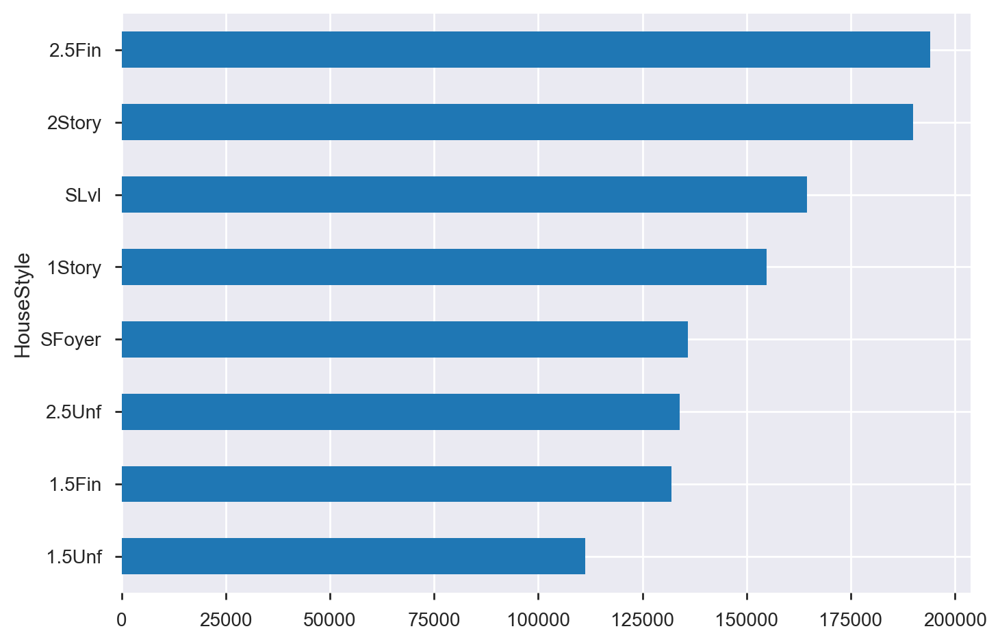

In [122]:
HouseStyle_sale = house_clean.groupby(by=['HouseStyle']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

HouseStyle_sale.plot(kind='barh', rot=0)

In [123]:
#Recoding for different storey heights without finished unfinished flag which is will be created in new variable
house_clean["HouseStyle_recoded"] = house_clean["HouseStyle"].map({'1.5Fin': '1.5_storeys', 
                                                       '1.5Unf': '1.5_storeys',
                                                       '1Story': '1.0_storeys',
                                                       '2.5Fin': '2.5_storeys',
                                                       '2.5Unf': '2.5_storeys',
                                                       '2Story': '2.0_storeys',
                                                       'SFoyer': 'Split_Foyer',
                                                       'SLvl': 'Split_Level'
                                                      }) 

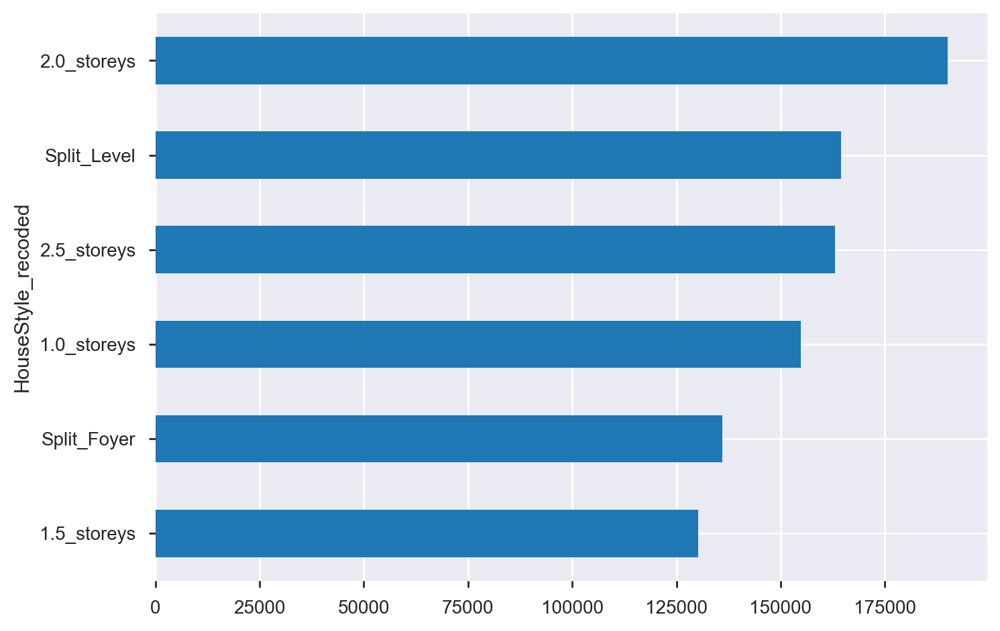

In [124]:
HouseStyle_recoded_sale = house_clean.groupby(by=['HouseStyle_recoded']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

HouseStyle_recoded_sale.plot(kind='barh', rot=0)

In [125]:
#Recoding for whether house finished or unfinished for use in modelling
#It is assumed that is no specification of 'Unf' in label that the house is finished
house_clean["House_Finished_Status"] = house_clean["HouseStyle"].map({'1.5Fin': 'Finished', 
                                                       '1.5Unf': 'UNFinished',
                                                       '1Story': 'Finished',
                                                       '2.5Fin': 'Finished',
                                                       '2.5Unf': 'UNFinished',
                                                       '2Story': 'Finished',
                                                       'SFoyer': 'Finished',
                                                       'SLvl': 'Finished'
                                                      }) 

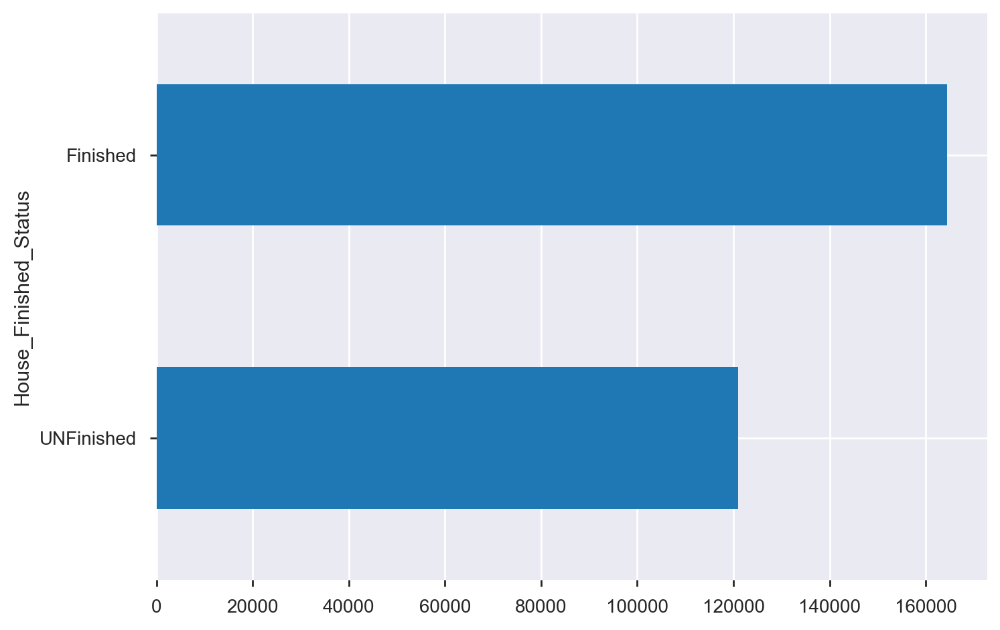

In [126]:
House_finish_status_sale = house_clean.groupby(by=['House_Finished_Status']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

House_finish_status_sale.plot(kind='barh', rot=0)

In [127]:
#Checking if has any null values that may need recoding
house_clean.YearBuilt.isnull().sum()

0

In [128]:
#Checking logic of year build. Looks logical min and max values and averages
house_clean.YearBuilt.describe()

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64

In [129]:
#Would be more useful to have year ranges for different house build eras rather than specific years that
#may contribute to overfitting of the model is modelled in this way. Thus below maps years to year spans using the np.select method
year_map = [house_clean['YearBuilt'].between(0, 1911), 
            house_clean['YearBuilt'].between(1912, 1946), 
            house_clean['YearBuilt'].between(1947, 1970),
            house_clean['YearBuilt'].between(1971, 1980),
            house_clean['YearBuilt'].between(1981, 1990),
            house_clean['YearBuilt'].between(1991, 2000),
            house_clean['YearBuilt'].between(2001, 2010)]
values = ['Pre_1912', '1912-1946', '1947-1970','1971-1980','1981-1990','1991-2000','2001-2010']

house_clean['year_bracket'] = np.select(year_map, values, 0)

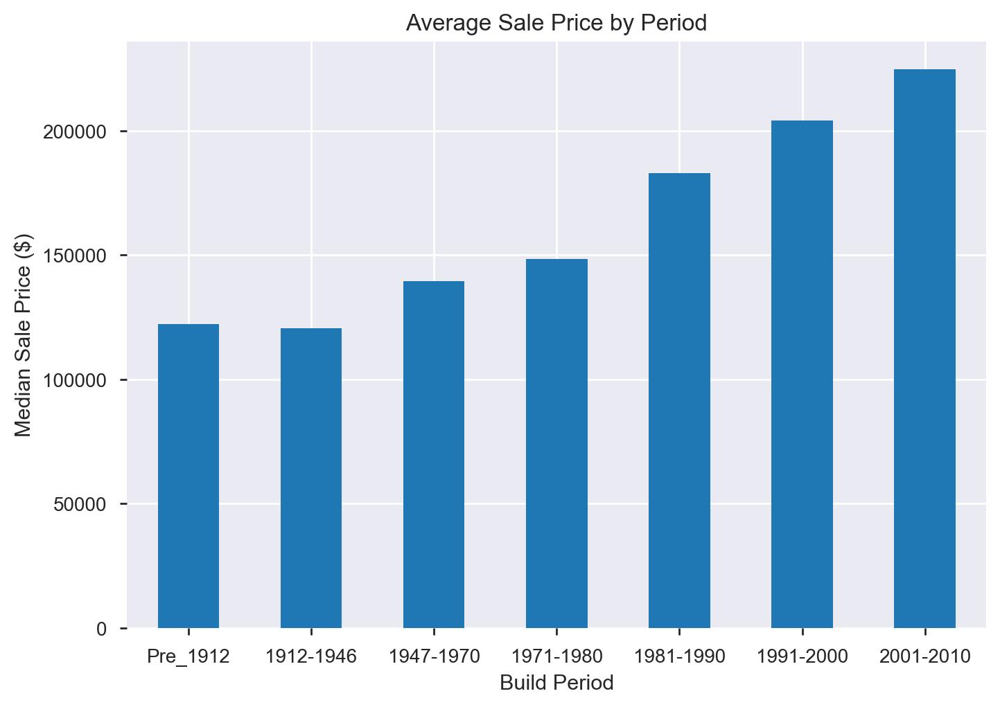

In [130]:
#Calculate median price by period built and then plot the median sale price for the period
year_brack_sale = house_clean.groupby(by=['year_bracket']).SalePrice.agg(np.median).round(decimals=0)
year_brack_sale = year_brack_sale[['Pre_1912', '1912-1946', '1947-1970','1971-1980','1981-1990','1991-2000','2001-2010']]
year_brack_sale.plot(kind='bar', rot=0,)
plt.title('Average Sale Price by Period')
plt.xlabel('Build Period')
plt.ylabel('Median Sale Price ($)')
#As can be seen in the graph, the period the house was built influences sale price, with more recent
#builds showing higher sale prices compared to older properties.
plt.show()

In [131]:
house_clean.groupby(by=['year_bracket']).size()

year_bracket
1912-1946    239
1947-1970    397
1971-1980    174
1981-1990     63
1991-2000    175
2001-2010    364
Pre_1912      48
dtype: int64

In [132]:
#Would be more useful to have year ranges for different house build eras rather than specific years that
#may contribute to overfitting of the model is modelled in this way. Thus below maps years to year spans using the np.select method
year_map2 = [house_clean['YearBuilt'].between(0, 1979), 
            house_clean['YearBuilt'].between(1980, 2010)]
values2 = ['Prior to 1980', '1980+']

house_clean['Pre_1980'] = np.select(year_map2, values2, 0)

In [133]:
house_clean.groupby(by=['Pre_1980']).size()

Pre_1980
1980+            612
Prior to 1980    848
dtype: int64

In [134]:
#Checking if has any null values that may need recoding
house_clean.Foundation.isnull().sum()

0

In [135]:
#Investigating class sizes
house_clean.groupby(by='Foundation').size()

Foundation
BrkTil    146
CBlock    634
PConc     647
Slab       24
Stone       6
Wood        3
dtype: int64

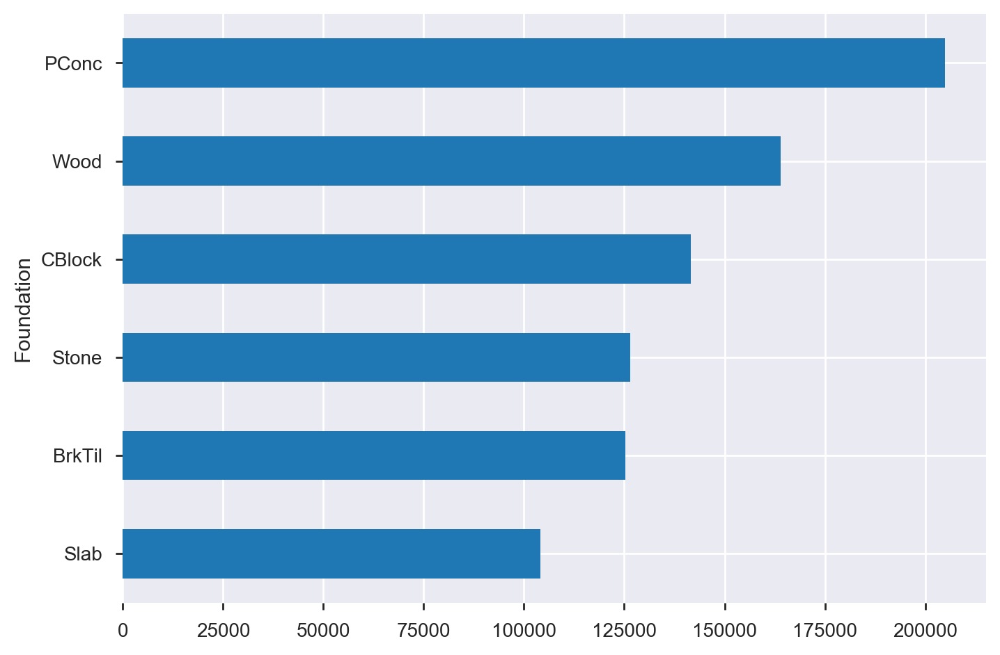

In [136]:
Foundation_sale = house_clean.groupby(by=['Foundation']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

Foundation_sale.plot(kind='barh', rot=0)

In [137]:
#There is no flags for basement or no basement. 
#Therefore will use the BsmtQual to calculate a Basement vs. no basement variable

In [138]:
#Checking if has any null values that may need recoding
#Looking at data dictionary, 37 are coded are null values indicating no basement.
house_clean.BsmtQual.isnull().sum()

37

In [139]:
#Investigating class sizes
house_clean.groupby(by='BsmtQual').size()

BsmtQual
Ex    121
Fa     35
Gd    618
TA    649
dtype: int64

In [140]:
#Recode BsmtQual null values to No Basement to match data dictionary and facilitate modelling
house_clean['Basement_recoded']= house_clean['BsmtQual']
house_clean["Basement_recoded"].fillna('No_basement', inplace = True)

In [141]:
#Investigating class sizes. Quite imbalanced. Probably can be left out
house_clean.groupby(by='Basement_recoded').size()

Basement_recoded
Ex             121
Fa              35
Gd             618
No_basement     37
TA             649
dtype: int64

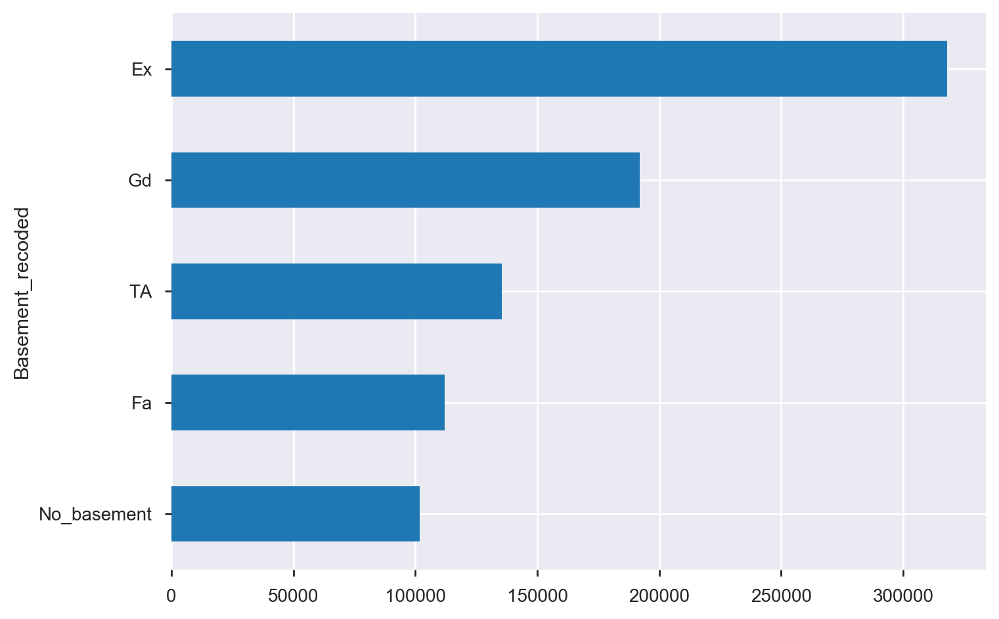

In [142]:
basement_sale = house_clean.groupby(by=['Basement_recoded']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

basement_sale.plot(kind='barh', rot=0)

In [143]:
#Checking if has any null values that may need recoding
house_clean.LotArea.isnull().sum()

0

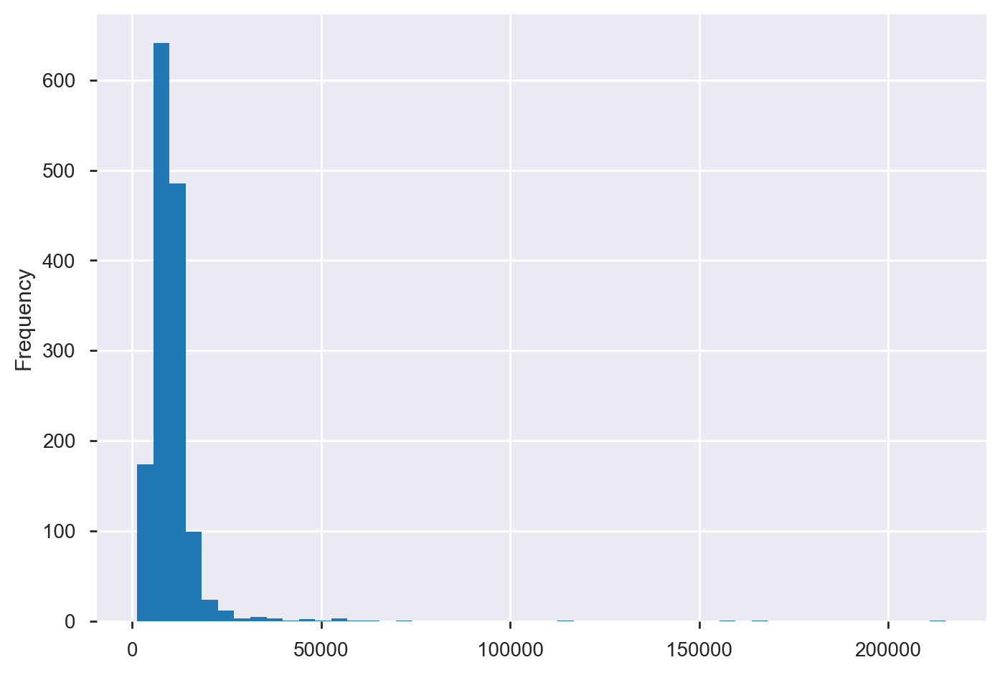

In [144]:
#Reviewing distribution of LotArea. 
house_clean['LotArea'].plot(kind='hist',bins=50)

In [145]:
#Investigating extreme upper and lower ranges for LotArea in terms of outlier ranges against IQR*3 criteria
upper_LotArea = ((np.quantile([house_clean['LotArea']],0.75) - np.quantile([house_clean['LotArea']],0.25))*3) + np.quantile([house_clean['LotArea']],0.75)
lower_LotArea = (np.quantile([house_clean['LotArea']],0.25)-(np.quantile([house_clean['LotArea']],0.75) - np.quantile([house_clean['LotArea']],0.25))*3)

print("Upper:",upper_LotArea)
print("Lower:",lower_LotArea)

Upper: 23745.5
Lower: -4590.5


In [146]:
house_clean[house_clean['LotArea']>upper_LotArea].SalePrice.agg(np.median)

231975.0

In [147]:
house_clean[house_clean['LotArea']<upper_LotArea].SalePrice.agg(np.median)

161875.0

In [148]:
#Investigating relationships between log of Lot Area and log of Sale price
house_clean['log_LotArea'] = np.log(house_clean['LotArea'])

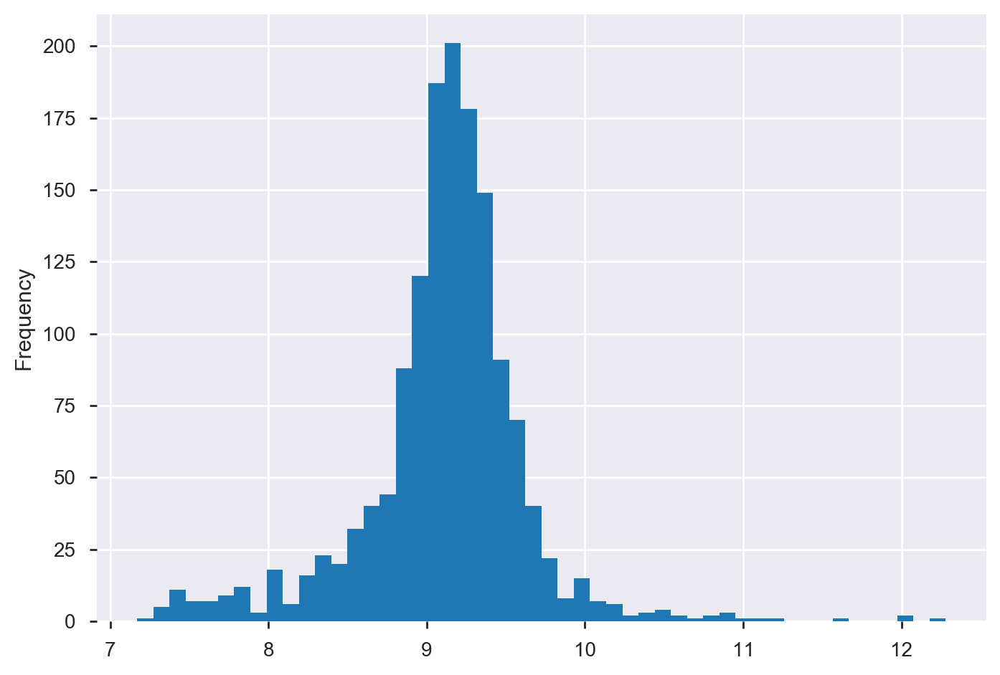

In [149]:
np.log(house_clean['LotArea']).plot(kind='hist',bins=50)

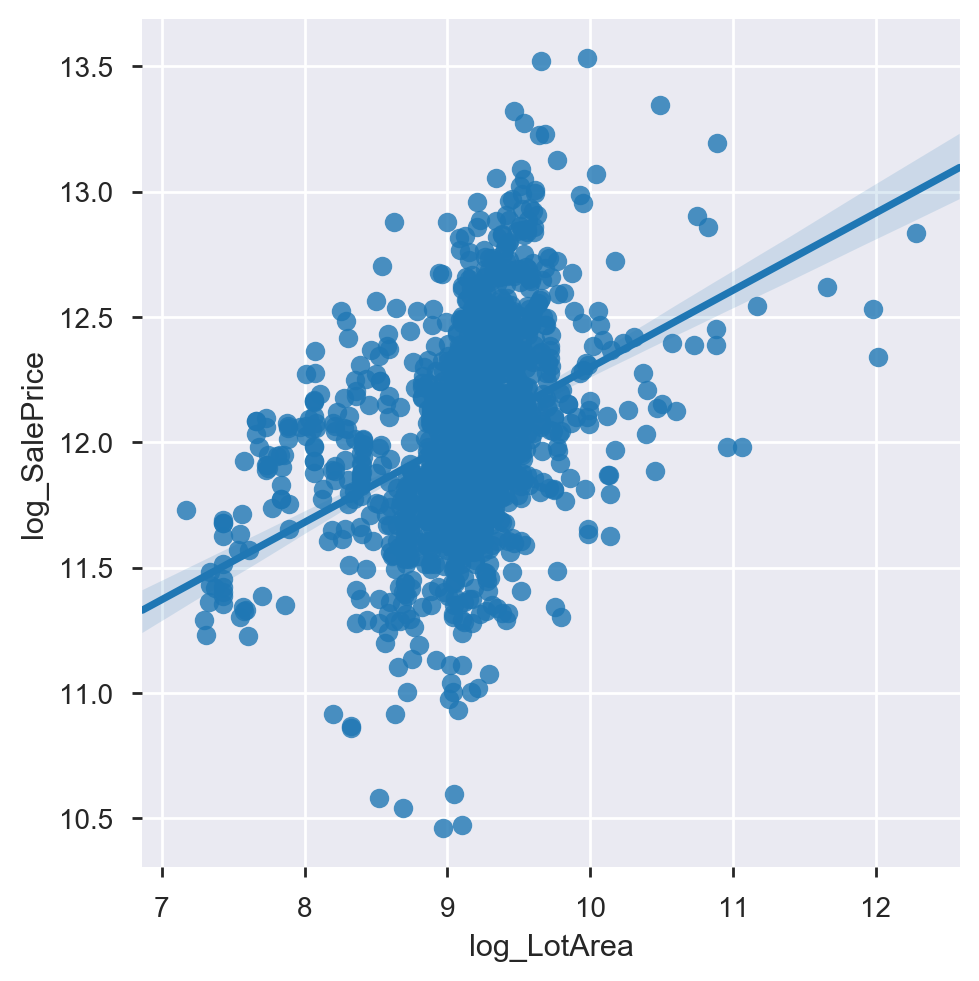

In [150]:
sns.lmplot(x='log_LotArea',y='log_SalePrice',data=house_clean)

In [151]:
#Investigating correlations between log_LotArea and log_sale prices
print(stats.pearsonr(house_clean.log_LotArea,house_clean.log_SalePrice))
print(stats.spearmanr(house_clean.log_LotArea,house_clean.log_SalePrice))

(0.3999177411255904, 3.474294176396012e-57)
SpearmanrResult(correlation=0.4564605833912115, pvalue=4.8715809571702074e-76)


In [152]:
#Checking if has any null values that may need recoding
house_clean.MSZoning.isnull().sum()

0

In [153]:
#Checking if has any null values that may need recoding
house_clean.MSZoning.unique()

array(['RL', 'RM', 'C (all)', 'FV', 'RH'], dtype=object)

In [154]:
#Checking sizes of classes in MSZoning. 
house_clean.groupby(by="MSZoning").size()

MSZoning
C (all)      10
FV           65
RH           16
RL         1151
RM          218
dtype: int64

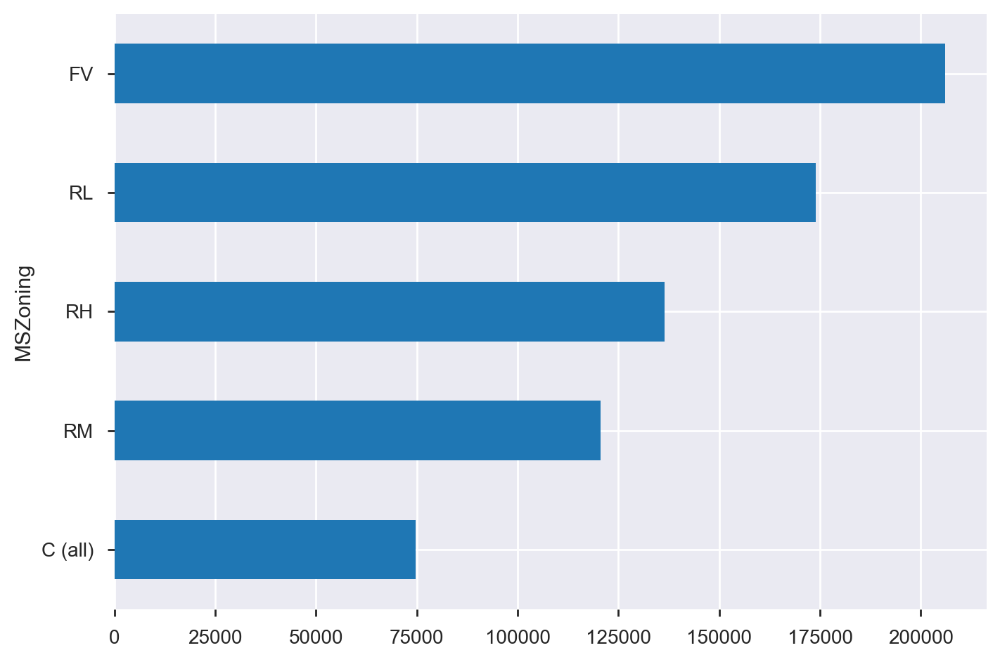

In [155]:
#Investigating median prices by MSZOning
zoning_sale = house_clean.groupby(by=['MSZoning']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

zoning_sale.plot(kind='barh', rot=0)
#Results suggest that Commerical properties much lower than other residental properties
#zoning of location may influence land prices due to differ limitation/opportunities applied 
#to the land zoning.

In [156]:
#Assessing whether month sold has influence of sales as may have a seasonality in prices.

In [157]:
#Checking if has any null values that may need recoding
house_clean.MoSold.isnull().sum()

0

In [158]:
#Checking logic of month build. Looks logical min and max values and averages
house_clean.MoSold.describe()

count    1460.000000
mean        6.321918
std         2.703626
min         1.000000
25%         5.000000
50%         6.000000
75%         8.000000
max        12.000000
Name: MoSold, dtype: float64

In [159]:
#Recoding a new variable for MoSold for easier interpretation
house_clean["MoSold_recoded"] = house_clean["MoSold"].map({1: 'Jan', 
                                                       2: 'Feb',
                                                       3: 'Mar',
                                                       4: 'Apr',
                                                       5: 'May',
                                                       6: 'Jun',
                                                       7: 'Jul',
                                                       8: 'Aug',
                                                       9: 'Sep',
                                                       10: 'Oct',
                                                       11: 'Nov',
                                                       12: 'Dec'
                                                      }) 

In [160]:
#Checking sizes of classes in MoSold_recoded. 
house_clean.groupby(by="MoSold_recoded").size()

MoSold_recoded
Apr    141
Aug    122
Dec     59
Feb     52
Jan     58
Jul    234
Jun    253
Mar    106
May    204
Nov     79
Oct     89
Sep     63
dtype: int64

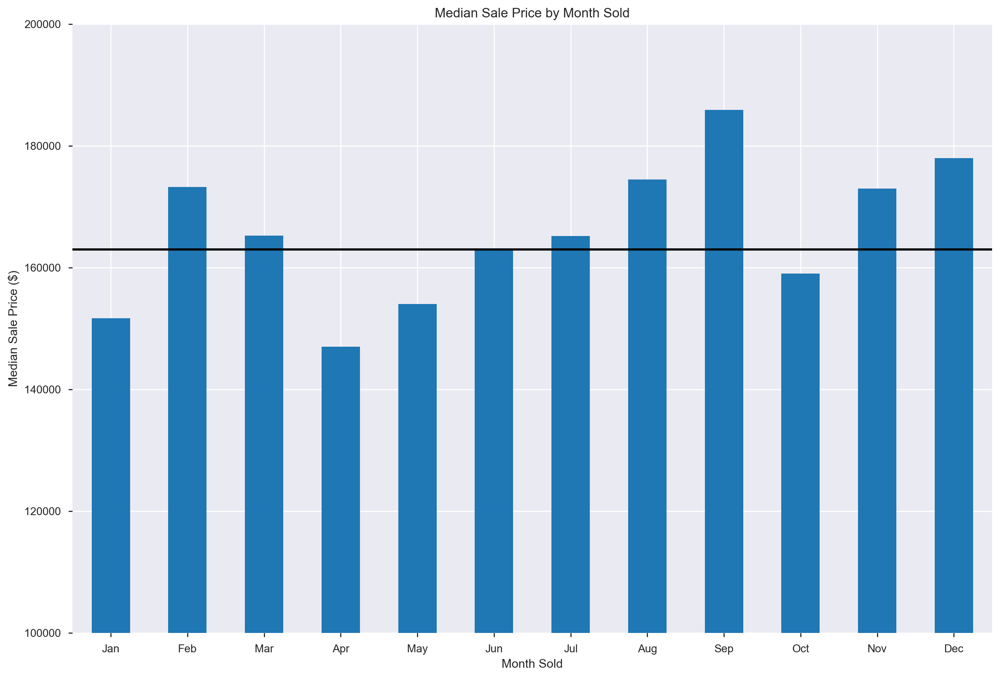

In [161]:
#Calculate average price by month sold and then plot the median sale price for month
month_brack_sale = house_clean.groupby(by=['MoSold_recoded']).SalePrice.agg(np.median).round(decimals=0)
month_brack_sale = month_brack_sale[['Jan', 'Feb', 'Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
month_brack_sale.plot(kind='bar', 
                      rot=0,
                      figsize=(15,10))
plt.title('Median Sale Price by Month Sold')
plt.xlabel('Month Sold')
plt.ylabel('Median Sale Price ($)')
plt.ylim(100000, 200000)

#There are some changes in house prices across months, which may reflect seasonaility. 
#Plots the mean sale price on the graph
plt.axhline(house_clean["SalePrice"].median(), color='black', linewidth=2)
plt.show()

In [162]:
#Checking if has any null values that may need recoding
house_clean['GrLivArea'].isnull().sum()

0

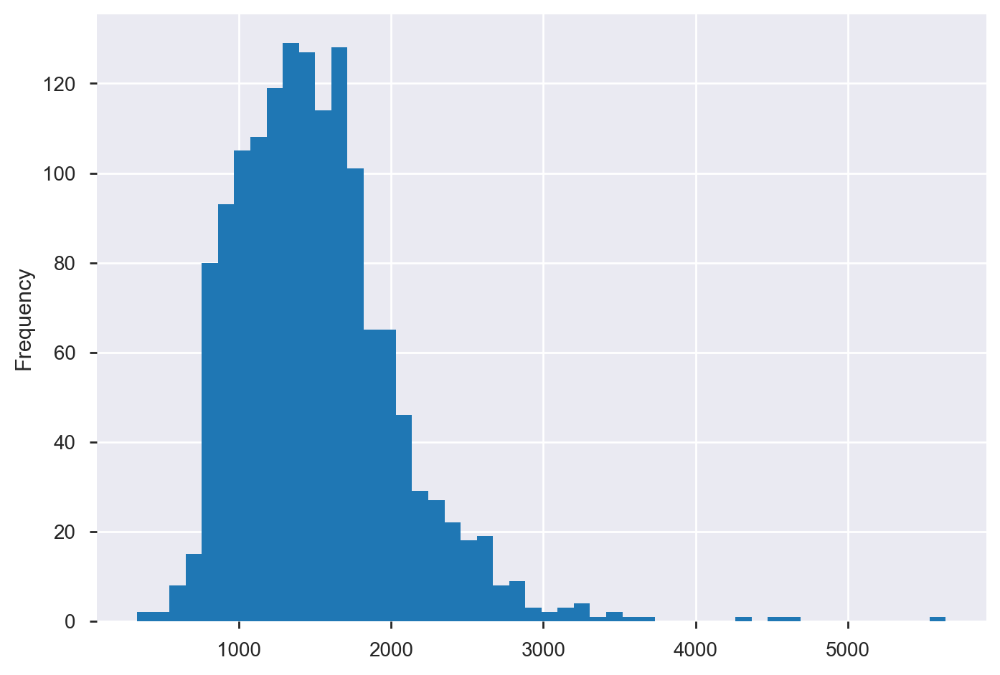

In [163]:
#Reviewing distribution of GrLivArea. 
#Shows highly similar distribution to overall area and thus unlikely to add any new info. Can be dropped.
house_clean['GrLivArea'].plot(kind='hist',bins=50)

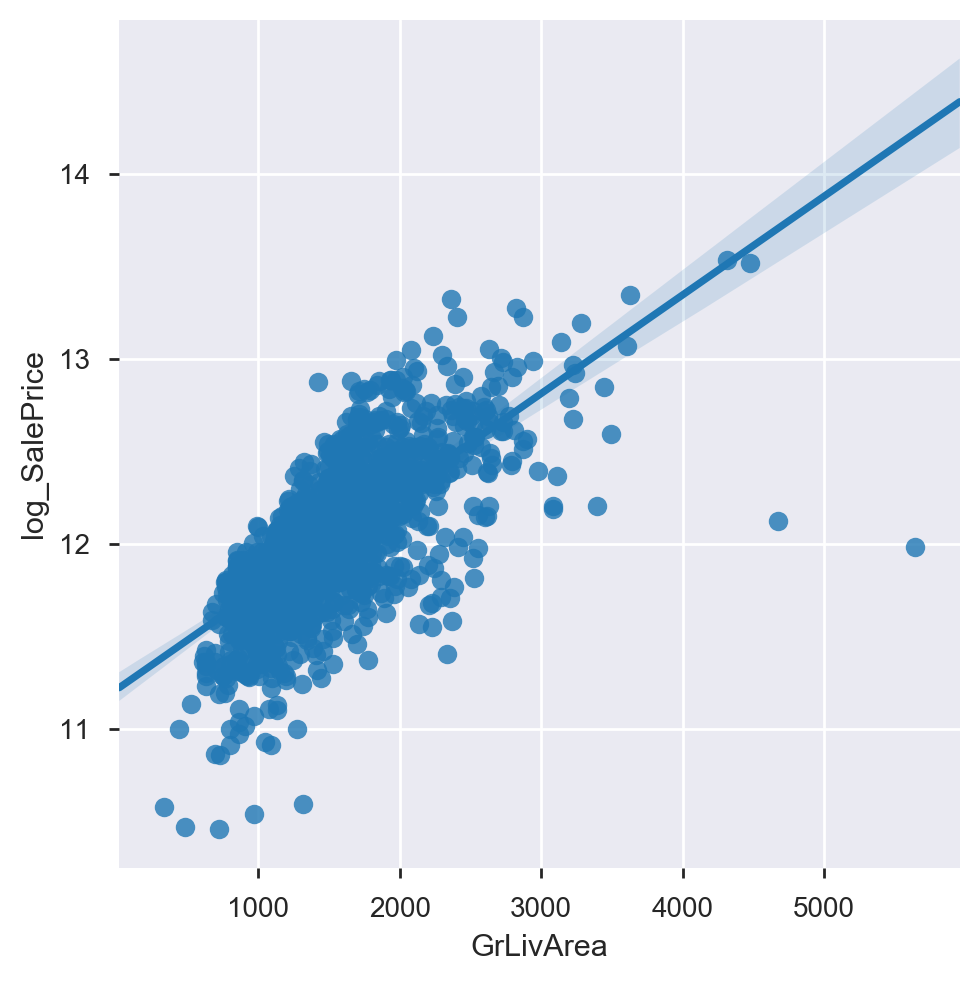

In [164]:
#Investigating relationship between GrLivArea and log_SalePrice
sns.lmplot(x='GrLivArea',y='log_SalePrice',data=house_clean)

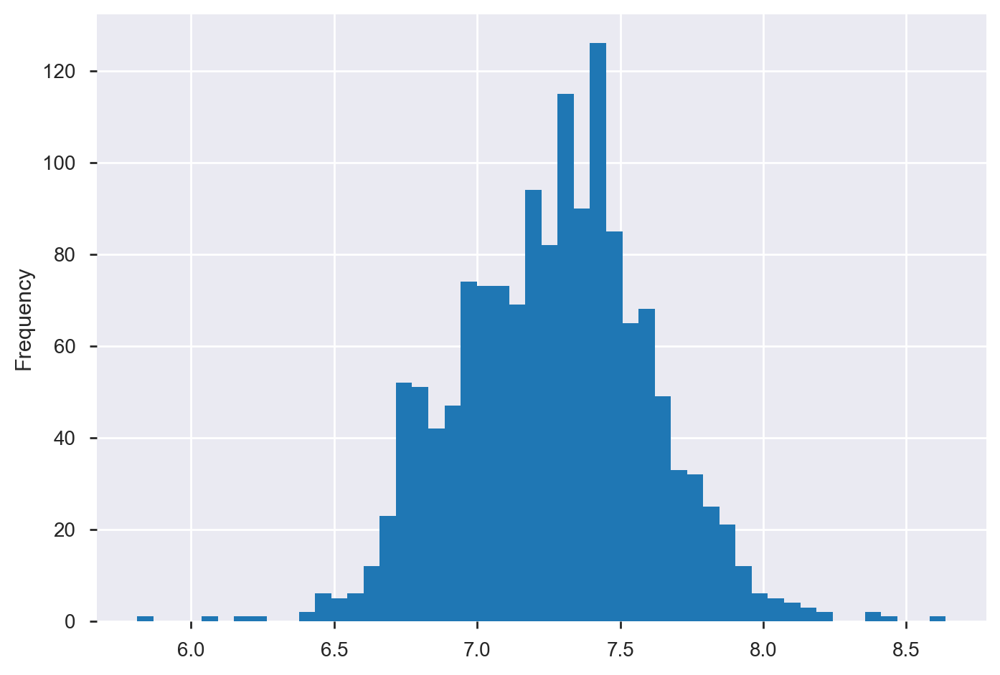

In [165]:
#Investigating log transform of GrLivArea
house_clean['GrLivArea'].agg(np.log).plot(kind='hist',bins=50)

In [166]:
#Recoding a new variable for MoSold for easier interpretation
house_clean["log_GrLivArea"] = house_clean['GrLivArea'].agg(np.log).copy()

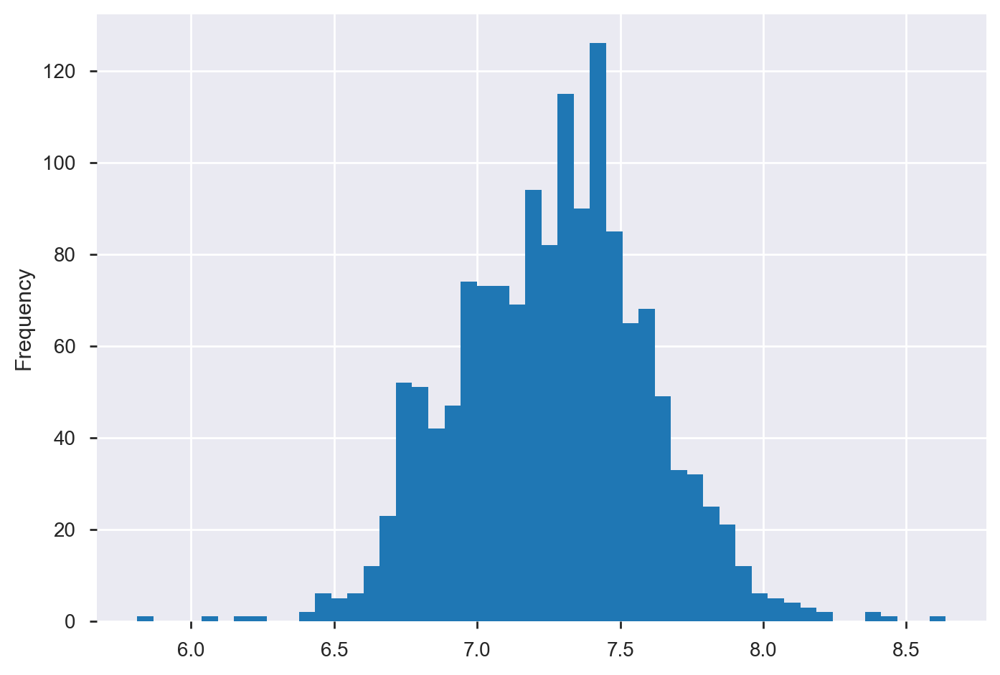

In [167]:
house_clean['log_GrLivArea'].plot(kind='hist',bins=50)

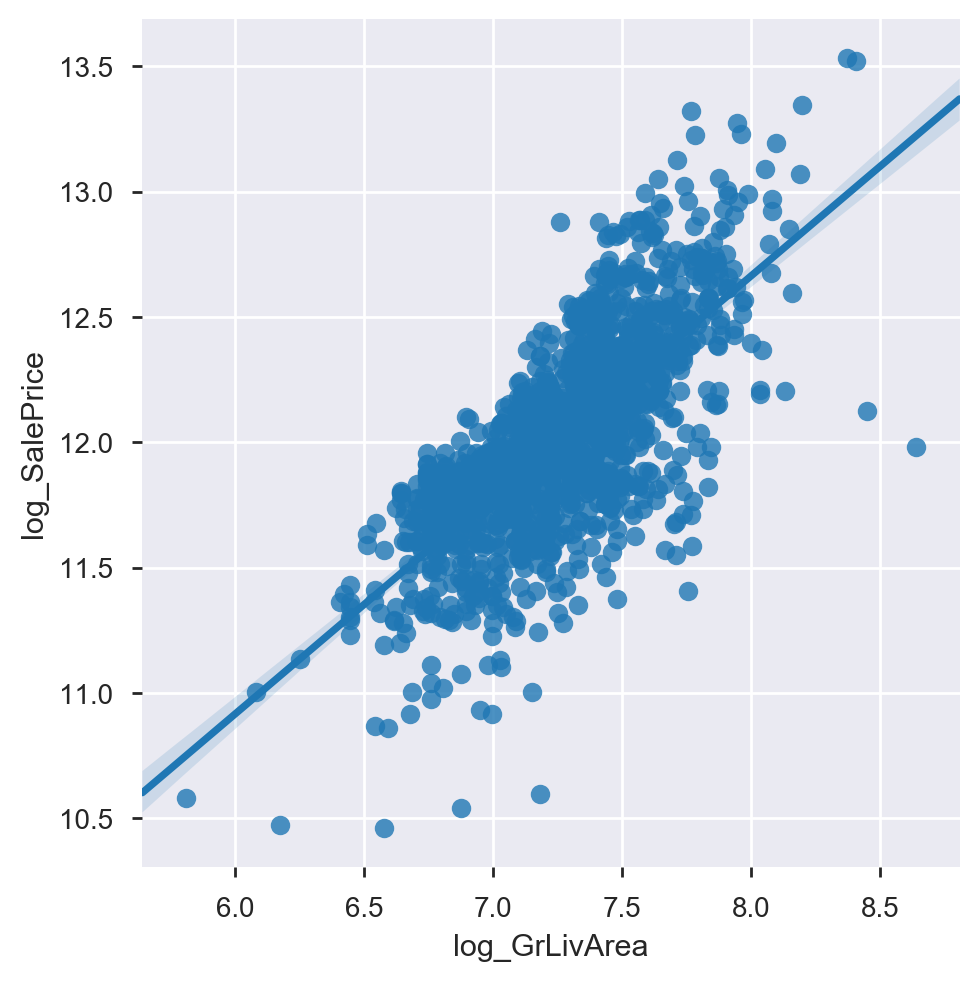

In [168]:
#Investigating relationship between log_GrLivArea and log_SalePrice
sns.lmplot(x='log_GrLivArea',y='log_SalePrice',data=house_clean)

In [169]:
#Checking if has any null values that may need recoding
house_clean['FullBath'].isnull().sum()

0

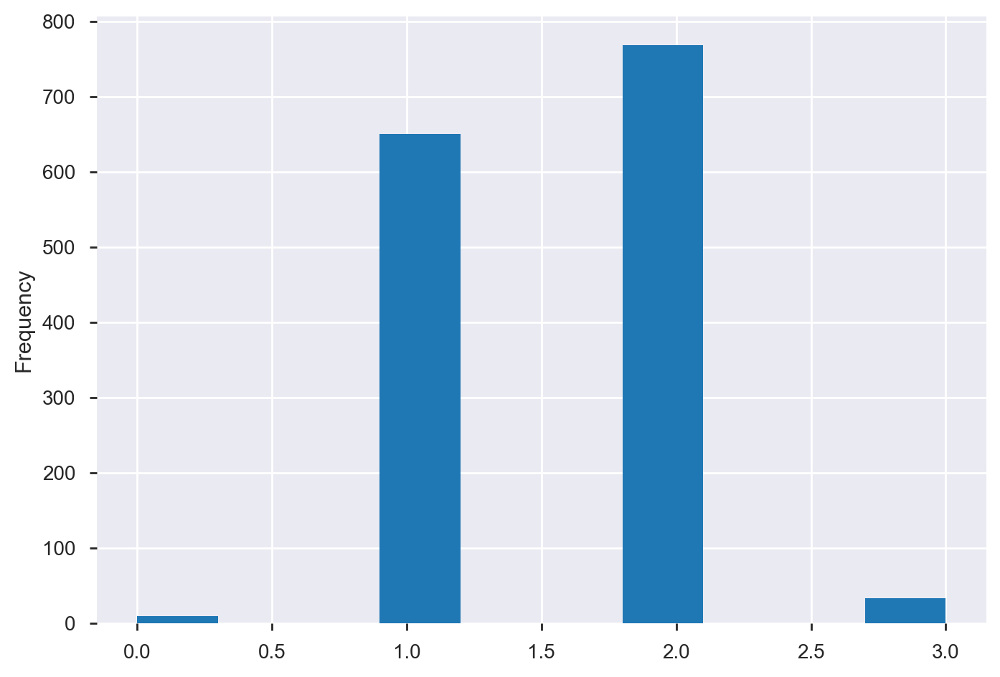

In [170]:
#Reviewing distribution of FullBath. 
house_clean['FullBath'].plot(kind='hist')

In [171]:
#Checking if has any null values that may need recoding
house_clean['BsmtFullBath'].isnull().sum()

0

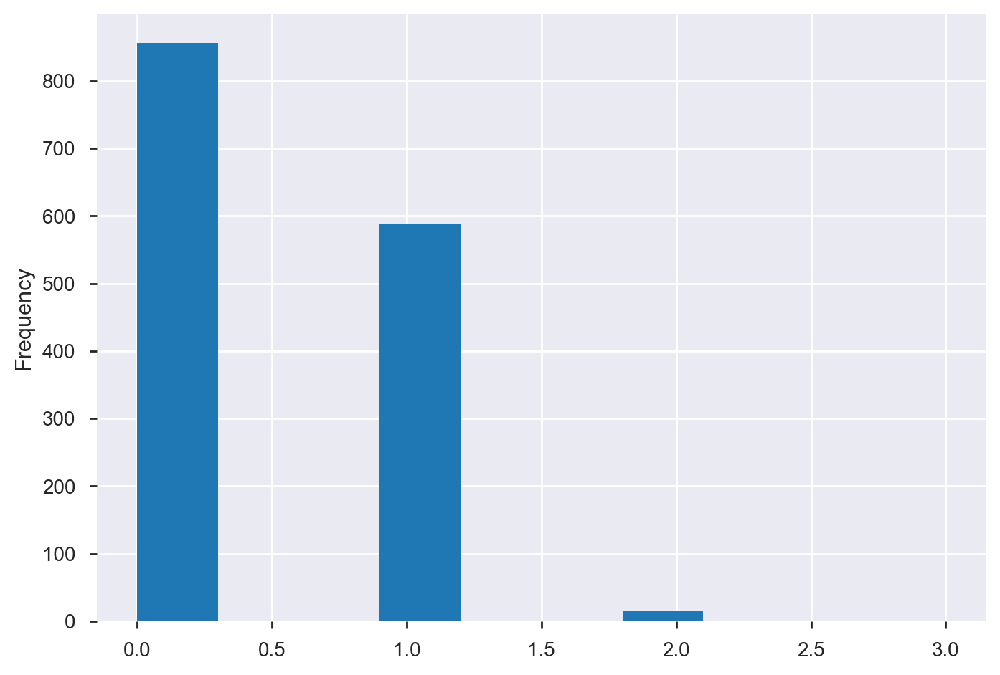

In [172]:
#Reviewing distribution of FullBath. 
house_clean['BsmtFullBath'].plot(kind='hist')

In [173]:
house_clean[house_clean['FullBath'] == 0]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,Utilities,LotConfig,...,alley_recoded,Condition1_recoded,HouseStyle_recoded,House_Finished_Status,year_bracket,Pre_1980,Basement_recoded,log_LotArea,MoSold_recoded,log_GrLivArea
53,54,20,RL,68.0,50271,NaN,IR1,Low,AllPub,Inside,...,No_alley_access,Norm,1.0_storeys,Finished,1981-1990,1980+,Ex,10.825184,Nov,7.518607
188,189,90,RL,64.0,7018,NaN,Reg,Bnk,AllPub,Inside,...,No_alley_access,On or near Artery or Feeder Road,Split_Foyer,Finished,1971-1980,Prior to 1980,Gd,8.856234,Jun,7.109879
375,376,30,RL,NaN,10020,NaN,IR1,Low,AllPub,Inside,...,No_alley_access,Norm,1.0_storeys,Finished,1912-1946,Prior to 1980,Fa,9.212338,Mar,6.806829
597,598,120,RL,53.0,3922,NaN,Reg,Lvl,AllPub,Inside,...,No_alley_access,Norm,1.0_storeys,Finished,2001-2010,1980+,Ex,8.274357,Feb,7.245655
634,635,90,RL,64.0,6979,NaN,Reg,Lvl,AllPub,Inside,...,No_alley_access,Norm,Split_Foyer,Finished,1971-1980,1980+,TA,8.850661,Jun,6.962243
916,917,20,C (all),50.0,9000,NaN,Reg,Lvl,AllPub,Inside,...,No_alley_access,Norm,1.0_storeys,Finished,1947-1970,Prior to 1980,TA,9.104980,Oct,6.173786
1163,1164,90,RL,60.0,12900,NaN,Reg,Lvl,AllPub,Inside,...,No_alley_access,On or near Artery or Feeder Road,Split_Foyer,Finished,1947-1970,Prior to 1980,Gd,9.464983,Jan,7.137278
1213,1214,80,RL,NaN,10246,NaN,IR1,Lvl,AllPub,CulDSac,...,No_alley_access,Norm,Split_Level,Finished,1947-1970,Prior to 1980,TA,9.234643,May,6.866933
1270,1271,40,RL,NaN,23595,NaN,Reg,Low,AllPub,Inside,...,No_alley_access,Norm,1.0_storeys,Finished,1971-1980,Prior to 1980,Gd,10.068790,Apr,7.329094


In [174]:
#Calculating total full bathrooms from BsmtFullBath, FullBath

In [175]:
house_clean['total_full_baths'] = house_clean['BsmtFullBath'] + house_clean['FullBath']

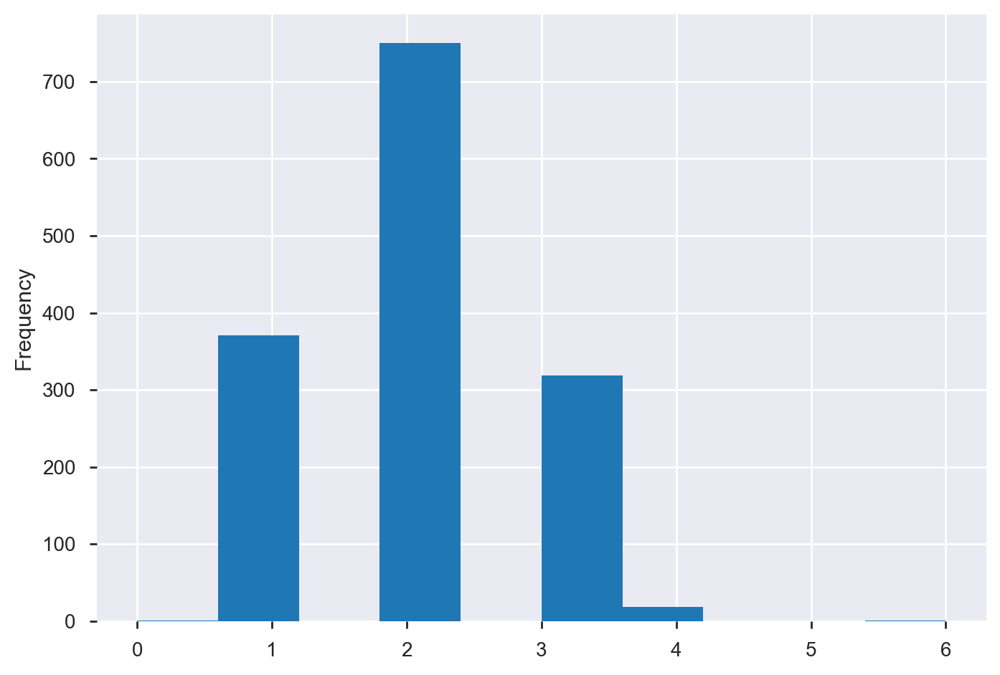

In [176]:
#Reviewing distribution of FullBath. 
house_clean['total_full_baths'].plot(kind='hist')

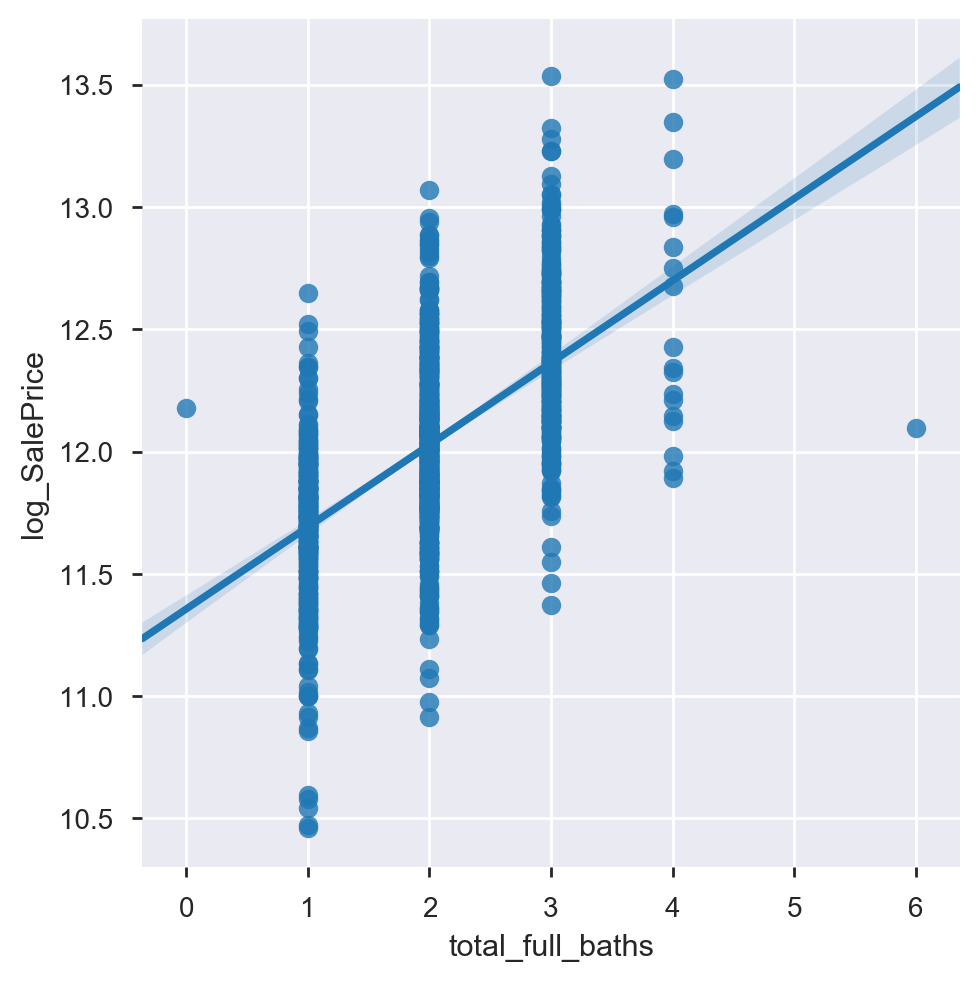

In [177]:
#Investigating relationship between log_GrLivArea and log_SalePrice
sns.lmplot(x='total_full_baths',y='log_SalePrice',data=house_clean)

In [178]:
house_clean.total_full_baths.unique()

array([3, 2, 4, 1, 0, 6], dtype=int64)

In [179]:
#Calculating total half bathrooms from BsmtHalfBath, HalfBath

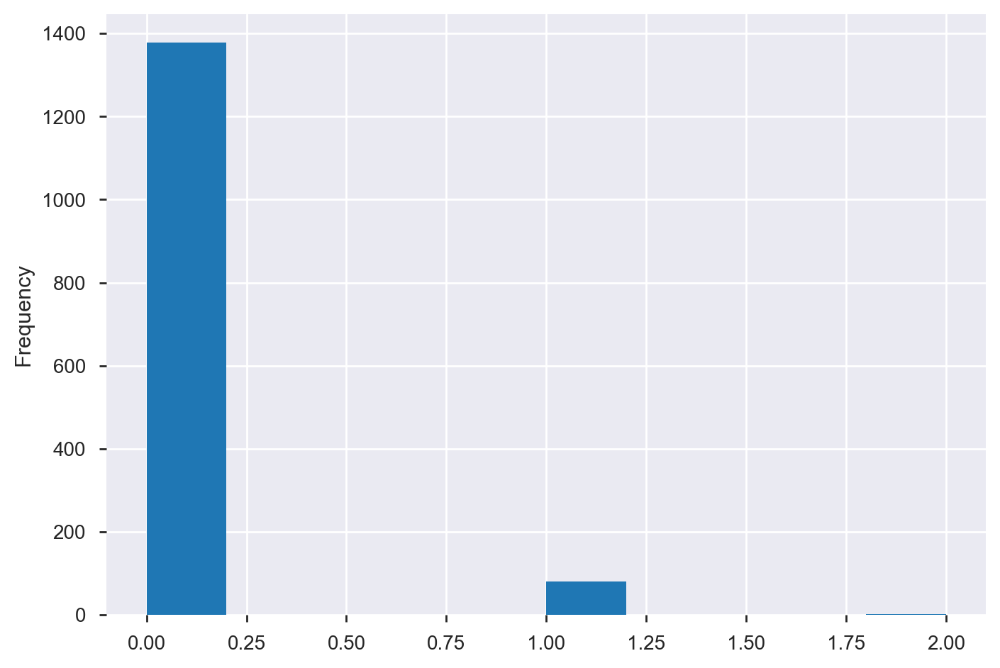

In [180]:
#Reviewing distribution of FullBath. 
house_clean['BsmtHalfBath'].plot(kind='hist')

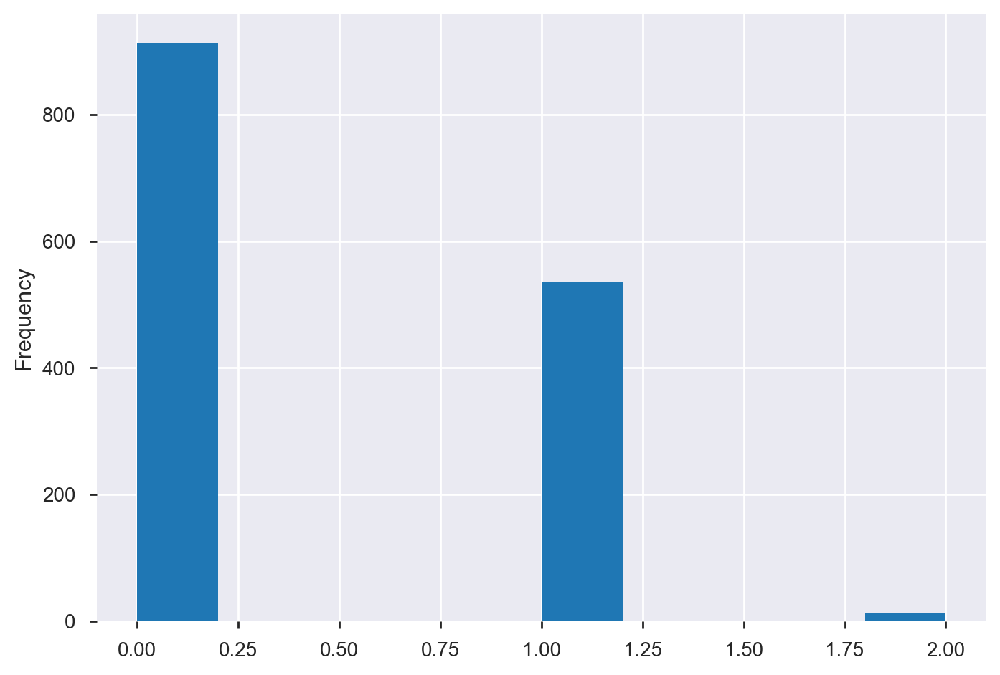

In [181]:
#Reviewing distribution of FullBath. 
house_clean['HalfBath'].plot(kind='hist')

In [182]:
house_clean['total_half_baths'] = house_clean['HalfBath'] + house_clean['BsmtHalfBath']

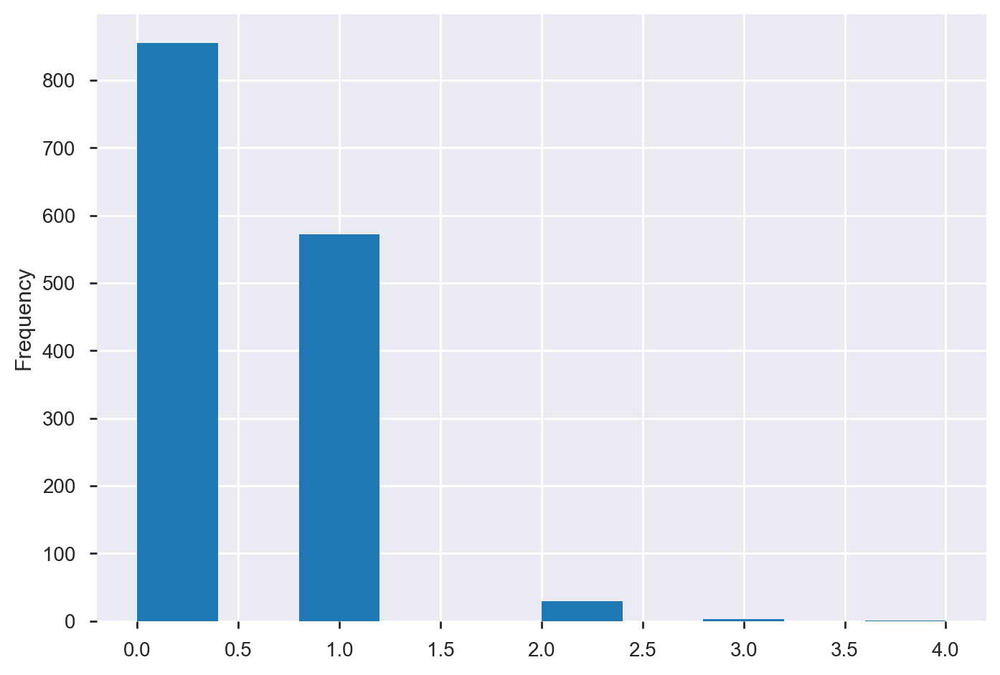

In [183]:
#Reviewing distribution of total_half_baths. 
house_clean['total_half_baths'].plot(kind='hist')

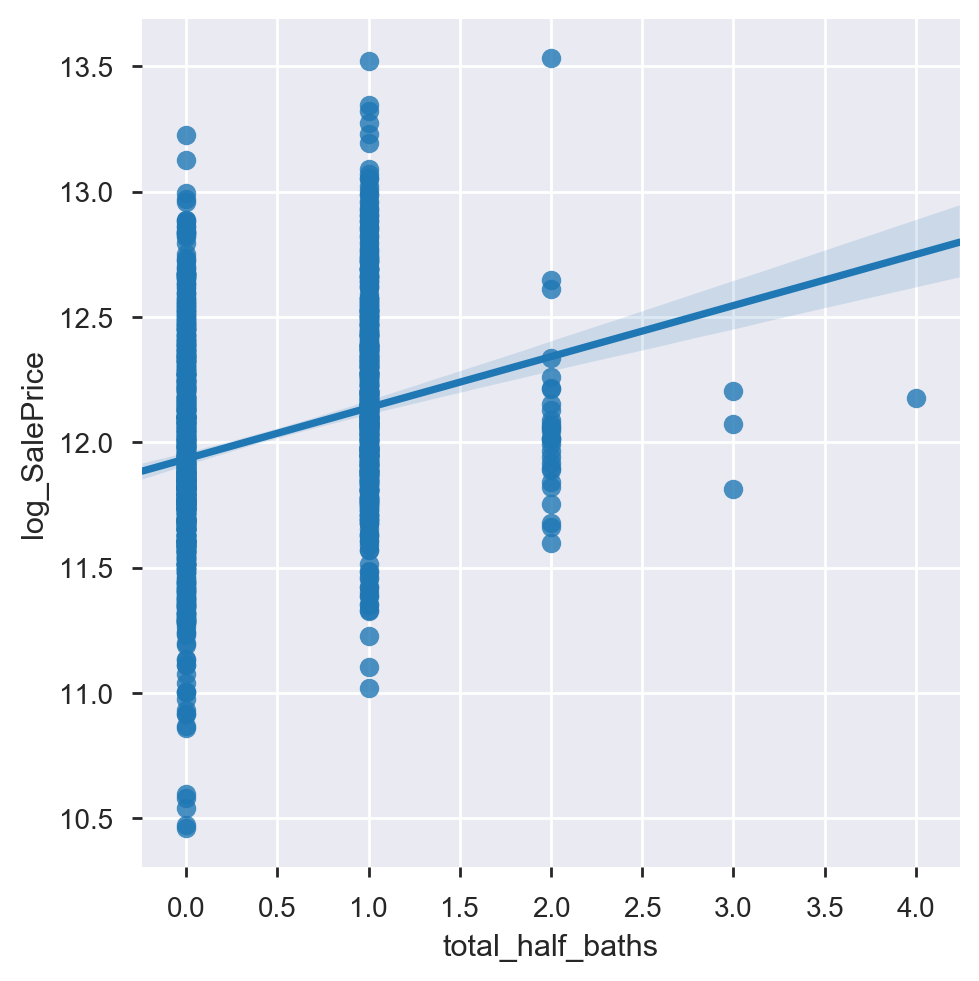

In [184]:
#Investigating relationship between log_GrLivArea and log_SalePrice
sns.lmplot(x='total_half_baths',y='log_SalePrice',data=house_clean)

In [185]:
house_clean['total_bathrooms'] = house_clean['total_half_baths'] + house_clean['total_full_baths']

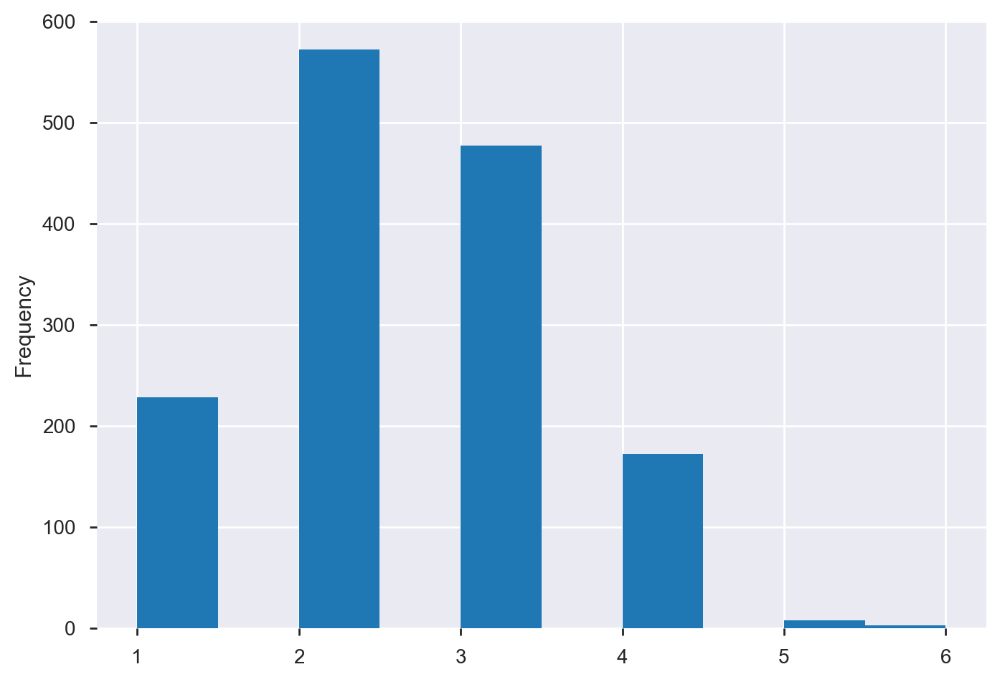

In [186]:
#Reviewing distribution of total_bathrooms. 
house_clean['total_bathrooms'].plot(kind='hist')

In [187]:
#Checking if has any null values that may need recoding
house_clean['BedroomAbvGr'].isnull().sum()

0

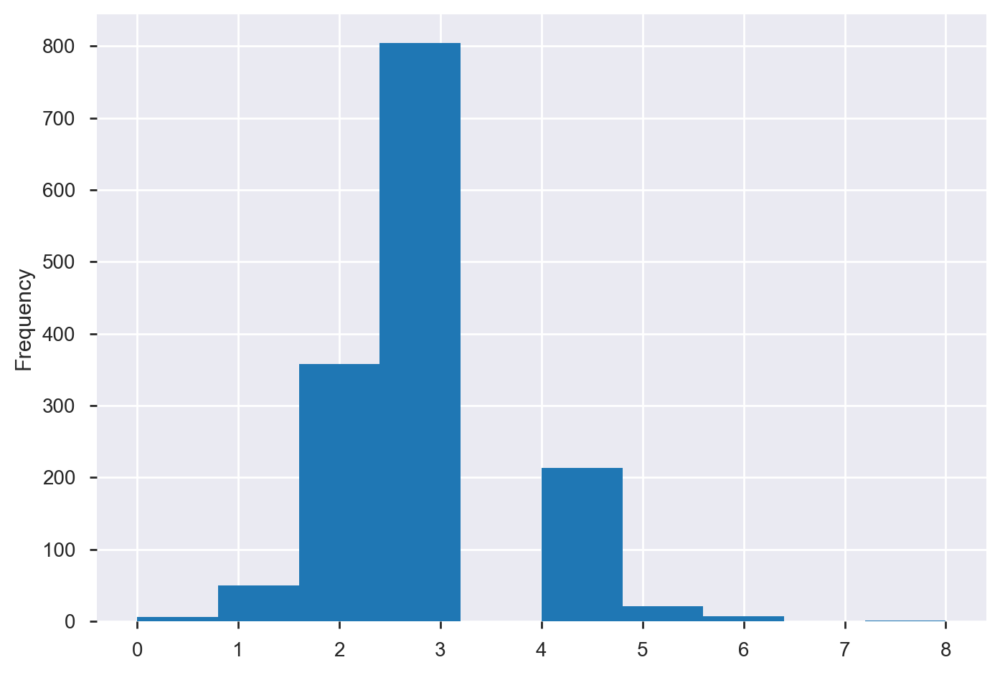

In [188]:
#Reviewing distribution of BedroomAbvGr. 
house_clean['BedroomAbvGr'].plot(kind='hist')

In [189]:
#Calculating Ratio of beds to baths.
#Scores >1 indicate higher ratio of beds to baths while <1 more baths to beds. 1 = same number of beds and baths
house_clean['bed_bath_ratio'] = house_clean['BedroomAbvGr'] / house_clean['total_bathrooms']

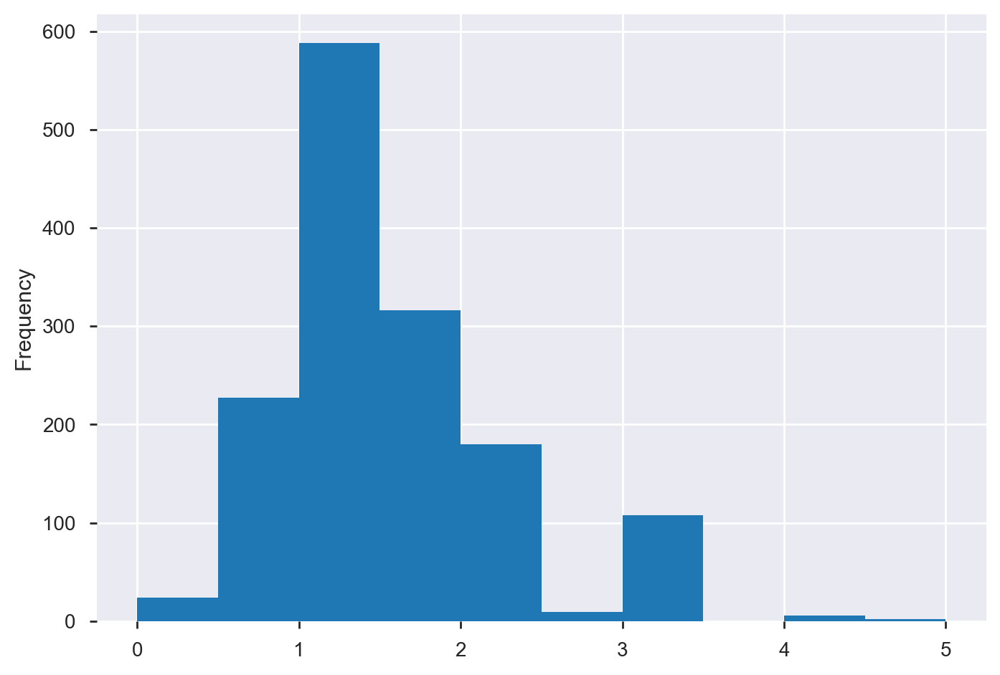

In [190]:
#Reviewing distribution of BedroomAbvGr. 
house_clean['bed_bath_ratio'].plot(kind='hist')

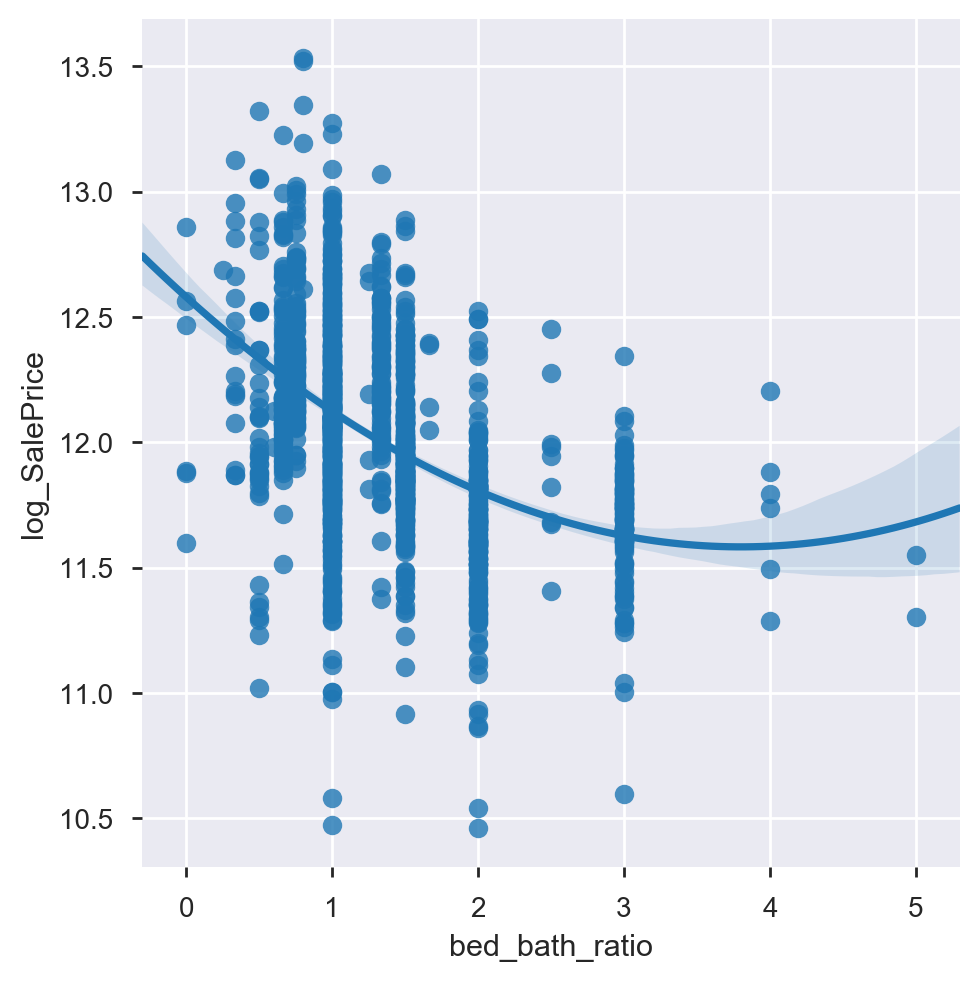

In [191]:
#Investigating relationship between bed_bath_ratio and log_SalePrice
sns.lmplot(x='bed_bath_ratio',y='log_SalePrice',data=house_clean, order=2 )

In [192]:
#Checking if has any null values that may need recoding
#Shows that properties with no garages are coded as null
house_clean['GarageType'].isnull().sum()

81

In [193]:
#Create new recoded GarageType variable to work on and fill nulls with no garage as per data dictionary
house_clean["GarageType_recoded"] = house_clean["GarageType"]
house_clean["GarageType_recoded"].fillna('No_Garage', inplace = True)

In [194]:
#Confirming null values changed
house_clean['GarageType_recoded'].isnull().sum()

0

In [195]:
house_clean.groupby(by='GarageType_recoded').size()

GarageType_recoded
2Types         6
Attchd       870
Basment       19
BuiltIn       88
CarPort        9
Detchd       387
No_Garage     81
dtype: int64

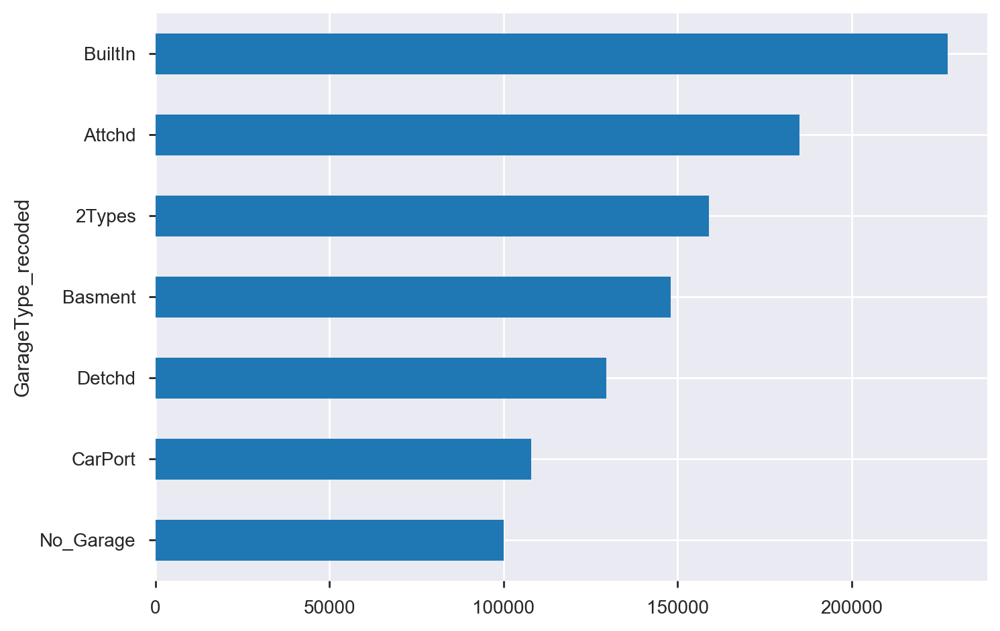

In [196]:
garage_sale = house_clean.groupby(by=['GarageType_recoded']).SalePrice.agg(np.median).round(decimals=0).sort_values(ascending=True)

garage_sale.plot(kind='barh', rot=0)

**Model Training & Testing**

In [197]:
#Import sklearn libraries for use in modeeling.
from sklearn.linear_model import Ridge, Lasso, ElasticNet, LinearRegression, RidgeCV, LassoCV, ElasticNetCV
from sklearn.model_selection import cross_val_score, cross_val_predict, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import SelectFromModel
from sklearn import metrics
import statsmodels.api as sm

In [198]:
house_clean.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Alley',
       'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl',
       'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure',
       'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical',
       '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath',
       'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces',
       'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish',
       'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive',
       'WoodDeckSF', 'OpenPo

In [199]:
variable_dummy_list = house_clean[['alley_recoded',
                                    'LotShape',
                                    'LotConfig',
                                    'LandSlope',
                                    'Neighborhood',
                                    'Condition1_recoded',
                                    'BldgType',
                                    'HouseStyle',
                                    'Basement_recoded',
                                    'MSZoning',
                                    'MoSold_recoded',
                                    'House_Finished_Status',
                                    'HouseStyle_recoded',
                                    'GarageType_recoded'
                                    '']]

In [200]:
variable_dummy_list

,alley_recoded,LotShape,LotConfig,LandSlope,Neighborhood,Condition1_recoded,BldgType,HouseStyle,Basement_recoded,MSZoning,MoSold_recoded,House_Finished_Status,HouseStyle_recoded,GarageType_recoded
0,No_alley_access,Reg,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gd,RL,Feb,Finished,2.0_storeys,Attchd
1,No_alley_access,Reg,FR2,Gtl,Veenker,On or near Artery or Feeder Road,1Fam,1Story,Gd,RL,May,Finished,1.0_storeys,Attchd
2,No_alley_access,IR1,Inside,Gtl,CollgCr,Norm,1Fam,2Story,Gd,RL,Sep,Finished,2.0_storeys,Attchd
3,No_alley_access,IR1,Corner,Gtl,Crawfor,Norm,1Fam,2Story,TA,RL,Feb,Finished,2.0_storeys,Detchd
4,No_alley_access,IR1,FR2,Gtl,NoRidge,Norm,1Fam,2Story,Gd,RL,Dec,Finished,2.0_storeys,Attchd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,No_alley_access,Reg,Inside,Gtl,Gilbert,Norm,1Fam,2Story,Gd,RL,Aug,Finished,2.0_storeys,Attchd
1456,No_alley_access,Reg,Inside,Gtl,NWAmes,Norm,1Fam,1Story,Gd,RL,Feb,Finished,1.0_storeys,Attchd
1457,No_alley_access,Reg,Inside,Gtl,Crawfor,Norm,1Fam,2Story,TA,RL,May,Finished,2.0_storeys,Attchd
1458,No_alley_access,Reg,Inside,Gtl,NAmes,Norm,1Fam,1Story,TA,RL,Apr,Finished,1.0_storeys,Attchd


In [201]:
variable_dummy_list = pd.get_dummies(variable_dummy_list)

In [202]:
variable_dummy_list.columns.tolist()

['alley_recoded_Grvl',
 'alley_recoded_No_alley_access',
 'alley_recoded_Pave',
 'LotShape_IR1',
 'LotShape_IR2',
 'LotShape_IR3',
 'LotShape_Reg',
 'LotConfig_Corner',
 'LotConfig_CulDSac',
 'LotConfig_FR2',
 'LotConfig_FR3',
 'LotConfig_Inside',
 'LandSlope_Gtl',
 'LandSlope_Mod',
 'LandSlope_Sev',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Edwards',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_MeadowV',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NPkVill',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_OldTown',
 'Neighborhood_SWISU',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Condition1_recoded_AdjNear_positive',
 'Condition1_recoded_Ajacent or near railr

In [203]:
#Checking that house rows and variable_dummy are same row length for joining
print(house_clean.shape)
print(variable_dummy_list.shape)

(1460, 97)
(1460, 94)


In [204]:
house_clean = house_clean.join(variable_dummy_list)

In [205]:
#Create X and y variables for testing
#Reference categories for dummy variables are hashed out
X = house_clean[[ #'log_LotFrontage_recoded',
                     'log_LotArea',
                     'log_GrLivArea',
#                      'bed_bath_ratio',
                     'total_half_baths',
                     'total_full_baths',
#                      'YearBuilt',
                     'BedroomAbvGr',
#                      'GarageArea',
                     'GarageCars',
#                      'TotRmsAbvGrd',
                     # 'alley_recoded_No_alley_access',
#                      'alley_recoded_Grvl',
#                      'alley_recoded_Pave',
                     # 'LotShape_Reg',
#                      'LotShape_IR1',
#                      'LotShape_IR2',
#                      'LotShape_IR3',
                     # 'LotConfig_Inside',
#                      'LotConfig_Corner',
#                      'LotConfig_CulDSac',
#                      'LotConfig_FR2',
#                      'LotConfig_FR3',
#                      # 'LandSlope_Gtl',
#                      'LandSlope_Mod',
#                      'LandSlope_Sev',
                     'Neighborhood_Blmngtn',
                     'Neighborhood_Blueste',
                     'Neighborhood_BrDale',
                     'Neighborhood_BrkSide',
                     'Neighborhood_ClearCr',
                     'Neighborhood_CollgCr',
                     'Neighborhood_Crawfor',
                     'Neighborhood_Edwards',
                     'Neighborhood_Gilbert',
                     'Neighborhood_IDOTRR',
                     'Neighborhood_MeadowV',
                     'Neighborhood_Mitchel',
                     'Neighborhood_NAmes',
                     'Neighborhood_NPkVill',
                     'Neighborhood_NWAmes',
                     'Neighborhood_NoRidge',
                     'Neighborhood_NridgHt',
#                      'Neighborhood_OldTown',
                     'Neighborhood_SWISU',
                     'Neighborhood_Sawyer',
                     'Neighborhood_SawyerW',
                     'Neighborhood_Somerst',
                     'Neighborhood_StoneBr',
                     'Neighborhood_Timber',
                     'Neighborhood_Veenker',
#                      'Condition1_recoded_Norm',
#                      'Condition1_recoded_AdjNear_positive',
#                      'Condition1_recoded_Ajacent or near railroad',
#                      'Condition1_recoded_On or near Artery or Feeder Road',                   
#                      'BldgType_1Fam',
#                      'BldgType_2fmCon',
#                      'BldgType_Duplex',
#                      'BldgType_Twnhs',
#                      'BldgType_TwnhsE',                 
#                      'HouseStyle_1.5Fin',
#                      'HouseStyle_1.5Unf',
#                      'HouseStyle_1Story',
#                      'HouseStyle_2.5Fin',
#                      'HouseStyle_2.5Unf',
#                      'HouseStyle_2Story',
#                      'HouseStyle_SFoyer',
#                      'HouseStyle_SLvl',
#                      'Basement_recoded_No_basement',
                     'Basement_recoded_Ex',
                     'Basement_recoded_Fa',
                     'Basement_recoded_Gd',           
                     'Basement_recoded_TA',
#                      'MSZoning_RL',   
#                      'MSZoning_C (all)',
#                      'MSZoning_FV',
#                      'MSZoning_RH',           
#                      'MSZoning_RM',
#                      'MoSold_recoded_Jan',
#                      'MoSold_recoded_Apr',
#                      'MoSold_recoded_Aug',
#                      'MoSold_recoded_Dec',
#                      'MoSold_recoded_Feb',      
#                      'MoSold_recoded_Jul',
#                      'MoSold_recoded_Jun',
#                      'MoSold_recoded_Mar',
#                      'MoSold_recoded_May',
#                      'MoSold_recoded_Nov',
#                      'MoSold_recoded_Oct',
#                      'MoSold_recoded_Sep',
#                      'House_Finished_Status_Finished',
#                      'House_Finished_Status_UNFinished',
                     #'HouseStyle_recoded_1.0_storeys',
#                      'HouseStyle_recoded_1.5_storeys',
#                      'HouseStyle_recoded_2.0_storeys',
#                      'HouseStyle_recoded_2.5_storeys',
#                      'HouseStyle_recoded_Split_Foyer',
#                      'HouseStyle_recoded_Split_Level',
                     'GarageType_recoded_2Types',
                     'GarageType_recoded_Attchd',
                     'GarageType_recoded_Basment',
                     'GarageType_recoded_BuiltIn',
                     'GarageType_recoded_CarPort',
                     'GarageType_recoded_Detchd',
#                      'GarageType_recoded_No_Garage'
                ]]
y =  house_clean['log_SalePrice']

In [206]:
ss = StandardScaler()
Xs = ss.fit_transform(X)

**LINEAR REGRESSION MODEL CROSS VALIDATION**

In [207]:
# A:
#Creates an empty sklearn.linear_model object
lr = LinearRegression()

lr_values = cross_val_score(lr, Xs, y, cv=10)

print('Predicted K-Fold cross-validation R2 scores:',lr_values)
print('The min is', min(lr_values),'\nThe max is',max(lr_values))
print('The range is',max(lr_values)-min(lr_values))
print('Mean R2 is',lr_values.mean())
print('The Std of R2 is',np.std(lr_values))

Predicted K-Fold cross-validation R2 scores: [0.82333403 0.86288169 0.87060778 0.82005368 0.82876255 0.84731142
 0.83850546 0.83489907 0.79956764 0.80948224]
The min is 0.7995676437001762 
The max is 0.8706077816434692
The range is 0.071040137943293
Mean R2 is 0.83354055753227
The Std of R2 is 0.021196399932973037


Cross-Predicted R2: 0.8346450529302208


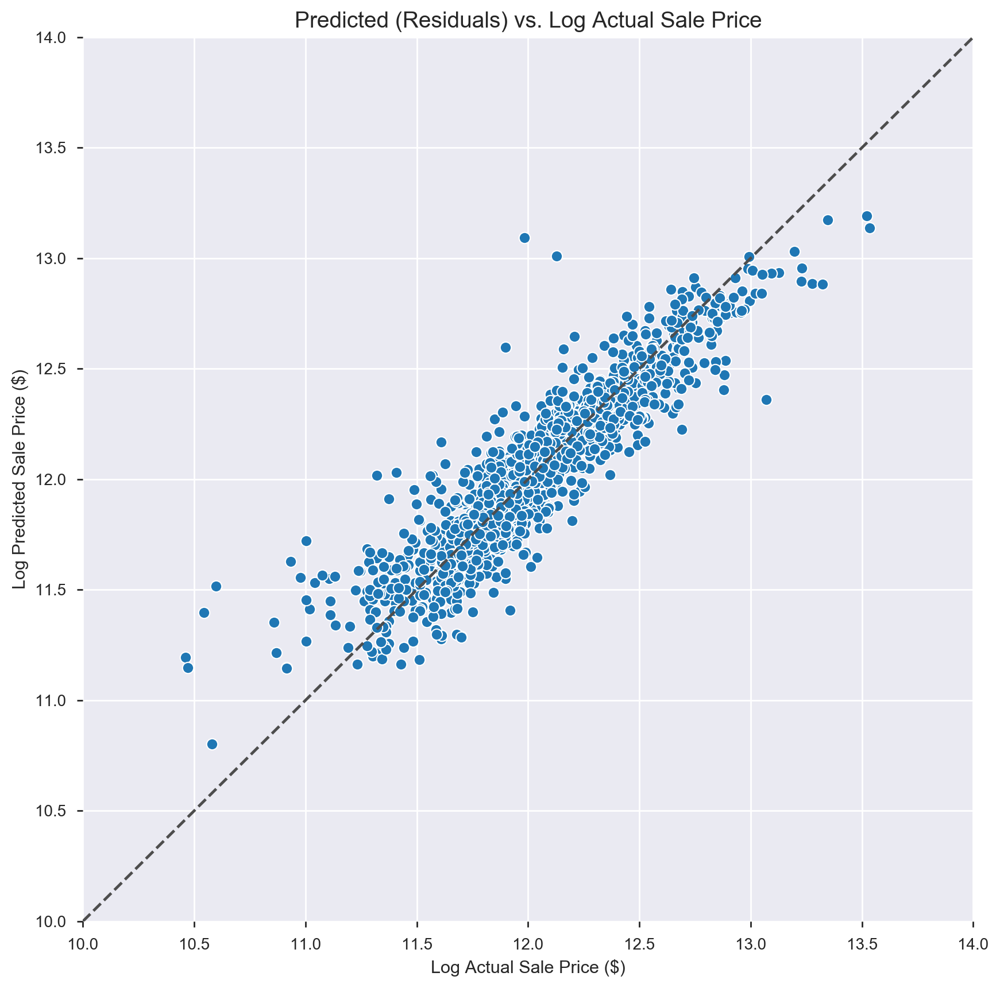

In [208]:
# Make cross validated predictions on data set
predictions = cross_val_predict(lr, Xs, y, cv=10)
ax = plt.subplots(figsize=(10, 10))

sns.scatterplot(y, predictions)

# plt.scatter(y, predictions)

ax = plt.gca()

#This sets the axis to the same 
plt.ylim(10, 14)
plt.xlim(10, 14)

ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c=".3")
plt.title('Predicted (Residuals) vs. Log Actual Sale Price', fontdict={'fontsize': 14})
plt.xlabel('Log Actual Sale Price ($)')
plt.ylabel('Log Predicted Sale Price ($)')


# manually calcualte the r2. In this case, we ha
r2 = metrics.r2_score(y, predictions)

print("Cross-Predicted R2:", r2)

In [209]:
#Retrain model only on pre 2010 data set
#Initially create a mask variable for use to flag 2010 houses
test_set=house_clean['YrSold']==2010

In [210]:
#Create testing and training set based.
#Aim to predict 2010 prices based on training of pre-2010 prices
ss = StandardScaler()
Xs_train = ss.fit_transform(X[~test_set])
y_train = house_clean[~test_set]['log_SalePrice']
Xs_test = ss.fit_transform(X[test_set])
y_test = house_clean[test_set]['log_SalePrice']

In [211]:
# Fitting a model on the test set using statsmodel
X_ols=sm.add_constant(pd.DataFrame(Xs_train, columns=X.columns, index = X[~test_set].index))
fit1=sm.OLS(y_train,X_ols).fit()
fit1.summary()

C:\Users\matth\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2495: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          log_SalePrice   R-squared:                       0.846
Model:                            OLS   Adj. R-squared:                  0.841
Method:                 Least Squares   F-statistic:                     170.5
Date:                Wed, 05 Feb 2020   Prob (F-statistic):               0.00
Time:                        14:44:30   Log-Likelihood:                 560.36
No. Observations:                1285   AIC:                            -1039.
Df Residuals:                    1244   BIC:                            -827.2
Df Model:                          40                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                         12.0272      0.004   2711.414      0.000      12.018      12.036
log_LotArea                    0.0478      0.007      7.298      0.000       0.035       0.061
log_GrLivArea                  0.1525      0.008     18.511      0.000       0.136       0.169
total_half_baths               0.0142      0.005      2.600      0.009       0.003       0.025
total_full_baths               0.0472      0.006      7.561      0.000       0.035       0.059
BedroomAbvGr                  -0.0239      0.006     -3.916      0.000      -0.036      -0.012
GarageCars                     0.0565      0.008      7.271      0.000       0.041       0.072
Neighborhood_Blmngtn           0.0269      0.005      5.033      0.000       0.016       0.037
Neighborhood_Blueste           0.0013      0.005      0.289      0.773      -0.008       0.010
Neighborhood_BrDale            0.0061      0.005      1.168      0.243      -0.004       0.016
Neighborhood_BrkSide           0.0204      0.006      3.685      0.000       0.010       0.031
Neighborhood_ClearCr           0.0213      0.005      3.968      0.000       0.011       0.032
Neighborhood_CollgCr           0.0638      0.008      7.721      0.000       0.048       0.080
Neighborhood_Crawfor           0.0482      0.006      8.719      0.000       0.037       0.059
Neighborhood_Edwards           0.0057      0.006      0.900      0.368      -0.007       0.018
Neighborhood_Gilbert           0.0284      0.007      3.962      0.000       0.014       0.042
Neighborhood_IDOTRR           -0.0125      0.005     -2.440      0.015      -0.023      -0.002
Neighborhood_MeadowV          -0.0011      0.005     -0.204      0.838      -0.011       0.009
Neighborhood_Mitchel           0.0163      0.006      2.786      0.005       0.005       0.028
Neighborhood_NAmes             0.0420      0.008      5.295      0.000       0.026       0.058
Neighborhood_NPkVill           0.0076      0.005      1.570      0.117      -0.002       0.017
Neighborhood_NWAmes            0.0228      0.006      3.517      0.000       0.010       0.035
Neighborhood_NoRidge           0.0568      0.006      9.498      0.000       0.045       0.069
Neighborhood_NridgHt           0.0814      0.007     11.090      0.000       0.067       0.096
Neighborhood_SWISU             0.0073      0.005      1.468      0.142      -0.002       0.017
Neighborhood_Sawyer            0.0198      0.006      3.322      0.001       0.008       0.032
Neighborhood_SawyerW           0.0279      0.006      4.683      0.000       0.016       0.040
Neighborhood_Somerst           0.0677      0.007      9.663      0.000       0.054       0.081
Neighborhood_StoneBr           0.0502      0.005      9.350      0.000       0.040       0.061
Neighborhood_Timber            0.0332      

In [212]:
#This identifies all variables that are individually significant.
p=fit1.pvalues<0.05
#Appends all variables that are significant at the 0.05 level to a list
p[p].index.tolist()

['const',
 'log_LotArea',
 'log_GrLivArea',
 'total_half_baths',
 'total_full_baths',
 'BedroomAbvGr',
 'GarageCars',
 'Neighborhood_Blmngtn',
 'Neighborhood_BrkSide',
 'Neighborhood_ClearCr',
 'Neighborhood_CollgCr',
 'Neighborhood_Crawfor',
 'Neighborhood_Gilbert',
 'Neighborhood_IDOTRR',
 'Neighborhood_Mitchel',
 'Neighborhood_NAmes',
 'Neighborhood_NWAmes',
 'Neighborhood_NoRidge',
 'Neighborhood_NridgHt',
 'Neighborhood_Sawyer',
 'Neighborhood_SawyerW',
 'Neighborhood_Somerst',
 'Neighborhood_StoneBr',
 'Neighborhood_Timber',
 'Neighborhood_Veenker',
 'Basement_recoded_Ex',
 'Basement_recoded_Fa',
 'Basement_recoded_Gd',
 'Basement_recoded_TA',
 'GarageType_recoded_2Types',
 'GarageType_recoded_Attchd',
 'GarageType_recoded_Basment',
 'GarageType_recoded_BuiltIn',
 'GarageType_recoded_CarPort']

In [213]:
#Importing f_regression to to obtain p values associated with coefficients
from sklearn.feature_selection import f_regression

In [214]:
#Checking that this will provide associated p values with each feature's coefficient and then round to 4 decimals for ease of interpretation
np.round_(f_regression(Xs_train,y_train)[1],decimals=4)

array([0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.1501, 0.4763,
       0.    , 0.    , 0.0189, 0.    , 0.0059, 0.    , 0.0036, 0.    ,
       0.    , 0.0848, 0.    , 0.3232, 0.0309, 0.    , 0.    , 0.0238,
       0.    , 0.2503, 0.    , 0.    , 0.    , 0.008 , 0.    , 0.    ,
       0.    , 0.    , 0.4305, 0.    , 0.9706, 0.    , 0.0016, 0.    ])

In [215]:
lr.fit(Xs_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [216]:
#Create a new dataframe containing all the lr coefficients needed
lr_coefficient_dataframe = pd.DataFrame({'Feature':X.columns,
                                      'Coefficient':lr.coef_,                                   
                                      'Coefficient Absolute': abs(lr.coef_),
                                      'Probability': np.round_(f_regression(Xs_train,y_train)[1],decimals=4),})
# #Output coefficients to a file for review
lr_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False).to_csv(r'lasso_regression_model_coefficients.csv')
# #Reorders the coefficients dataframe. These coefficients can be used in prediction coefficients but does not 
# #tell us the respective importance of each feature as the values are standardised
# lr_coefficient_dataframe['colour']=lr_coefficient_dataframe['Coefficient'].apply(lambda x : 'blue' if x>=0 else 'red')
#lr_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)

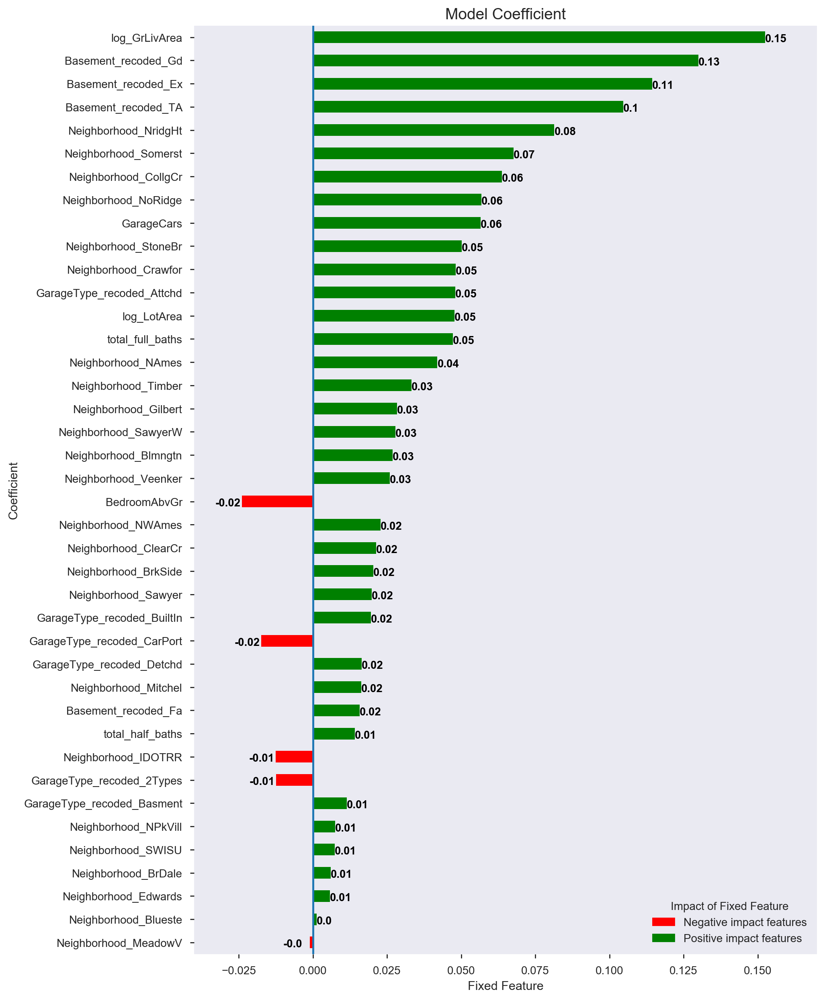

In [217]:
####FLAG HERE
import matplotlib.patches as mpatches

lr_coefficient_dataframe['colour']=lr_coefficient_dataframe['Coefficient'].apply(lambda x : 'green' if x>0 else 'red')


lr_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)
lr_coefficient_dataframe = lr_coefficient_dataframe.sort_values('Coefficient Absolute',ascending=True)
lr_coefficient_dataframe.plot(x='Feature',
                                        y='Coefficient',
                                        kind='barh',
                                        color=lr_coefficient_dataframe['colour'],
                                        figsize=(10,15)
                                       )
ax = plt.gca()

#This sets the axis to the same 
plt.xlim(-0.04, 0.17)
plt.axvline(x=0)
plt.grid(b=False)

# Create a legend labels for colour coded bars
negative_features = mpatches.Patch(color='red', label='Negative impact features')
positive_features= mpatches.Patch(color='green', label='Positive impact features')

ax.legend(handles=[negative_features,positive_features],title='Impact of Fixed Feature',loc='lower right')

for i, v in enumerate(lr_coefficient_dataframe['Coefficient']):
    if v>=0:
        ax.text(v, i-0.2, str(np.round(v,decimals=2)), color='black', fontweight='bold')
    if v<0:
        ax.text(v-.009, i-0.2, str(np.round(v,decimals=2)), color='black', fontweight='bold')

plt.title('Model Coefficient', fontdict={'fontsize': 14})
plt.xlabel('Fixed Feature')
plt.ylabel('Coefficient')

fixed_feature  = plt.gca()

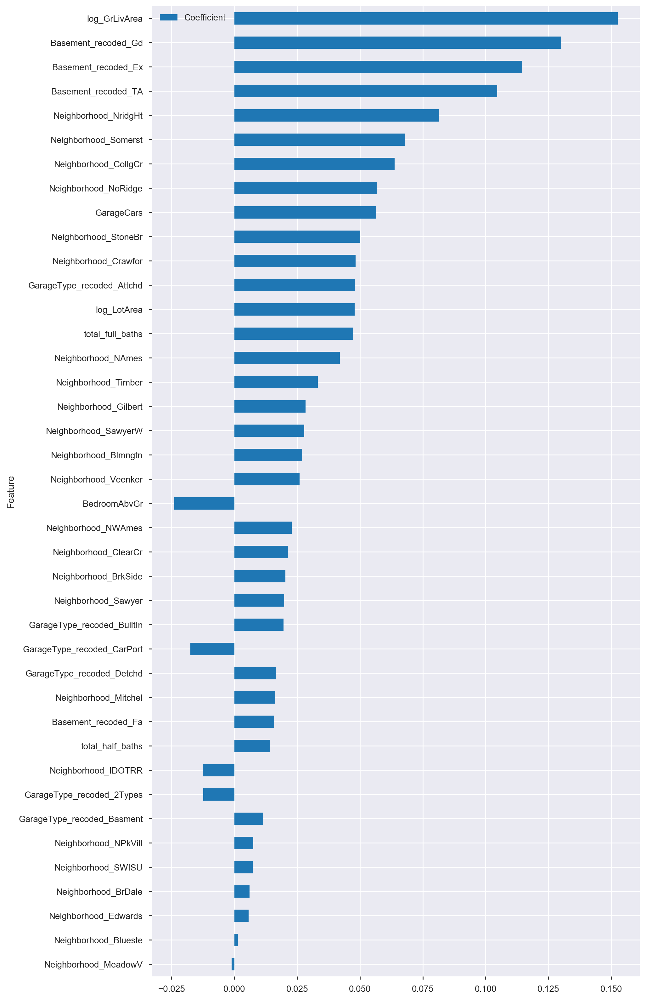

In [218]:
lr_coefficient_dataframe.sort_values('Coefficient Absolute',ascending=True).plot(x='Feature',
                                                                  y='Coefficient',
                                                                  kind='barh',
                                                                  figsize=(10,20),
                                                                  
                                                                 )

**Refitting linear model to pre 2010 and testing on 2010 data**

In [219]:
#Rechecking cross validation scores on standard of 5 CV's
#Similar score being obtained to above
cross_val_score(lr,Xs_train,y_train)

array([0.84194301, 0.83614548, 0.83402275, 0.81899971, 0.81097327])

In [220]:
#Testing out whether model works on 2010 data 
cross_val_score(lr,Xs_test,y_test)

array([0.81935098, 0.81431838, 0.82321165, 0.80928555, 0.74432221])

In [221]:
#Refitting linear regression model 
lr_model = lr.fit(Xs_train, y_train)
#Creating predicting on Xs_test data set
lr_predictions  =  lr_model.predict(Xs_test)
#Assessing how well model fitted above is for predicting test set.
lr_score        =  lr_model.score(Xs_test, y_test)
print("The pre-2010 fixed features training (LINEAR REGRESSION) model predicts", lr_score, "% of variance in 2010 prices" )

The pre-2010 fixed features training (LINEAR REGRESSION) model predicts 0.8504843999673903 % of variance in 2010 prices


**Lasso Model - ALL DATA**

In [222]:
#Now investigate whether other models improve predictions. We will start with a lasso model
# Intalises a LassoCV (lasso regression cross validation with 10 folds) gradient descent object
optimal_lasso = LassoCV(n_alphas=500, cv=10)
# fits the lasso regression with coordinate descent on the X daata with target y
optimal_lasso.fit(Xs_train, y_train)
# Prints the optimal alpha (lambda value for use in the final model)
print(optimal_lasso.alpha_)

0.0002916830637536075


In [223]:
# A:
# Initalises a sklearn lasso coordinate descent object with the optimal lasso lamdba (alpha)
# calculated from the fit above
lasso = Lasso(alpha=optimal_lasso.alpha_)

lasso_scores = cross_val_score(lasso, Xs_train, y_train, cv=10)

print(lasso_scores)
print('The min is', min(lasso_scores),'\nThe max is',max(lasso_scores))
print('The range is',max(lasso_scores)-min(lasso_scores))
print('The average is',np.mean(lasso_scores))
print('The Std of R2 is',np.std(lasso_scores))

[0.8183151  0.85876176 0.86954042 0.81820353 0.82531163 0.84296145
 0.82104195 0.81986303 0.79694662 0.82557049]
The min is 0.7969466248872337 
The max is 0.8695404242272224
The range is 0.07259379933998877
The average is 0.8296516005321692
The Std of R2 is 0.02037227242414007


**Lasso Model - PRE 2010 MODELLING**

In [224]:
#Refitting lasso model on the pre 2010 data only
lasso_model = lasso.fit(Xs_train, y_train)
#Creating predicting on Xs_test data set
lasso_predictions  =  lasso_model.predict(Xs_test)
#Assessing how well lasso model fitted above is for predicting test set
lasso_score        =  lasso_model.score(Xs_test, y_test)
print("The pre-2010 fixed features training (LASSO REGRESSION) model predicts", lasso_score, "% of variance in 2010 prices" )

The pre-2010 fixed features training (LASSO REGRESSION) model predicts 0.8508490789714522 % of variance in 2010 prices


In [225]:
#Create a new dataframe containing all the coefficients needed
lasso_coefficient_dataframe = pd.DataFrame({'Feature':X.columns,
                                      'Coefficient':lasso_model.coef_,
                                      'Coefficient Absolute': abs(lasso_model.coef_)})
#Output coefficients to a file for review
lasso_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False).to_csv(r'lasso_regression_model_coefficients.csv')
#Reorders the coefficients dataframe. These coefficients can be used in prediction coefficients but does not 
#tell us the respective importance of each feature as the values are not standardised
lasso_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)

,Feature,Coefficient,Coefficient Absolute
1,log_GrLivArea,0.150075,0.150075
32,Basement_recoded_Gd,0.121846,0.121846
30,Basement_recoded_Ex,0.109664,0.109664
33,Basement_recoded_TA,0.094593,0.094593
22,Neighborhood_NridgHt,0.075670,0.075670
26,Neighborhood_Somerst,0.061858,0.061858
5,GarageCars,0.058696,0.058696
11,Neighborhood_CollgCr,0.056214,0.056214
21,Neighborhood_NoRidge,0.052525,0.052525
3,total_full_baths,0.048156,0.048156


In [226]:
#Checks how many variables in the lasso model have been zeroed out 
print(round((len(lasso_coefficient_dataframe[lasso_coefficient_dataframe['Coefficient']==0])/len(lasso_coefficient_dataframe['Coefficient'])*100),ndigits=2),'% of variables are zeroed in the lasso model')
#In this case, no variables have been zeroed out. 

0.0 % of variables are zeroed in the lasso model


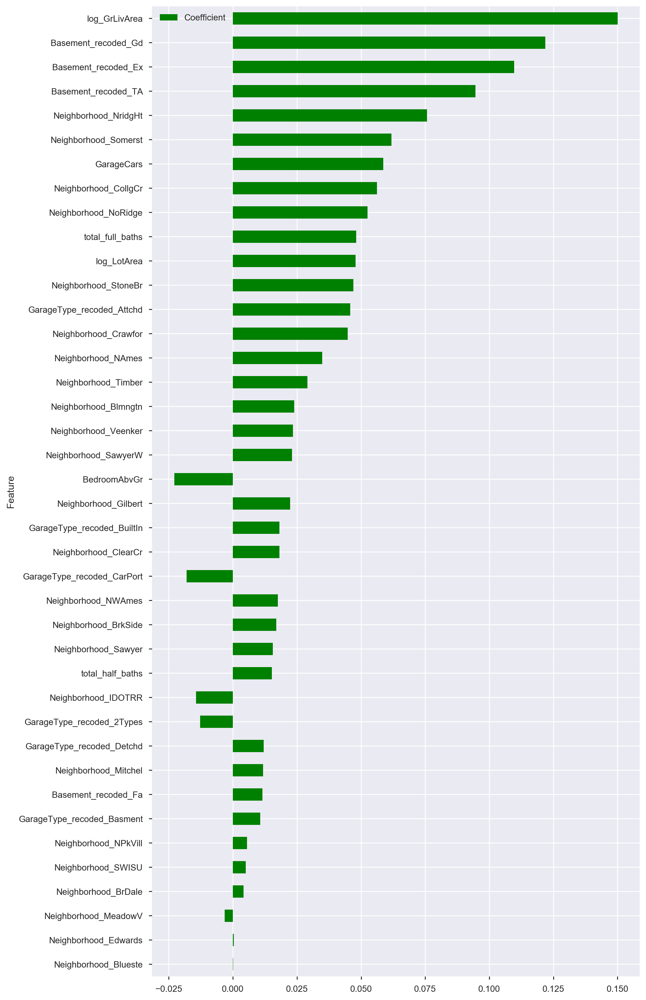

In [227]:
lasso_coefficient_dataframe.sort_values('Coefficient Absolute').plot(x='Feature',
                                                                     y='Coefficient',
                                                                     kind='barh',
                                                                     figsize=(10,20),
                                                                    color='green')

**Ridge Model - ALL DATA**

In [228]:
#This calculates 200 ridge lambda values to optimise constraint value 
ridge_alphas = np.logspace(0, 10, 200)

optimal_ridge = RidgeCV(alphas=ridge_alphas, cv=10)
optimal_ridge.fit(Xs_test, y_test)

print(optimal_ridge.alpha_)

40.5546073584083


In [229]:
# This calculates a ridge regression using the optimised lamdba value calculated above
# And outputs the cross-validated scores.
ridge = Ridge(alpha=optimal_ridge.alpha_)

ridge_scores = cross_val_score(ridge, Xs_test, y_test, cv=10)

print(ridge_scores)
print('The min is', min(ridge_scores),'\nThe max is',max(ridge_scores))
print('The range is',max(ridge_scores)-min(ridge_scores))
print('The average is',np.mean(ridge_scores))
print('The Std of R2 is',np.std(ridge_scores))

[0.87586341 0.77391317 0.85522445 0.88475986 0.68607774 0.84101202
 0.77753395 0.87221863 0.7294869  0.69161906]
The min is 0.6860777404393334 
The max is 0.8847598596338138
The range is 0.1986821191944803
The average is 0.798770917745862
The Std of R2 is 0.07331690891761486


**Ridge Model - PRE 2010 MODELLING**

In [230]:
#Refitting ridge model on the pre 2010 data only
ridge_model = Ridge(alpha=optimal_ridge.alpha_)
ridge_2010 = ridge_model.fit(Xs_train,y_train)
#Creating predicting on Xs_test data set
ridge_predictions  =  ridge_2010.predict(Xs_test)
#Assessing how well ridge model fitted above is for predicting test set
ridge_2010_score        =  ridge_2010.score(Xs_test, y_test)
print("The pre-2010 fixed features training (RIDGE REGRESSION) model predicts", ridge_2010_score, "% of variance in 2010 prices" )

The pre-2010 fixed features training (RIDGE REGRESSION) model predicts 0.8477346270017565 % of variance in 2010 prices


In [231]:
#Create a new dataframe containing all the coefficients needed
ridge_coefficient_dataframe = pd.DataFrame({'Feature':X.columns,
                                      'Coefficient':ridge_2010.coef_,
                                      'Coefficient Absolute': abs(ridge_2010.coef_)})
#Output coefficients to a file for review
ridge_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False).to_csv(r'ridge_regression_model_coefficients.csv')
#Reorders the coefficients dataframe. These coefficients can be used in prediction coefficients but does not 
#tell us the respective importance of each feature as the values are not standardised
ridge_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)

,Feature,Coefficient,Coefficient Absolute
1,log_GrLivArea,0.137412,0.137412
30,Basement_recoded_Ex,0.082435,0.082435
32,Basement_recoded_Gd,0.074930,0.074930
22,Neighborhood_NridgHt,0.065983,0.065983
5,GarageCars,0.062803,0.062803
3,total_full_baths,0.053071,0.053071
26,Neighborhood_Somerst,0.051976,0.051976
0,log_LotArea,0.048405,0.048405
35,GarageType_recoded_Attchd,0.046037,0.046037
33,Basement_recoded_TA,0.045969,0.045969


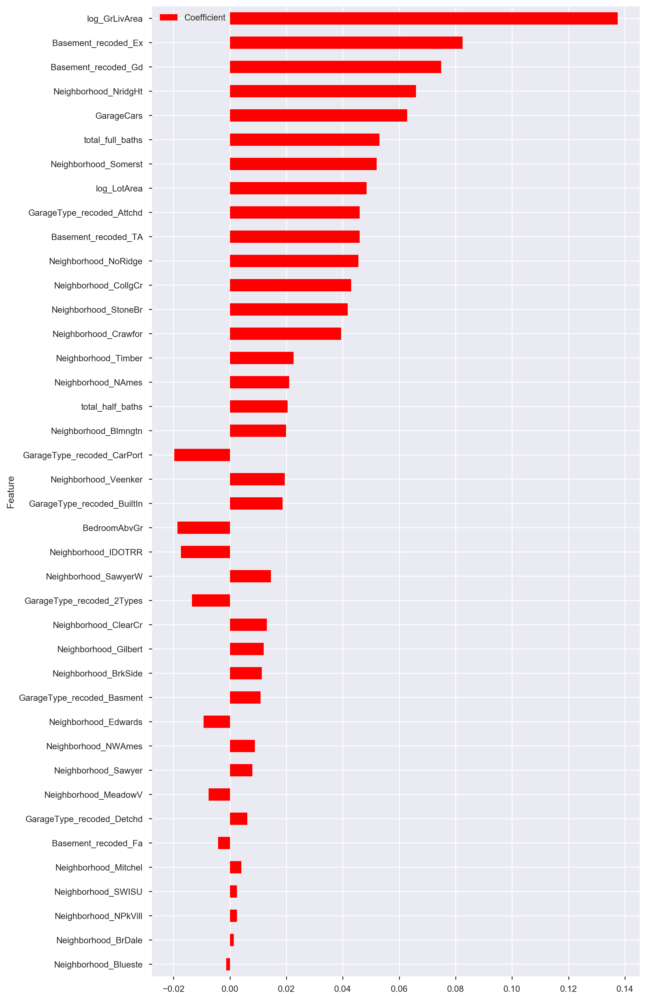

In [232]:
ridge_coefficient_dataframe.sort_values('Coefficient Absolute').plot(x='Feature',y='Coefficient',kind='barh',figsize=(10,20), color='red')

In [233]:
print("MODEL SUMMARY")
print("-------------")
print("Linear Regression 2010 R2=",np.round_(lr_score,decimals=4)) #- 2010 prediction linear regression
print("Linear Regression CV R2 Scores Mean=",np.round_(lr_values.mean(),decimals=4)) #- all data mean cross validated scores
print("Linear Regression CV R2 Scores STD=",np.round_(np.std(lr_values),decimals=4)) #- std of mean cross validated scores


print("\nLasso Regression 2010 R2=",np.round_(lasso_score,decimals=4)) #- 2010 prediction lasso regression
print("Lasso Regression CV R2 Scores Mean=",np.round_(np.mean(lasso_scores),decimals=4))
print("Lasso Regression CV R2 Scores STD=",np.round_(np.std(lasso_scores),decimals=4))

print("\nRidge Regression 2010 R2=",np.round_(ridge_2010_score,decimals=4))
print("Ridge Regression CV R2 Scores Mean=",np.round_(np.mean(ridge_scores),decimals=4))
print("Rideg Regression CV R2 Scores STD=",np.round_(np.std(ridge_scores),decimals=4))

MODEL SUMMARY
-------------
Linear Regression 2010 R2= 0.8505
Linear Regression CV R2 Scores Mean= 0.8335
Linear Regression CV R2 Scores STD= 0.0212

Lasso Regression 2010 R2= 0.8508
Lasso Regression CV R2 Scores Mean= 0.8297
Lasso Regression CV R2 Scores STD= 0.0204

Ridge Regression 2010 R2= 0.8477
Ridge Regression CV R2 Scores Mean= 0.7988
Rideg Regression CV R2 Scores STD= 0.0733


## **Intepreting the results**

A total of 3 models were run:
* **Multiple Linear Regression**
* **Lasso Regression**
* **Ridge Regression**

### Model Performance Summary
The table below summarises the outcomes of the three models tested.


| --- | **Multiple Linear Regression** | **Lasso Regression** | **Ridge Regression** |
| --- | --- | --- | --- |
| Cross-Validated Model (CV=10) Mean R2 *(Std)* | 83.35% *(2.12%)* | 82.97% *(2.04%)* | 79.89% *(7.33%)* |
| Pre-2010 Model R2 | 85.05% | 85.08% | 84.48% |

All models on average were similar. However, the ridge regression was poorer in predicting 2010 sale prices. In addition the cross-validated results showed higher variation compared to the Multiple Linear Regression and Lassio Regression models. 

While the Lasso model showed slightly higher R2 values for predicting 2010 prices compared to the linear regression model, the linear regression model shows higher mean cross validated results. 

Consequently, I have chosen the linear regression model, which is also simpler for analysis purposes.

<img src="http://imgur.com/l5NasQj.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 2. Determine any value of *changeable* property characteristics unexplained by the *fixed* ones.

---

Now that you have a model that estimates the price of a house based on its static characteristics, we can move forward with part 2 and 3 of the plan: what are the costs/benefits of quality, condition, and renovations?

There are two specific requirements for these estimates:
1. The estimates of effects must be in terms of dollars added or subtracted from the house value. 
2. The effects must be on the variance in price remaining from the first model.

The residuals from the first model (training and testing) represent the variance in price unexplained by the fixed characteristics. Of that variance in price remaining, how much of it can be explained by the easy-to-change aspects of the property?

---

**Your goals:**
1. Evaluate the effect in dollars of the renovate-able features. 
- How would your company use this second model and its coefficients to determine whether they should buy a property or not? Explain how the company can use the two models you have built to determine if they can make money. 
- Investigate how much of the variance in price remaining is explained by these features.
- Do you trust your model? Should it be used to evaluate which properties to buy and fix up?

In [234]:
#setting up a new target which will be the residuals of the linear regression model
y_hat = pd.DataFrame(lr_model.predict(Xs))
y_hat.rename(columns={0: "predicted_y"},inplace=True)
house_clean['y_hat'] = y_hat

In [235]:
house_clean['residuals'] = house_clean['y_hat'] - house_clean['log_SalePrice']

Text(0.5, 1.0, 'Distribution of Log Residuals')

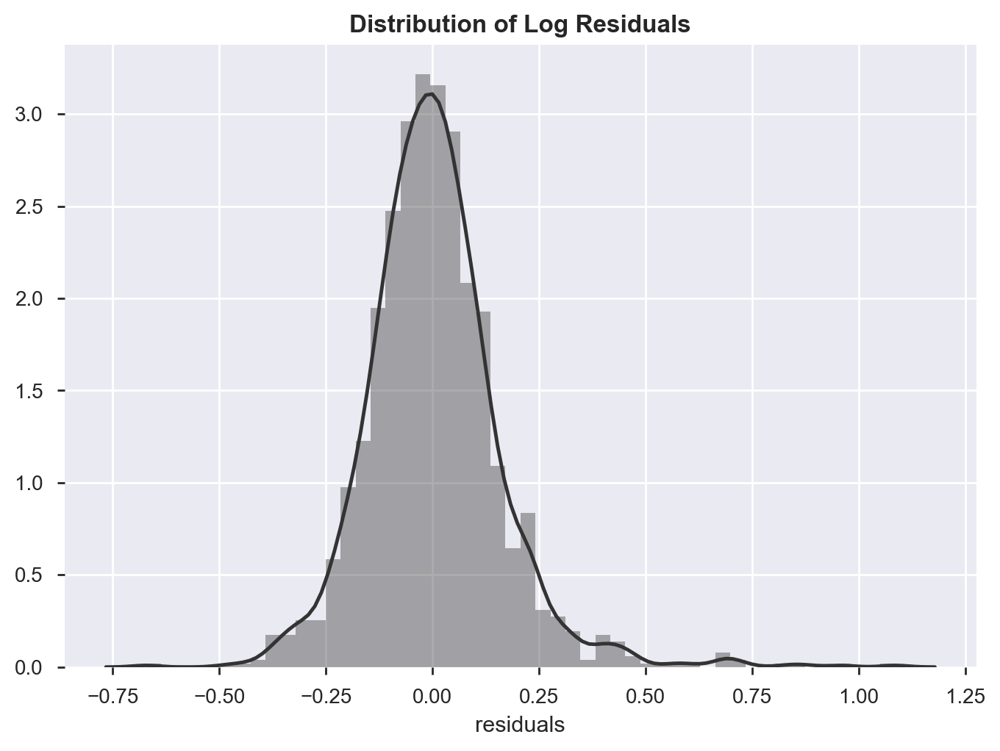

In [236]:
#Distribution of residuals
sns.distplot(house_clean['residuals'],color=(0.2,0.2,0.2))
plt.title('Distribution of Log Residuals', fontweight='bold')
#The new target is generally normally distributed

In [237]:
#Creating an alternative residual in the original dollar scale rather than log price
#This is achieved by taking the inverse log of both the log_saleprice and log of y_hat (which is a log_predicted value)
house_clean['SalePrice_residual_original'] = np.exp(house_clean['log_SalePrice'])-np.exp(house_clean['y_hat'])
# house_clean['SalePrice_residual_original'] 

Text(0.5, 1.0, 'Distribution of Residuals (in original $ Scale)')

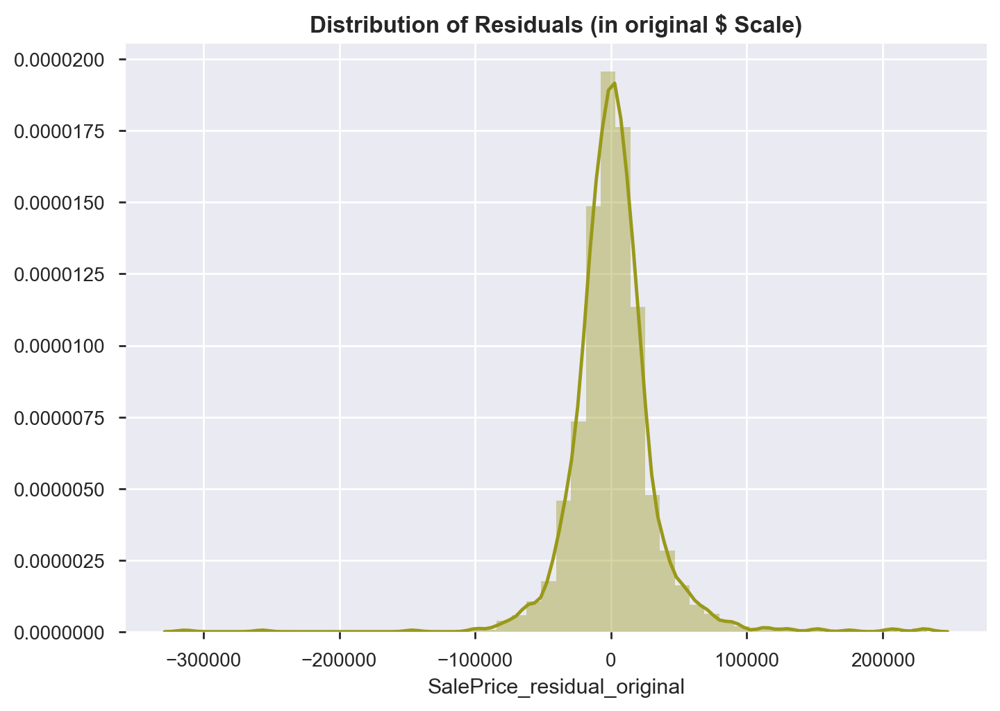

In [238]:
#Distribution of residuals in original $ value scale
sns.distplot(house_clean['SalePrice_residual_original'],color=(0.6,0.6,0.1))
plt.title('Distribution of Residuals (in original $ Scale)', fontweight='bold')
#Again the this is also relatively normally distributed
#Also as this is in the original $ scale and the question is around evaluating "the effect in 
#dollars of the renovate-able features" it makes more sense to make the target the residuals in the original dollar value
#Therefore the target will be SalePrice_residual_original in the data set
#However, there are clearly extreme outliers in this data set that need to be investigated that may 
#impact on the 


In [239]:
house_clean.SalePrice_residual_original.describe()

count      1460.000000
mean       1746.427337
std       31230.505438
min     -313385.922043
25%      -12828.349344
50%        1053.484513
75%       14675.734033
max      232601.376292
Name: SalePrice_residual_original, dtype: float64

In [240]:
#Investigating extreme upper and lower ranges for SalePrice_residual_original in terms of outlier ranges against IQR*3 criteria
upper_sale_residual = ((np.quantile([house_clean['SalePrice_residual_original']],0.75) - np.quantile([house_clean['SalePrice_residual_original']],0.25))*3) + np.quantile([house_clean['SalePrice_residual_original']],0.75)
lower_sale_residual = (np.quantile([house_clean['SalePrice_residual_original']],0.25)-(np.quantile([house_clean['SalePrice_residual_original']],0.75) - np.quantile([house_clean['SalePrice_residual_original']],0.25))*3)

print("Upper:",upper_sale_residual)
print("Lower:",lower_sale_residual)

Upper: 97187.98416330168
Lower: -95340.5994744239


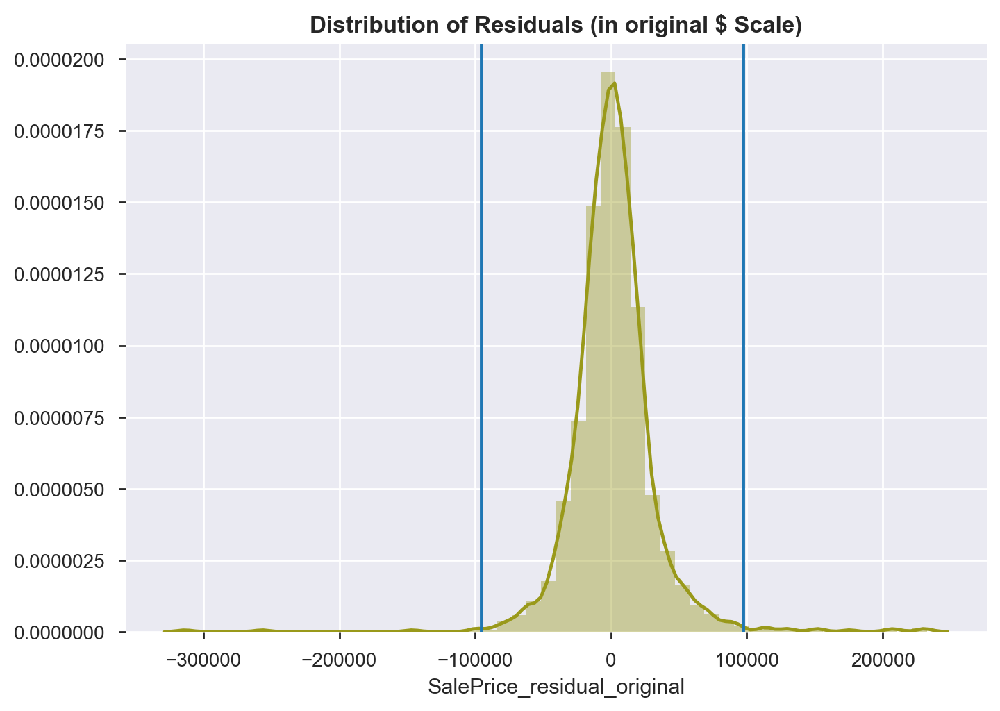

In [241]:
#Distribution of residuals in original $ value scale
sns.distplot(house_clean['SalePrice_residual_original'],color=(0.6,0.6,0.1))
plt.title('Distribution of Residuals (in original $ Scale)', fontweight='bold')
plt.axvline(x=upper_sale_residual)
plt.axvline(x=lower_sale_residual)

In [242]:
# Get names of indexes for residuals more than upper_sale_residual
indexNames_upper = house_clean[house_clean['SalePrice_residual_original'] >upper_sale_residual].index
# Delete these row indexes from dataFrame
house_clean.drop(indexNames_upper, inplace=True)


In [243]:
# Get names of indexes for residuals more than lower_sale_residual
indexNames_lower = house_clean[house_clean['SalePrice_residual_original'] <lower_sale_residual].index
# Delete these row indexes from dataFrame
house_clean.drop(indexNames_lower, inplace=True)

Text(0.5, 1.0, 'Distribution of Residuals (in original $ Scale)')

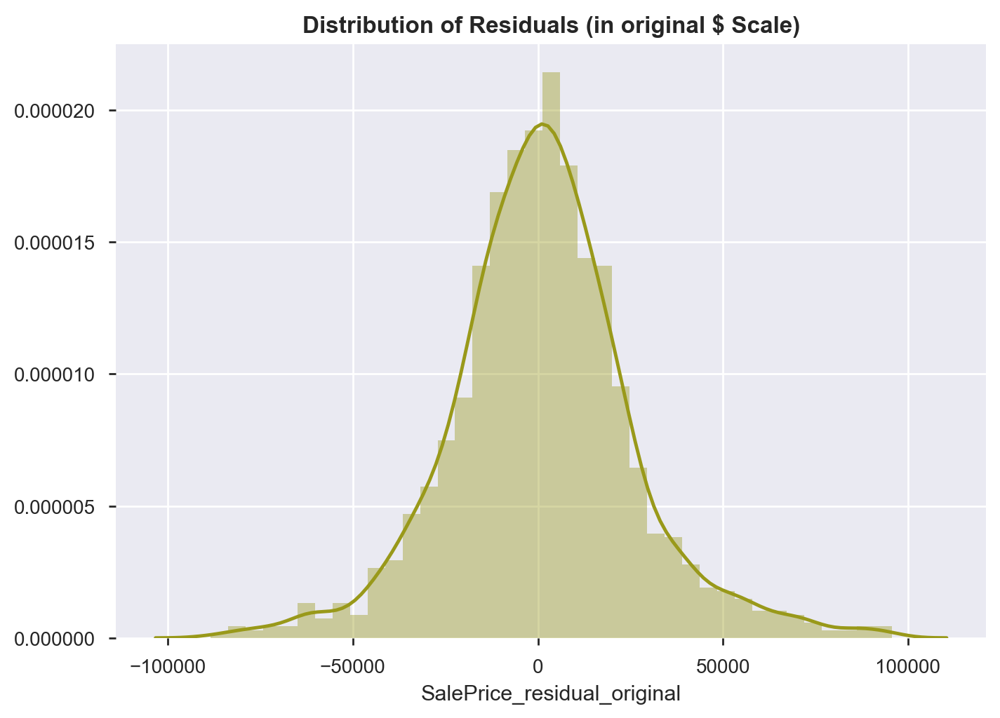

In [244]:
#Replot the Distribution of residuals in original $ value scale minus the extreme outliers
sns.distplot(house_clean['SalePrice_residual_original'],color=(0.6,0.6,0.1))
plt.title('Distribution of Residuals (in original $ Scale)', fontweight='bold')

In [245]:
#Checking null values
print(house_clean.Utilities.isnull().sum())
#Checking unique values
print(house_clean.Utilities.unique())
#Investigating size of Utilities groups
print(house_clean.groupby(by="Utilities").size())
#As only 1 NoSeWa condition, can be dropped for analysis purposes
house_clean.drop('Utilities',axis=1,inplace=True)

0
['AllPub' 'NoSeWa']
Utilities
AllPub    1442
NoSeWa       1
dtype: int64


In [246]:
#Checking if has any null values that may need recoding
house_clean.OverallQual.isnull().sum()

0

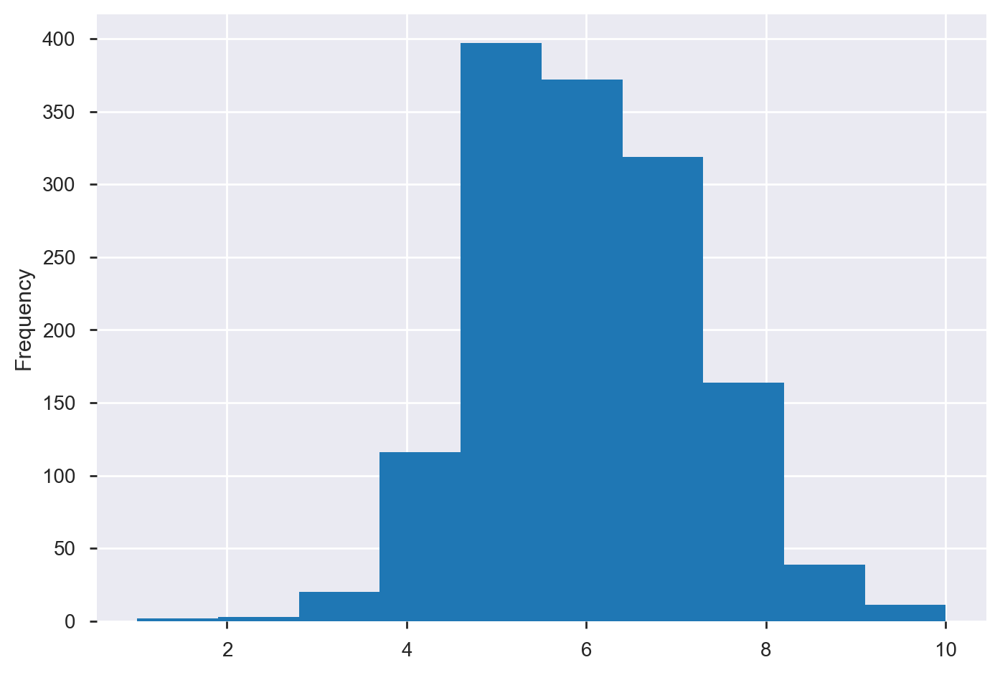

In [247]:
house_clean.OverallQual.plot(kind='hist', bins=10)

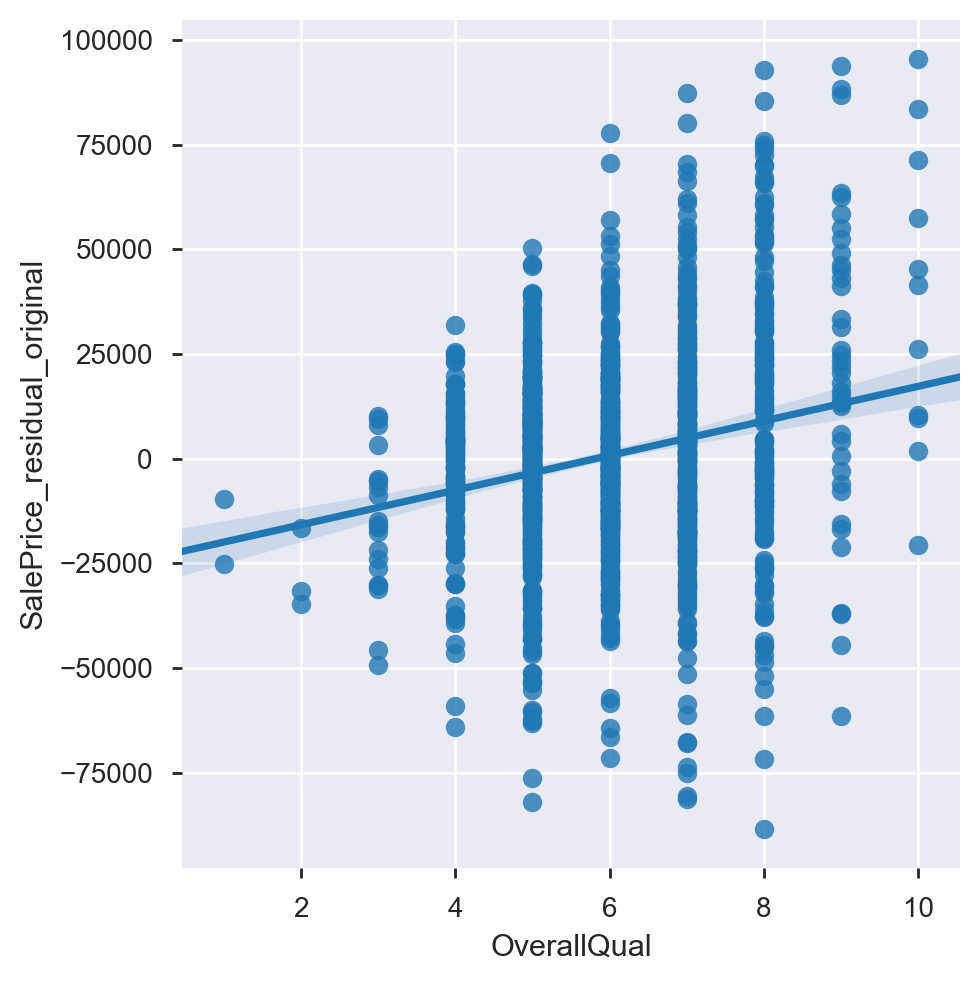

In [248]:
#Suggestive of a no-linear model for OverallQual
sns.lmplot(x='OverallQual',y='SalePrice_residual_original',data=house_clean)

0
AxesSubplot(0.125,0.11;0.775x0.77)


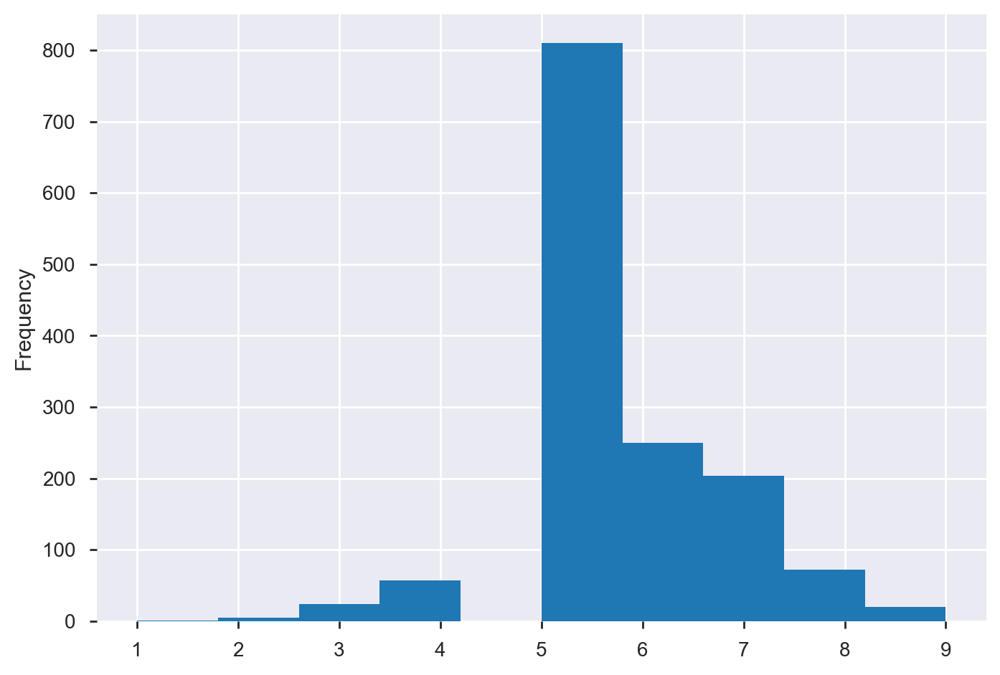

In [249]:
#Checking if has any null values that may need recoding
print(house_clean.OverallCond.isnull().sum())
print(house_clean.OverallCond.plot(kind='hist', bins=10))

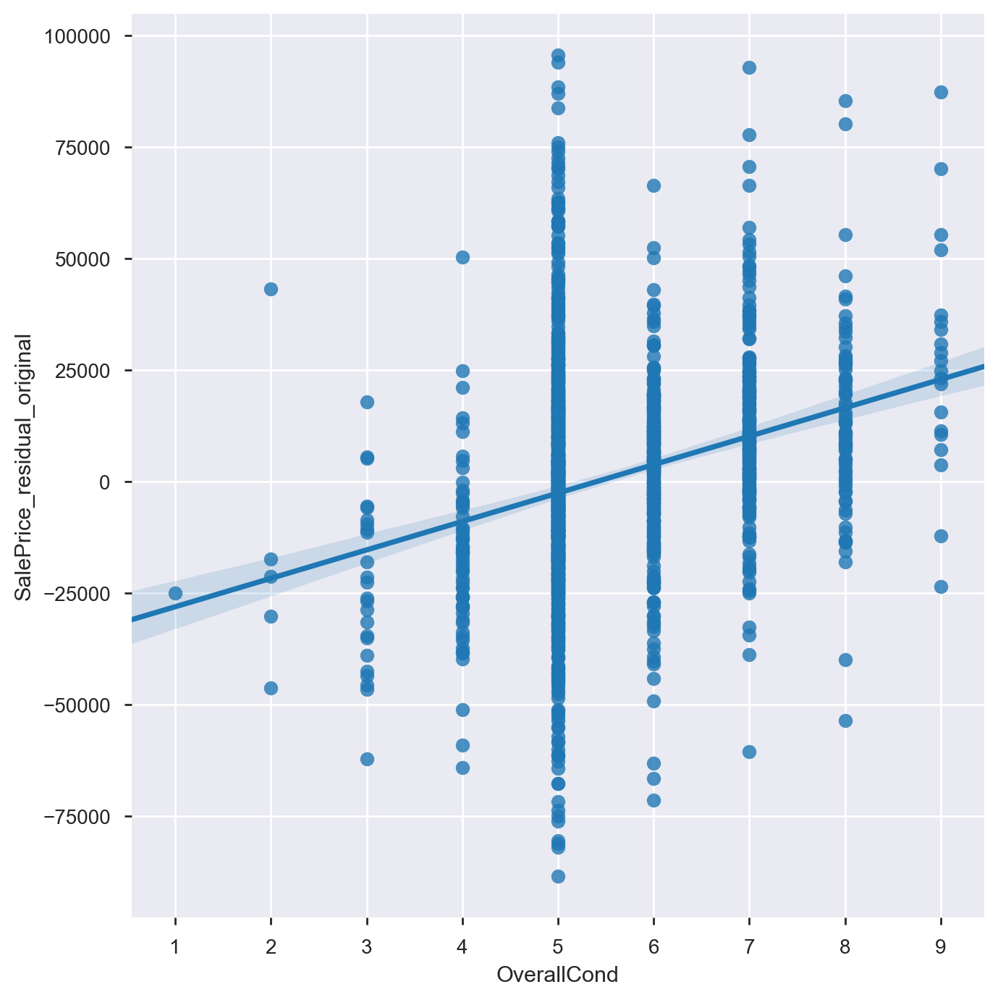

In [250]:
#Plotting scatterplot with regression line for OverallCond
sns.lmplot(x='OverallCond',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=7)

In [251]:
#Checking if has any null values that may need recoding
house_clean.YearRemodAdd.isnull().sum()

0

In [252]:
#Create a remodel flag by identifying differences between year built and YearRemodAdd
house_clean['remodel_diff'] = house_clean.YearRemodAdd - house_clean.YearBuilt

In [253]:
#Checking if any remodel_diff are less than 0 as may indicate a data error (i.e. cannot have remodel BEFORE built year)
(house_clean.remodel_diff <0).sum()
#As 0 looks ok.

0

In [254]:
#Create a remodel_flag identifying properties that have been remodelled and not
house_clean['remodel_flag'] = house_clean['remodel_diff'].apply(lambda x: 'Original' if x == 0 else 'Remodelled')
house_clean['remodel_flag'].isnull().sum()

0

In [255]:
#Investigating size of Remodel_flag groups
house_clean.groupby(by="remodel_flag").size()

remodel_flag
Original      758
Remodelled    685
dtype: int64

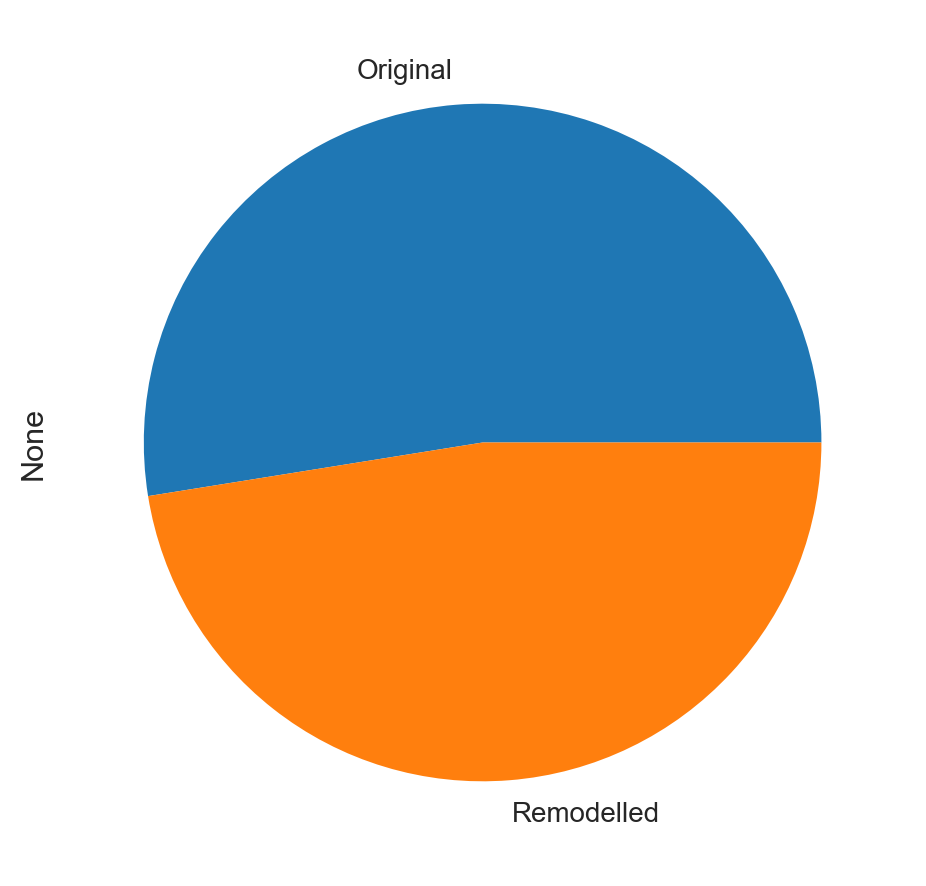

In [256]:
#plotting remodel vs no remodelled. About an equal split of houses have been remodelled
house_clean.groupby(by="remodel_flag").size().plot(kind='pie')

Text(0, 0.5, 'Remodelling')

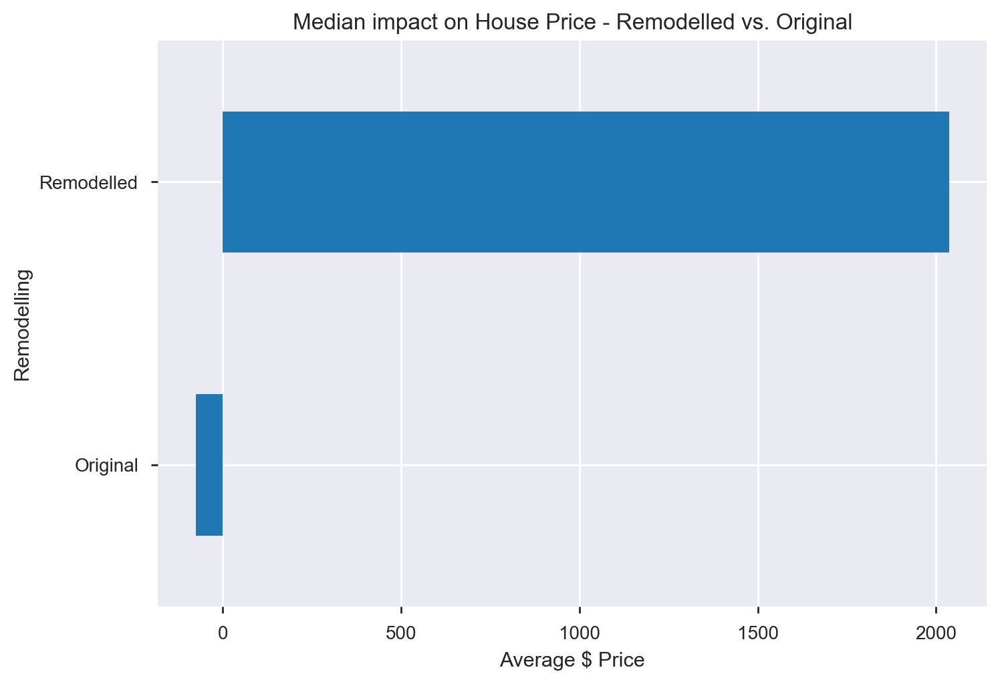

In [257]:
#Investigating prices by Remodelling
remodelled_sale = house_clean.groupby(by=['remodel_flag']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Remodelled vs. Original')
remodelled_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Remodelling')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [258]:
#Checking if has any null values that may need recoding
print(house_clean.RoofStyle.isnull().sum())
#Checking if unique values 
print(house_clean.RoofStyle.unique())

0
['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']


In [259]:
#Investigating size of RoofStyle groups
house_clean.groupby(by="RoofStyle").size()

RoofStyle
Flat         13
Gable      1134
Gambrel      11
Hip         276
Mansard       7
Shed          2
dtype: int64

In [260]:
house_clean["RoofStyle_recoded"] = house_clean["RoofStyle"].map({'Flat': 'Other', 
                                                       'Feedr': 'On or near Artery or Feeder Road',
                                                       'Gable': 'Gable',
                                                       'Gambrel': 'Other',
                                                       'Hip': 'Hip',
                                                       'Mansard': 'Other',
                                                       'Shed': 'Other'
                                                      }) 

Text(0, 0.5, 'RoofStyle')

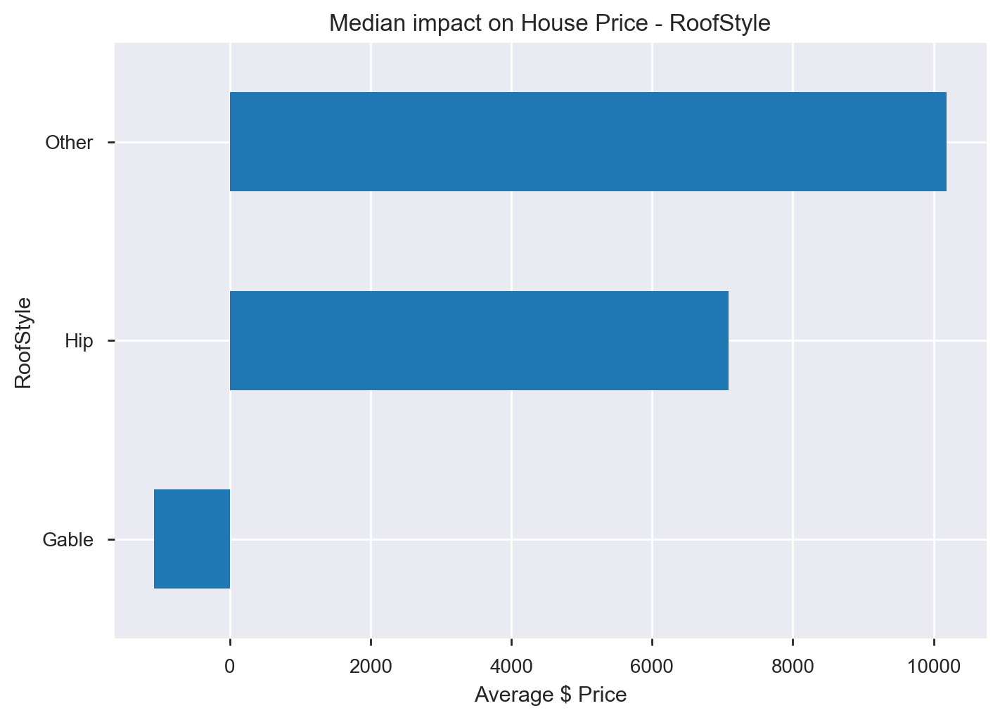

In [261]:
#Investigating prices by Remodelling
roofstyle_recoded_sale = house_clean.groupby(by=['RoofStyle_recoded']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - RoofStyle')
roofstyle_recoded_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('RoofStyle')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [262]:
#Checking if has any null values that may need recoding
print(house_clean.RoofMatl.isnull().sum())
#Checking if unique values 
print(house_clean.RoofMatl.unique())
#Investigating size of RoofMatl groups
house_clean.groupby(by="RoofMatl").size()
#As small class sizes, will not be used in mdoelling
#Dropping Street from data set
house_clean.drop(columns=['RoofMatl'], inplace=True)

0
['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll']


In [263]:
#Checking if has any null values that may need recoding
print(house_clean.Exterior1st.isnull().sum())
#Investigating size of Exterior1st groups
print(house_clean.groupby(by="Exterior1st").size())

0
Exterior1st
AsbShng     20
AsphShn      1
BrkComm      2
BrkFace     50
CBlock       1
CemntBd     58
HdBoard    221
ImStucc      1
MetalSd    218
Plywood    108
Stone        2
Stucco      24
VinylSd    509
Wd Sdng    202
WdShing     26
dtype: int64


In [264]:
#Create new grouping variables based based on converting single observations into an 'Other' grounp 
house_clean["Exterior1st_reduced"] = house_clean["Exterior1st"].map({'AsbShng': 'Other', 
                                                       'AsphShn': 'Other',
                                                       'BrkComm': 'Other',
                                                       'BrkFace': 'BrkFace',
                                                       'CBlock': 'Other',
                                                       'CemntBd': 'CemntBd',
                                                       'HdBoard': 'HdBoard',
                                                       'ImStucc': 'Other',
                                                       'MetalSd': 'MetalSd',
                                                       'Plywood': 'Plywood',
                                                       'Stone': 'Other',
                                                       'Stucco': 'Other',
                                                       'VinylSd': 'VinylSd',
                                                       'Wd Sdng': 'Wd Sdng',
                                                       'WdShing': 'Other',          
                                                      }) 

Text(0, 0.5, 'Exterior of House')

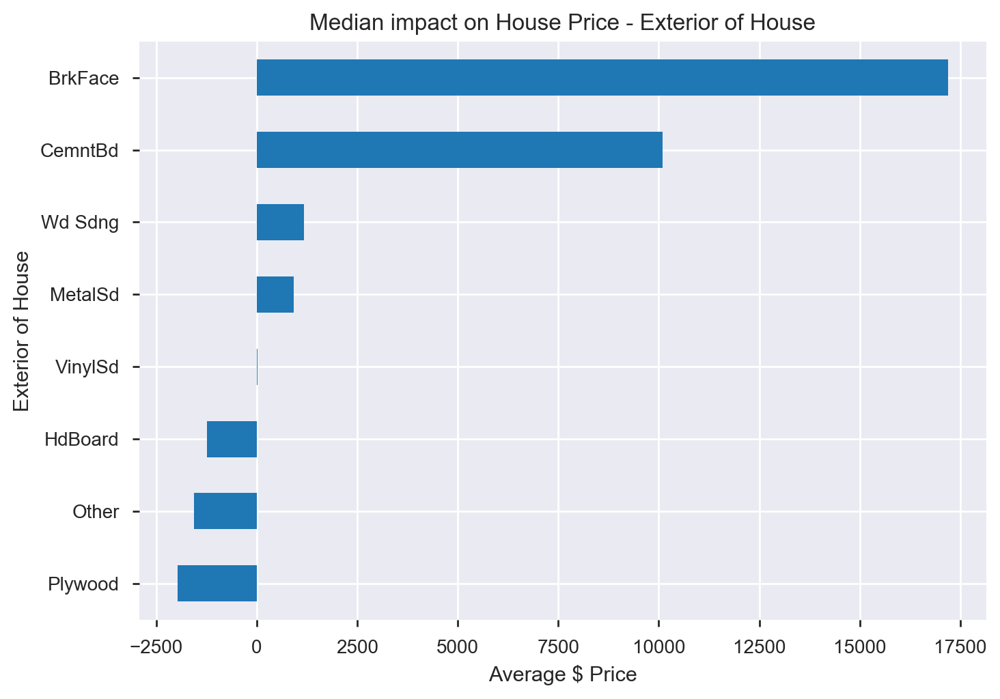

In [265]:
#Investigating prices by Remodelling
Exterior1st_reduced_sale = house_clean.groupby(by=['Exterior1st_reduced']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Exterior of House')
Exterior1st_reduced_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Exterior of House')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [266]:
#Checking if has any null values that may need recoding
house_clean.MasVnrType.isnull().sum()

7

In [267]:
#Investigating size of MasVnrType_reduced groups
house_clean.groupby(by="MasVnrType").size()

MasVnrType
BrkCmn      15
BrkFace    441
None       860
Stone      120
dtype: int64

In [268]:
#Imputing null values with none as assumed this is a data entry error
house_clean['MasVnrType_recoded'] = house_clean.MasVnrType.copy()
house_clean['MasVnrType_recoded'].fillna("None",inplace=True)
house_clean['MasVnrType_recoded'].isnull().sum()

0

In [269]:
#Investigating size of MasVnrType_reduced groups
house_clean.groupby(by="MasVnrType_recoded").size()

MasVnrType_recoded
BrkCmn      15
BrkFace    441
None       867
Stone      120
dtype: int64

Text(0, 0.5, 'Masonary Veneer Type')

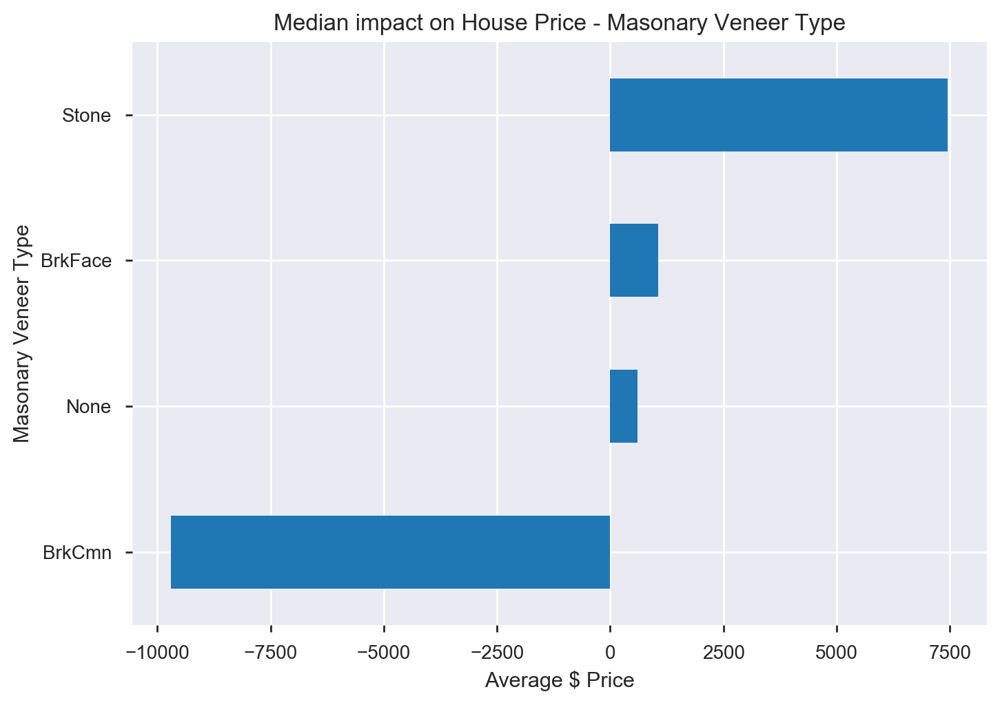

In [270]:
#Investigating prices by MasVnrType_recoded
MasVnrType_recoded_sale = house_clean.groupby(by=['MasVnrType_recoded']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Masonary Veneer Type')
MasVnrType_recoded_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Masonary Veneer Type')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [271]:
#Checking if has any null values that may need recoding
print(house_clean.ExterQual.isnull().sum())
#Investigating size of ExterQual groups
print(house_clean.groupby(by="ExterQual").size())

0
ExterQual
Ex     43
Fa     14
Gd    481
TA    905
dtype: int64


In [272]:
house_clean["ExterQual_recoded_ordinal"] = house_clean["ExterQual"].map({'Ex': 5, 
                                                       'Gd': 4,
                                                       'TA': 3,
                                                       'Fa': 2,
                                                       'Po': 1
                                                      }) 

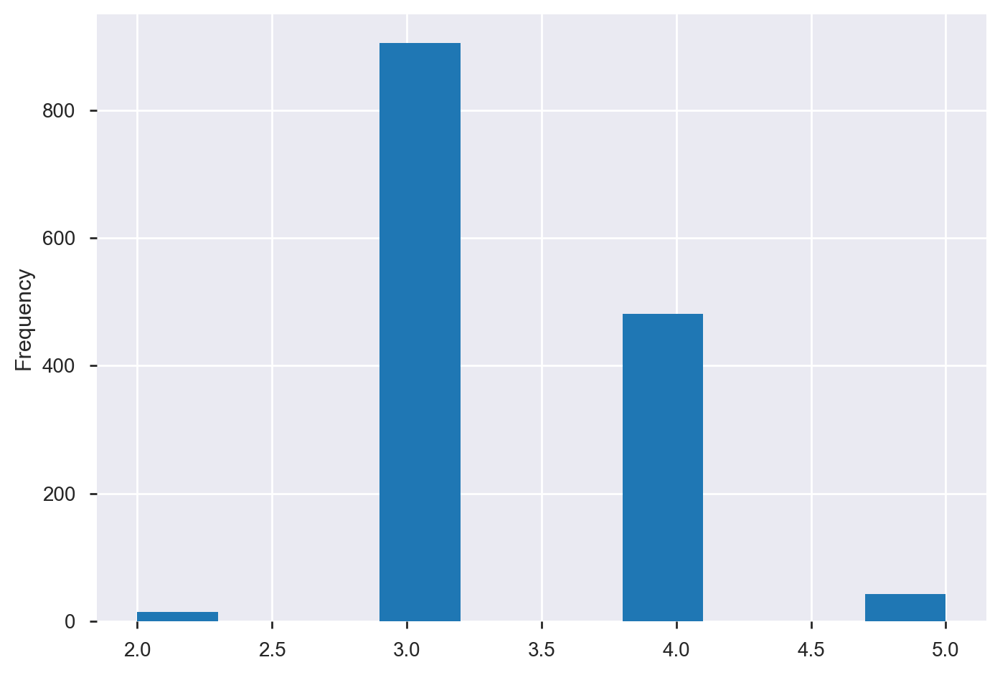

In [273]:
house_clean.ExterQual_recoded_ordinal.plot(kind='hist', bins=10)

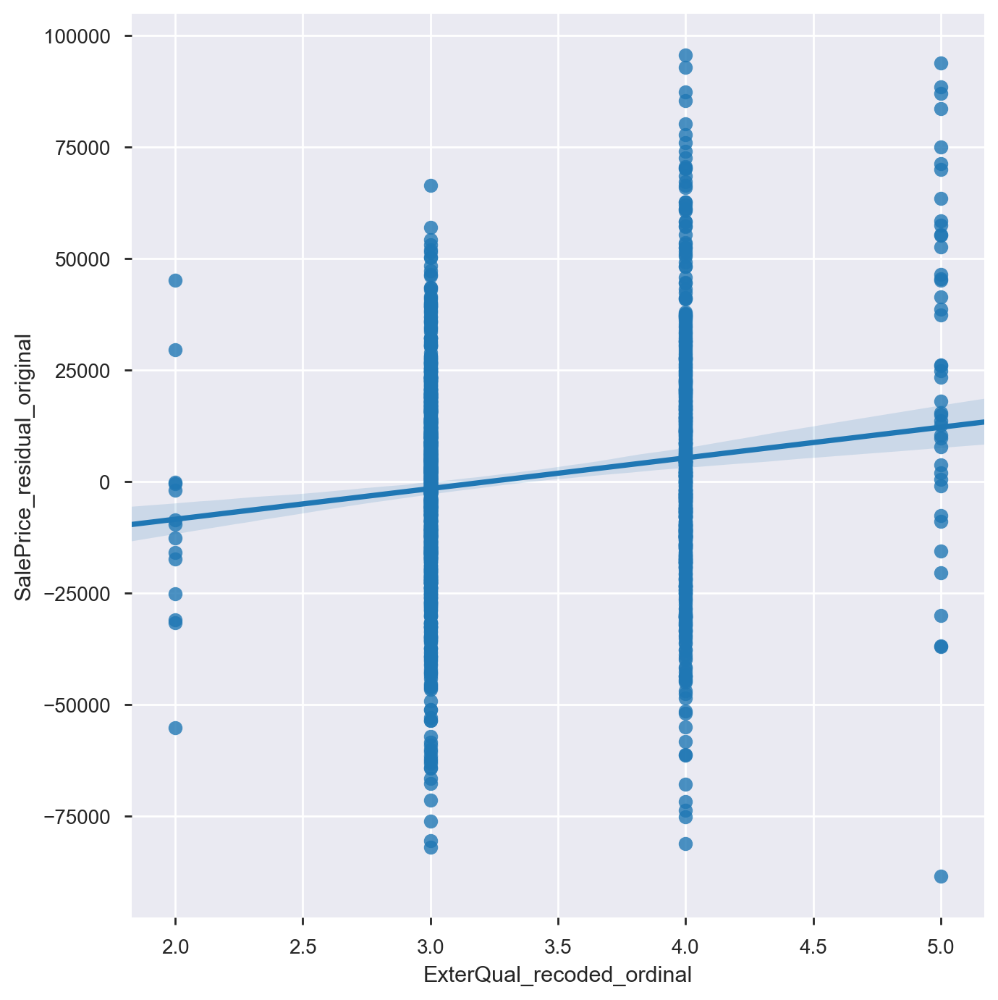

In [274]:
#Plotting scatterplot with regression line for ExterQual_recoded_ordinal
sns.lmplot(x='ExterQual_recoded_ordinal',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=7)

In [275]:
#Checking if has any null values that may need recoding
print(house_clean.Heating.isnull().sum())
#Investigating size of ExterCond groups
print(house_clean.groupby(by="Heating").size())
#As small class sizes, will drop for analyses
#Dropping Street from data set
house_clean.drop(columns=['Heating'], inplace=True)

0
Heating
Floor       1
GasA     1411
GasW       18
Grav        7
OthW        2
Wall        4
dtype: int64


In [276]:
#Checking if has any null values that may need recoding
house_clean.HeatingQC.isnull().sum()
#Investigating size of HeatingQC groups
house_clean.groupby(by="HeatingQC").size()

HeatingQC
Ex    728
Fa     48
Gd    239
Po      1
TA    427
dtype: int64

In [277]:
house_clean["HeatingQC_recoded_ordinal"] = house_clean["HeatingQC"].map({'Ex': 5, 
                                                       'Gd': 4,
                                                       'TA': 3,
                                                       'Fa': 2,
                                                       'Po': 1
                                                      })

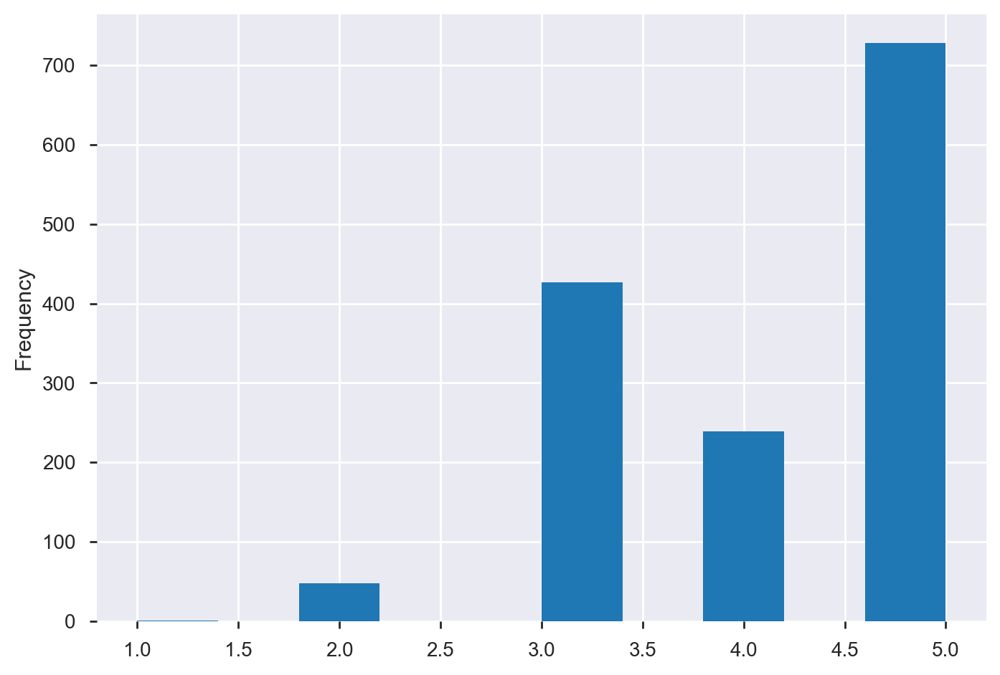

In [278]:
house_clean.HeatingQC_recoded_ordinal.plot(kind='hist', bins=10)

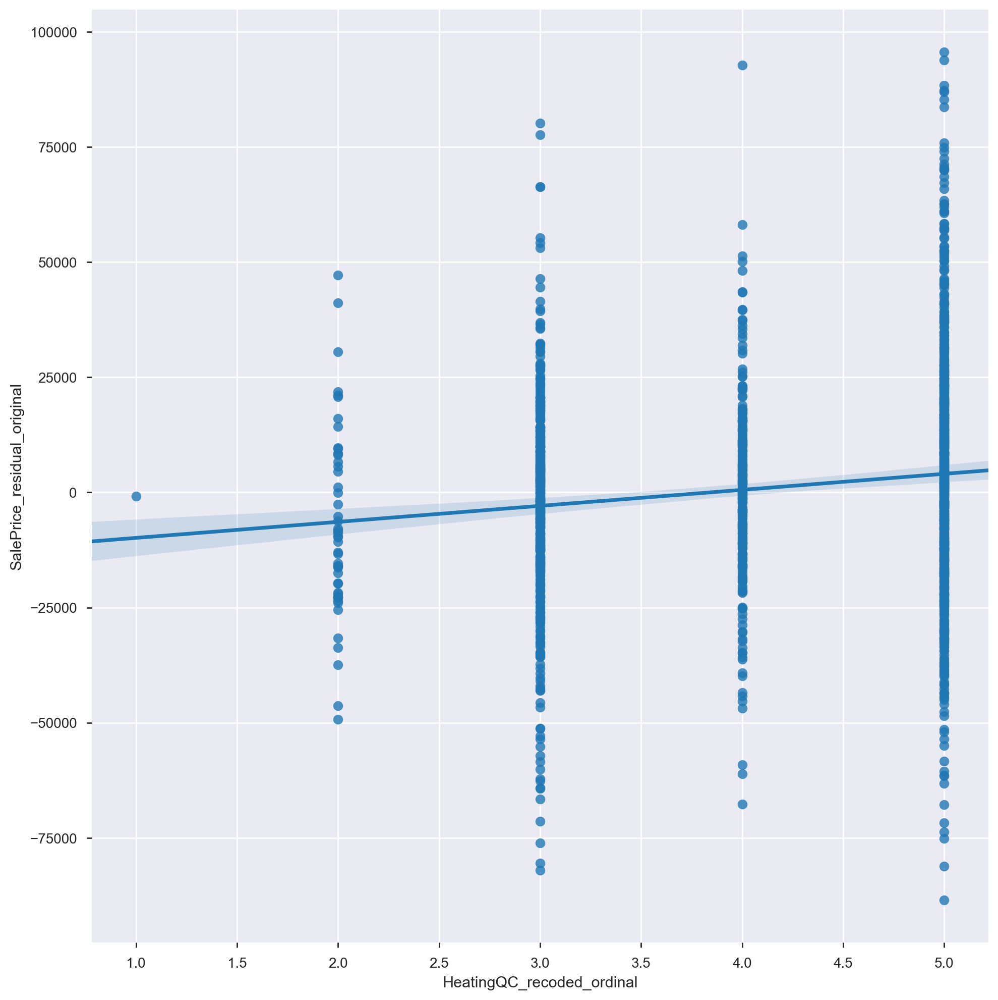

In [279]:
#Plotting scatterplot with regression line for HeatingQC_recoded_ordinal
sns.lmplot(x='HeatingQC_recoded_ordinal',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=10)

In [280]:
#Checking if has any null values that may need recoding
house_clean.CentralAir.isnull().sum()
#Investigating size of CentralAir groups
house_clean.groupby(by="CentralAir").size()
#Central air has a somewhat small class size which may impact on modelling

CentralAir
N      95
Y    1348
dtype: int64

Text(0, 0.5, 'Central Air')

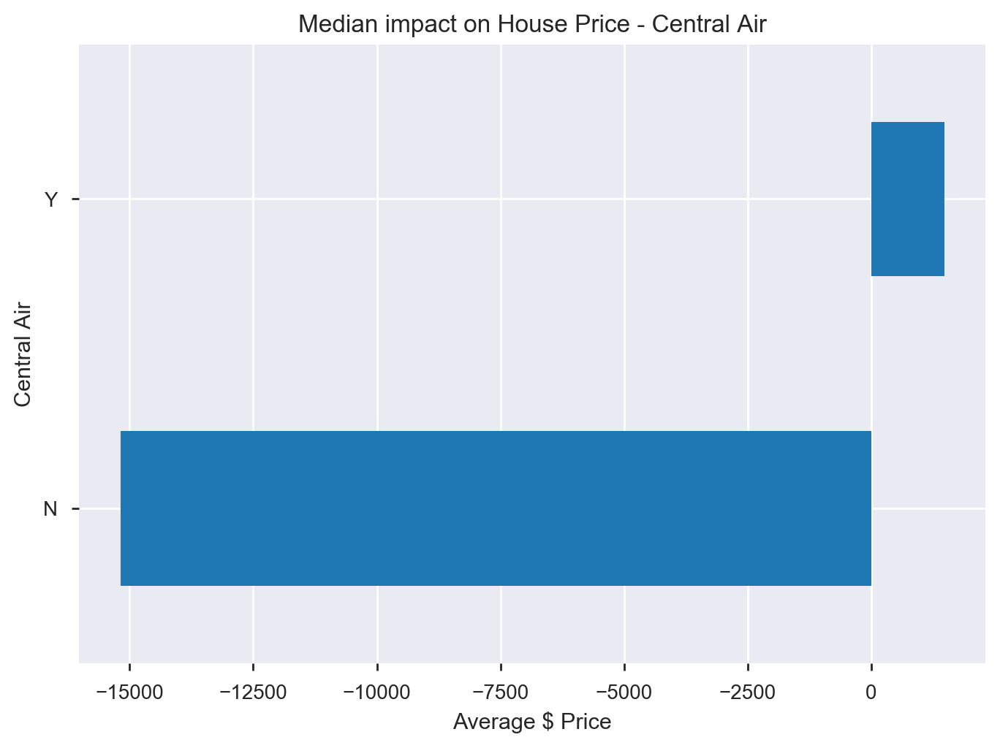

In [281]:
#Investigating prices by CentralAir
CentralAir_sale = house_clean.groupby(by=['CentralAir']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Central Air')
CentralAir_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Central Air')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [282]:
#Checking if has any null values that may need recoding
print(house_clean.Electrical.isnull().sum())
#Investigating size of Electrical groups
print(house_clean.groupby(by="Electrical").size())

1
Electrical
FuseA      94
FuseF      27
FuseP       3
Mix         1
SBrkr    1317
dtype: int64


In [283]:
#Impute null value with most common type of electric
house_clean['Electrical_recoded']= house_clean['Electrical'].copy()
house_clean["Electrical_recoded"].fillna('SBrkr', inplace = True)

In [284]:
#Checking if has any null values that may need recoding
print(house_clean.Electrical_recoded.isnull().sum())
#Investigating size of Electrical groups
print(house_clean.groupby(by="Electrical_recoded").size())
#Recoding electrics for small class sizes
house_clean["Electrical_recoded"] = house_clean["Electrical_recoded"].map({'FuseA': 'Other', 
                                                       'FuseF': 'Other',
                                                       'FuseP': 'Other',
                                                       'Mix': 'Other',
                                                       'SBrkr': 'SBrkr'
                                                      })

0
Electrical_recoded
FuseA      94
FuseF      27
FuseP       3
Mix         1
SBrkr    1318
dtype: int64


Text(0, 0.5, 'Electrical Type')

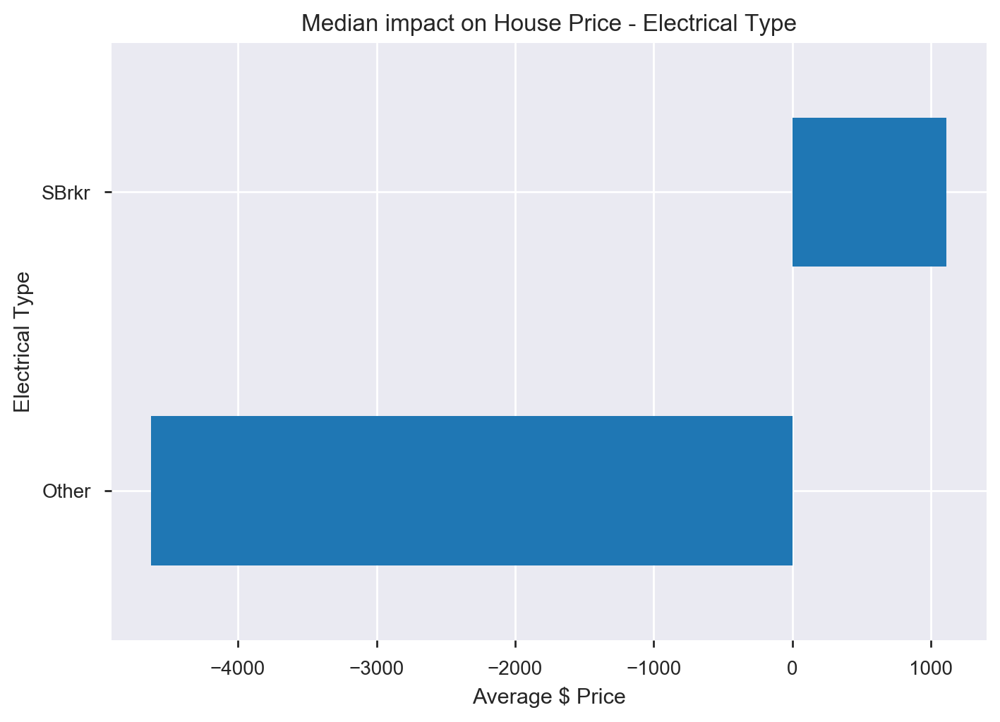

In [285]:
#Investigating prices by CentralAir
electric_sale = house_clean.groupby(by=['Electrical_recoded']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Electrical Type')
electric_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Electrical Type')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [286]:
#Checking if has any null values that may need recoding
print(house_clean.KitchenQual.isnull().sum())
#Investigating size of KitchenQual groups
print(house_clean.groupby(by="KitchenQual").size())

0
KitchenQual
Ex     90
Fa     39
Gd    581
TA    733
dtype: int64


In [287]:
house_clean["KitchenQual_recoded_ordinal"] = house_clean["KitchenQual"].map({'Ex': 5, 
                                                       'Gd': 4,
                                                       'TA': 3,
                                                       'Fa': 2,
                                                       'Po': 1
                                                      })

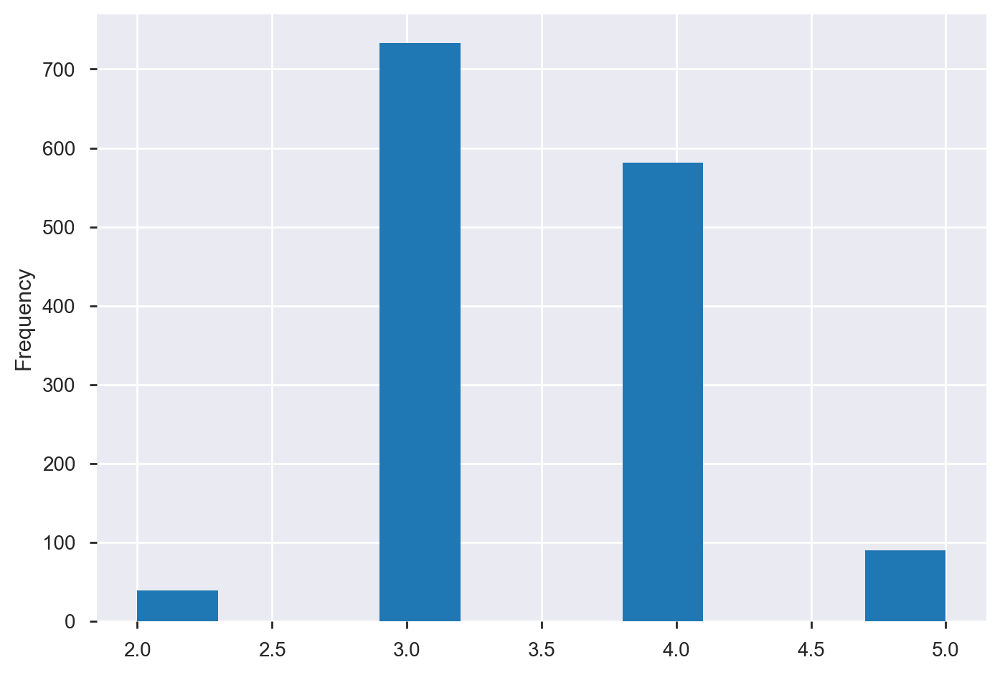

In [288]:
house_clean.KitchenQual_recoded_ordinal.plot(kind='hist')

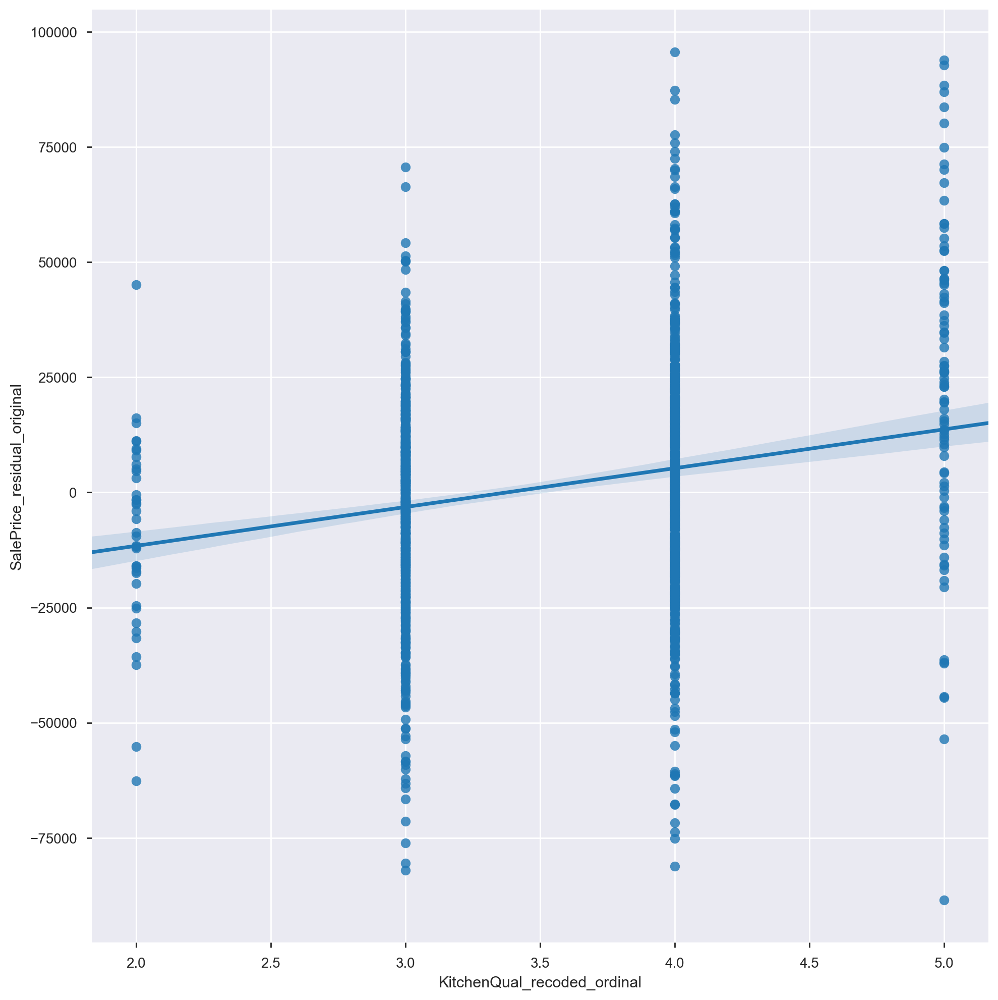

In [289]:
#Plotting scatterplot with regression line for KitchenQual_recoded_ordinal
sns.lmplot(x='KitchenQual_recoded_ordinal',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=10)

In [290]:
#Checking if has any null values that may need recoding
print(house_clean.Fireplaces.isnull().sum())
#Investigating size of Fireplaces groups
print(house_clean.groupby(by="Fireplaces").size())

0
Fireplaces
0    690
1    641
2    108
3      4
dtype: int64


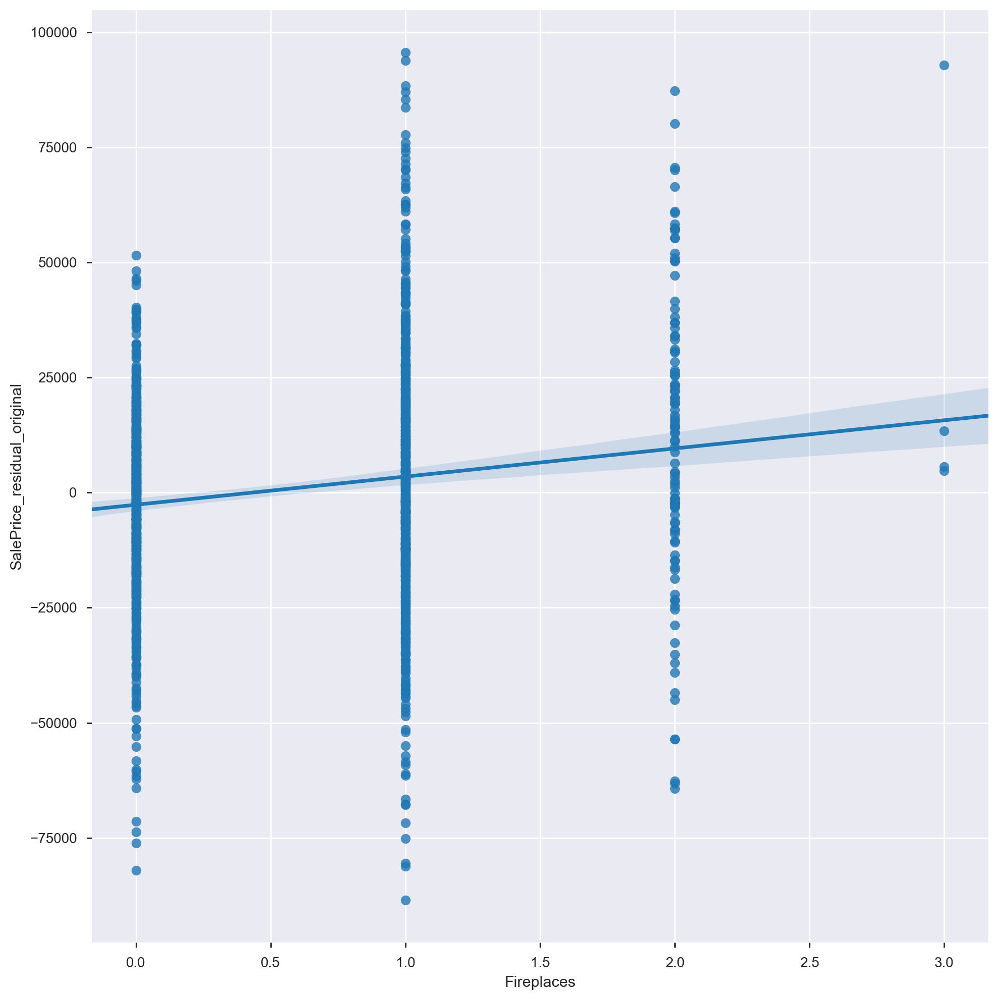

In [291]:
#Plotting scatterplot with regression line for KitchenQual_recoded_ordinal
sns.lmplot(x='Fireplaces',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=10)

In [292]:
#Checking if has any null values that may need recoding
house_clean.PavedDrive.isnull().sum()
#Investigating size of house_clean groups
house_clean.groupby(by="PavedDrive").size()
#Recoding for easier interpretation of labels
house_clean["PavedDrive"] = house_clean["PavedDrive"].map({'Y': 'Paved', 
                                                       'P': 'Partial Pavement',
                                                       'N': 'Dirt/Gravel'
                                                        })


Text(0, 0.5, 'Paved Drive')

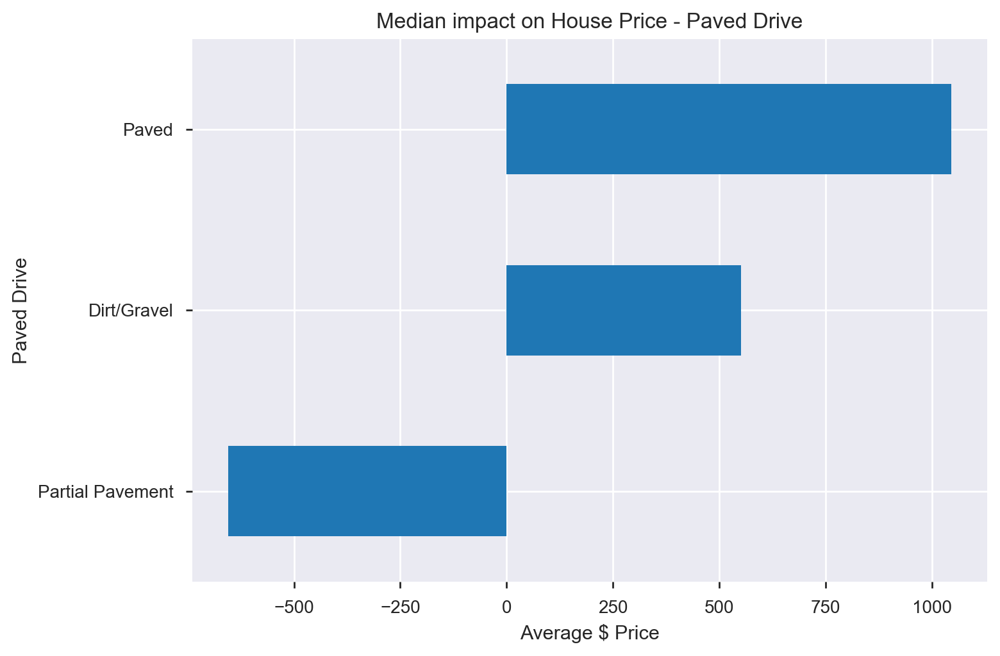

In [293]:
#Investigating prices by PavedDrive
PavedDrive_sale = house_clean.groupby(by=['PavedDrive']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Paved Drive')
PavedDrive_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Paved Drive')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [294]:
#Checking if has any null values that may need recoding
house_clean.WoodDeckSF.isnull().sum()

0

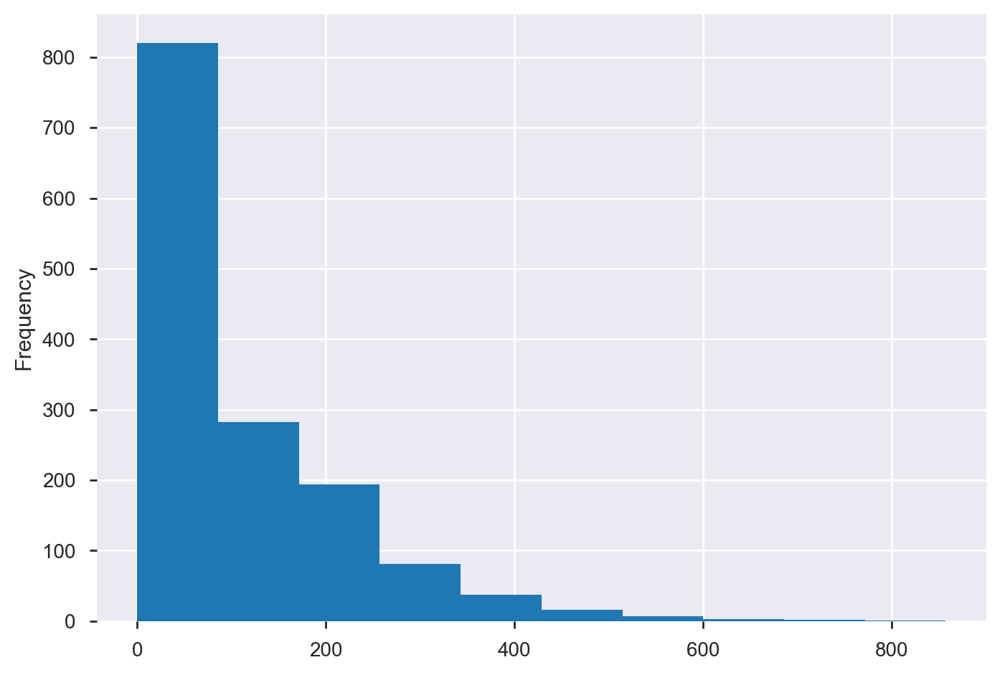

In [295]:
#Investigating WoodDeckSF distribution
house_clean.WoodDeckSF.plot(kind='hist', bins=10)
#WoodDeckSF is highly positively skewed

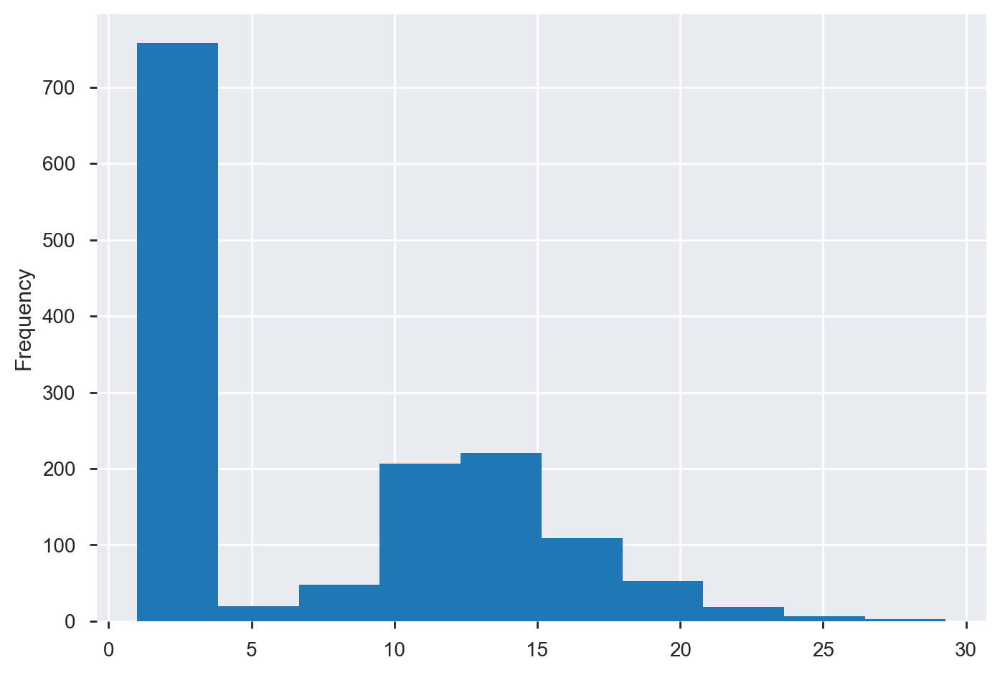

In [296]:
#Investigating various transformations of WoodDeckSF due to strong skew. 
np.sqrt(1+house_clean.WoodDeckSF).plot(kind='hist', bins=10)

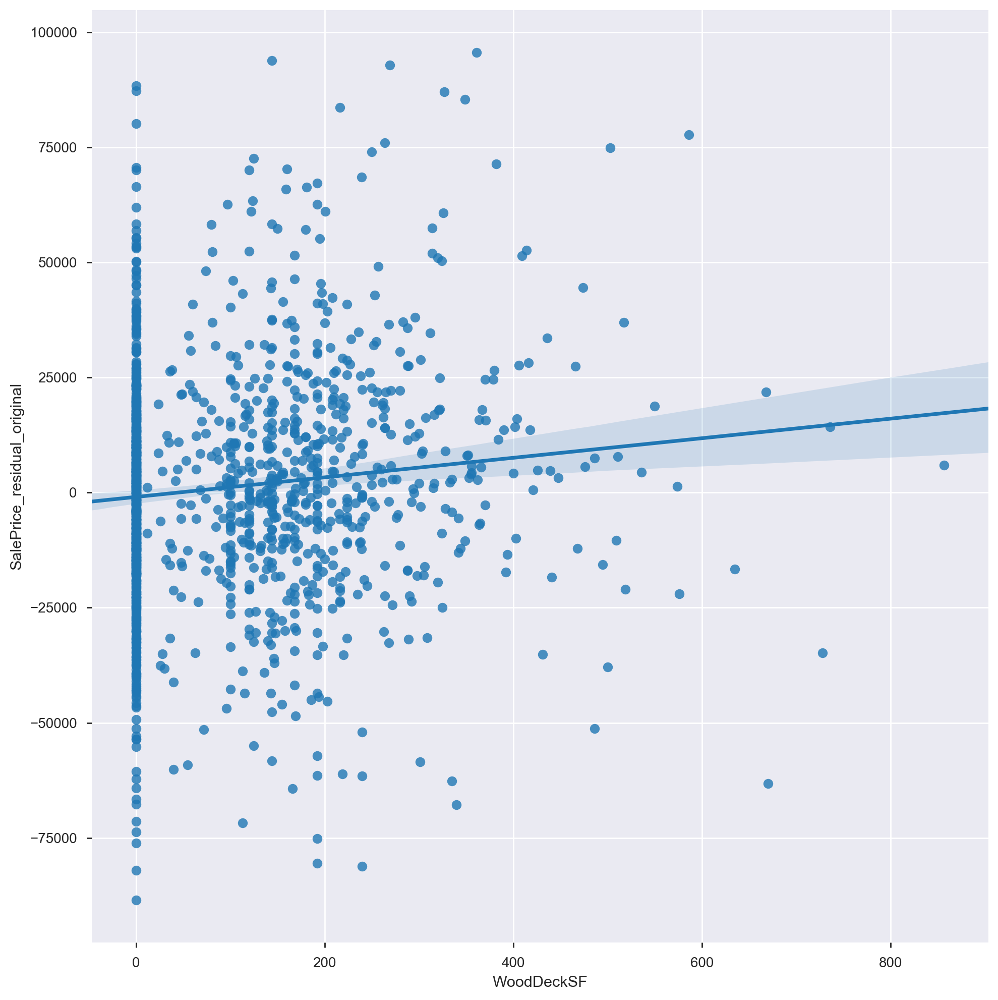

In [297]:
#Plotting scatterplot with regression line for WoodDeckSF
sns.lmplot(x='WoodDeckSF',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=10)

In [298]:
#Create a Wooddeck_flag identifying properties that has wooddeck or not
house_clean['wooddeck_flag'] = house_clean['WoodDeckSF'].apply(lambda x: 'No WoodDeck' if x == 0 else 'WoodDeck')

Text(0, 0.5, 'WoodDeck')

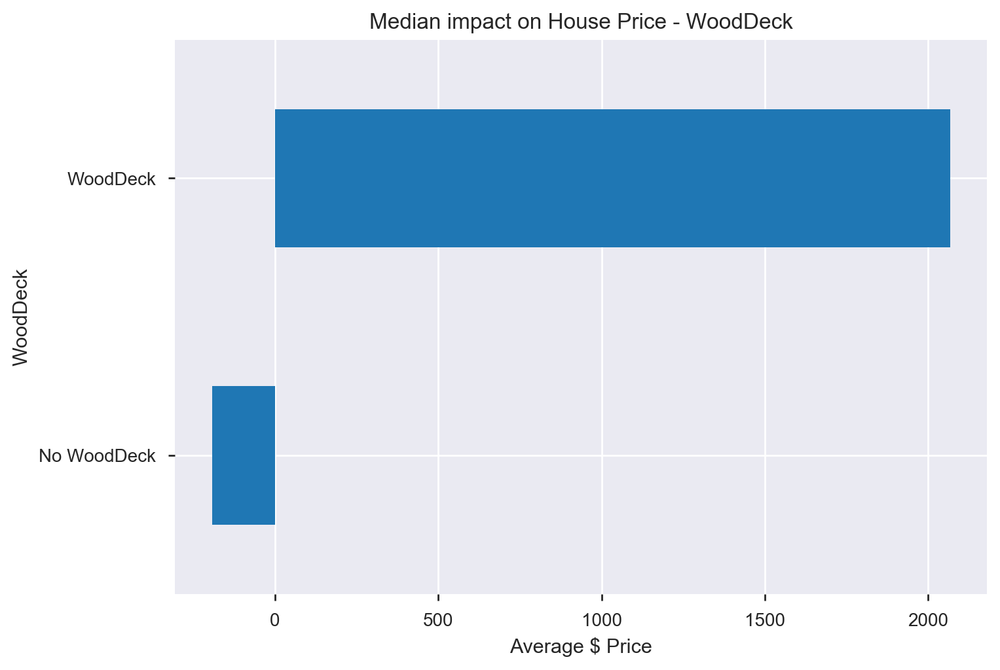

In [299]:
#Investigating prices by wooddeck_flag
wooddeck_flag_sale = house_clean.groupby(by=['wooddeck_flag']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - WoodDeck')
wooddeck_flag_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('WoodDeck')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [300]:
#Investigating various types of porches
print(house_clean.OpenPorchSF.isnull().sum())
print(house_clean.EnclosedPorch.isnull().sum())
print(house_clean['3SsnPorch'].isnull().sum())
print(house_clean.ScreenPorch.isnull().sum())

0
0
0
0


In [301]:
#Rename 3SsnPorch to prevent confusion in programming due to use of number
house_clean.rename(columns={'3SsnPorch': 'ThreeSsnPorch'}, inplace=True)

In [302]:
house_clean['OpenPorchSF_flag'] = house_clean['OpenPorchSF'].apply(lambda x: 'No OpenPorch' if x == 0 else 'OpenPorch')
house_clean['EnclosedPorch_flag'] = house_clean['EnclosedPorch'].apply(lambda x: 'No Enclosed Porch' if x == 0 else 'Enclosed Porch')
house_clean['ThreeSsnPorch_flag'] = house_clean['ThreeSsnPorch'].apply(lambda x: 'No Three Season Porch' if x == 0 else 'Three Season Porch')
house_clean['ScreenPorch_flag'] = house_clean['ScreenPorch'].apply(lambda x: 'No Screen Porch' if x == 0 else 'ScreenPorch')

In [303]:
#Investigating size of OpenPorchSF_flag groups
house_clean.groupby(by="OpenPorchSF_flag").size()

OpenPorchSF_flag
No OpenPorch    653
OpenPorch       790
dtype: int64

In [304]:
#Investigating size of EnclosedPorch_flag groups
house_clean.groupby(by="EnclosedPorch_flag").size()

EnclosedPorch_flag
Enclosed Porch        207
No Enclosed Porch    1236
dtype: int64

In [305]:
#Investigating size of ThreeSsnPorch_flag groups
house_clean.groupby(by="ThreeSsnPorch_flag").size()
#Small class size. Can leave out of analyses

ThreeSsnPorch_flag
No Three Season Porch    1420
Three Season Porch         23
dtype: int64

In [306]:
#Investigating size of ScreenPorch_flag groups
house_clean.groupby(by="ScreenPorch_flag").size()

ScreenPorch_flag
No Screen Porch    1330
ScreenPorch         113
dtype: int64

In [307]:
#Checking if has any null values that may need recoding
house_clean.PoolArea.isnull().sum()

0

In [308]:
house_clean['pool_flag'] = house_clean['PoolArea'].apply(lambda x: 'No Pool' if x == 0 else 'Pool')

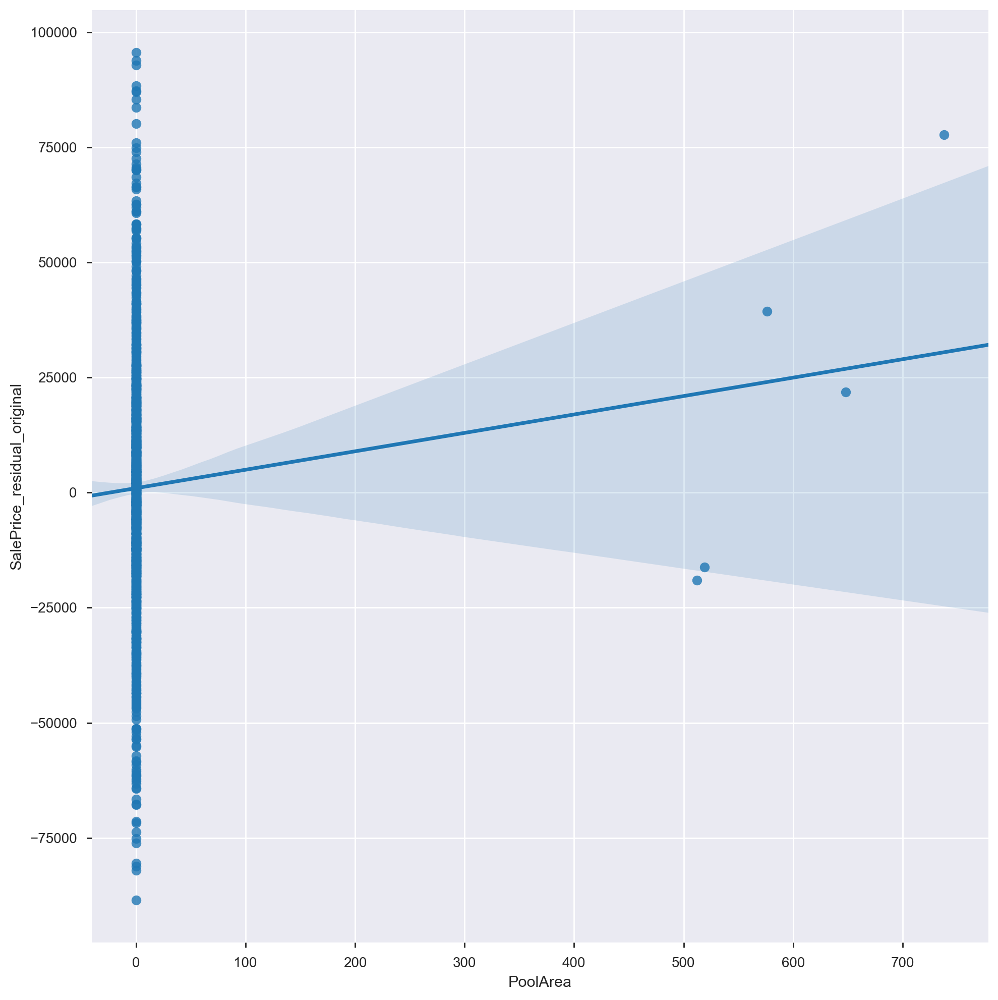

In [309]:
#Plotting scatterplot with regression line for PoolArea
sns.lmplot(x='PoolArea',y='SalePrice_residual_original',data=house_clean,fit_reg=True, height=10)

In [310]:
#Investigating size of pool_flag groups
house_clean.groupby(by="pool_flag").size()
#Small Sample size for pool. Therefore will not include in modelling

pool_flag
No Pool    1438
Pool          5
dtype: int64

Text(0, 0.5, 'Pool')

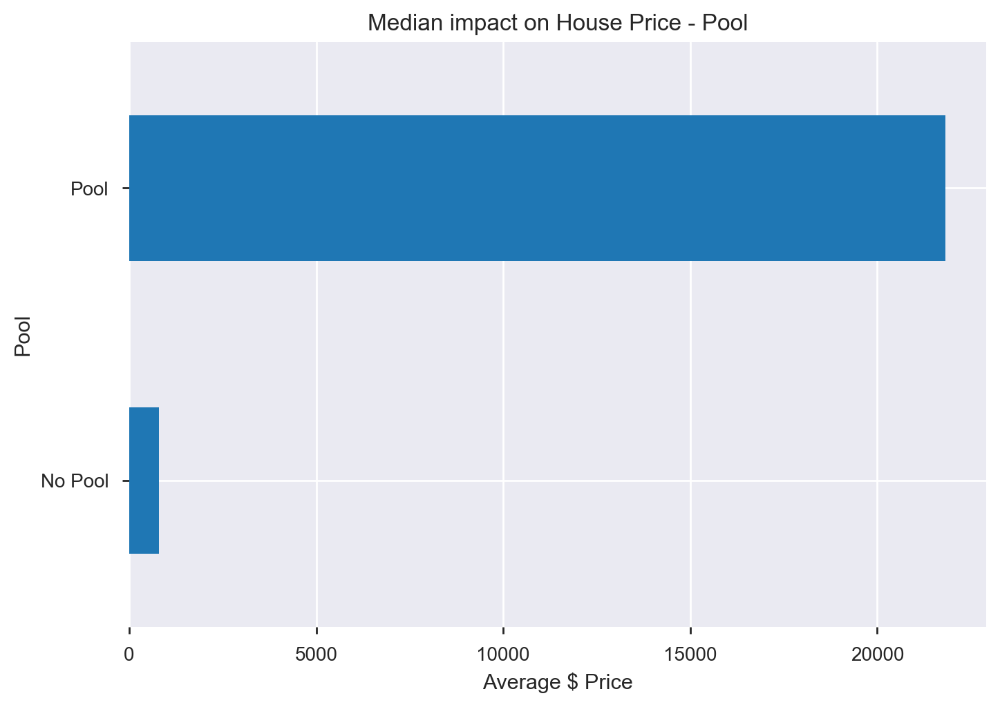

In [311]:
#Investigating prices by pool_flag
pool_flag_sale = house_clean.groupby(by=['pool_flag']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Pool')
pool_flag_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Pool')
#Results suggests not much difference in average sale prices for modelled and remodelled houses

In [312]:
#Checking if has any null values that may need recoding
print(house_clean.Fence.isnull().sum())
#Investigating size of Fence groups
house_clean.groupby(by="Fence").size()

1164


Fence
GdPrv     58
GdWo      54
MnPrv    156
MnWw      11
dtype: int64

In [313]:
#Recode alley_recoded null values to No Fence to match data dictionary and facilitate modelling
house_clean['Fence_recoded']= house_clean['Fence'].copy()
house_clean["Fence_recoded"].fillna('No Fence', inplace = True)
#Investigating size of Fence groups
house_clean.groupby(by="Fence_recoded").size()

Fence_recoded
GdPrv         58
GdWo          54
MnPrv        156
MnWw          11
No Fence    1164
dtype: int64

In [314]:
#Checking if has any null values that may need recoding
house_clean.MiscFeature.isnull().sum()

1389

In [315]:
#Investigating size of MiscFeature groups
house_clean.groupby(by="MiscFeature").size()
#Suggests we can create a flag for properties with sheds over 100sqft as likely to be a selling point
#such as those who wish to store boats or store things. Also coul be used for recreational activities (e.g. pool room)

MiscFeature
Gar2     2
Othr     2
Shed    49
TenC     1
dtype: int64

In [316]:
#Creating a large_shed flag to identify sheds larger than 100sqft on the property
house_clean['large_shed_flag'] = house_clean['MiscFeature'].apply(lambda x: 'No large shed' if x != 'Shed' else 'Large Shed')

Text(0, 0.5, 'Large Shed')

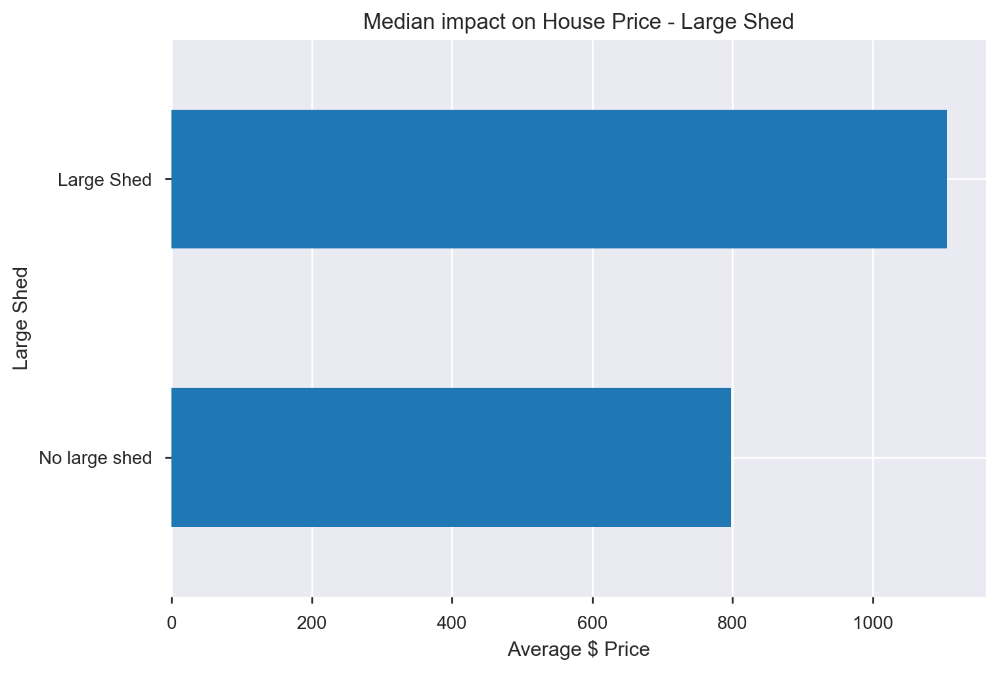

In [317]:
#Investigating prices by large_shed_flag
large_shed_sale = house_clean.groupby(by=['large_shed_flag']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Large Shed')
large_shed_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Large Shed')
#Results suggests not much difference in average sale prices for plots with and without large sheds

In [318]:
#Checking if has any null values that may need recoding
house_clean.KitchenAbvGr.isnull().sum()
#Investigating size of MiscFeature groups
house_clean.groupby(by="KitchenAbvGr").size()

KitchenAbvGr
0       1
1    1376
2      64
3       2
dtype: int64

Text(0, 0.5, 'Large Shed')

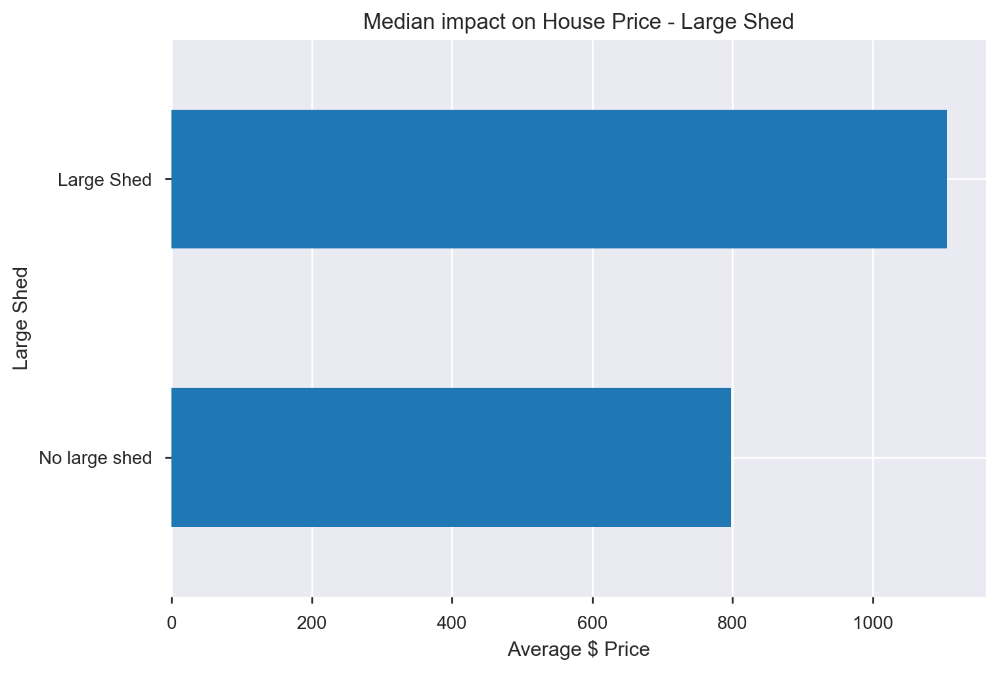

In [319]:
#Investigating prices by large_shed_flag
large_shed_sale = house_clean.groupby(by=['large_shed_flag']).SalePrice_residual_original.agg(np.median).round(decimals=0).sort_values(ascending=True)
plt.title('Median impact on House Price - Large Shed')
large_shed_sale.plot(kind='barh', rot=0)
plt.xlabel('Average $ Price')
plt.ylabel('Large Shed')
#Results suggests not much difference in average sale prices for plots with and without large sheds

**MODELLING**

In [320]:
house_clean.columns.to_list()

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Alley',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ThreeSsnPorch',
 'ScreenPorch',
 'PoolArea'

In [321]:
#Set up grouping variables for dummy coding
change_variable_dummy_list = house_clean[[ 'remodel_flag',
                                             'RoofStyle_recoded',
                                             'Exterior1st_reduced',
                                             'MasVnrType_recoded',
                                             'Electrical_recoded',
                                             'wooddeck_flag',
                                             'OpenPorchSF_flag',
                                             'EnclosedPorch_flag',
                                             'ThreeSsnPorch_flag',
                                             'ScreenPorch_flag',
                                             'pool_flag',
                                             'Fence_recoded',
                                             'large_shed_flag']]
#Get dummies of variables and update the dummies dataframe
change_variable_dummy_list = pd.get_dummies(change_variable_dummy_list)
change_variable_dummy_list.columns.tolist()

['remodel_flag_Original',
 'remodel_flag_Remodelled',
 'RoofStyle_recoded_Gable',
 'RoofStyle_recoded_Hip',
 'RoofStyle_recoded_Other',
 'Exterior1st_reduced_BrkFace',
 'Exterior1st_reduced_CemntBd',
 'Exterior1st_reduced_HdBoard',
 'Exterior1st_reduced_MetalSd',
 'Exterior1st_reduced_Other',
 'Exterior1st_reduced_Plywood',
 'Exterior1st_reduced_VinylSd',
 'Exterior1st_reduced_Wd Sdng',
 'MasVnrType_recoded_BrkCmn',
 'MasVnrType_recoded_BrkFace',
 'MasVnrType_recoded_None',
 'MasVnrType_recoded_Stone',
 'Electrical_recoded_Other',
 'Electrical_recoded_SBrkr',
 'wooddeck_flag_No WoodDeck',
 'wooddeck_flag_WoodDeck',
 'OpenPorchSF_flag_No OpenPorch',
 'OpenPorchSF_flag_OpenPorch',
 'EnclosedPorch_flag_Enclosed Porch',
 'EnclosedPorch_flag_No Enclosed Porch',
 'ThreeSsnPorch_flag_No Three Season Porch',
 'ThreeSsnPorch_flag_Three Season Porch',
 'ScreenPorch_flag_No Screen Porch',
 'ScreenPorch_flag_ScreenPorch',
 'pool_flag_No Pool',
 'pool_flag_Pool',
 'Fence_recoded_GdPrv',
 'Fence_rec

In [322]:
#Append the changeable dummy features to the dataframe
house_clean = house_clean.join(change_variable_dummy_list)

In [323]:
#Create X and y variables for testing
#Reference categories for dummy variables are hashed out
X = house_clean[['ExterQual_recoded_ordinal',
                 'OverallCond',
                 'OverallQual',
                 'HeatingQC_recoded_ordinal',
                 'KitchenQual_recoded_ordinal',
                 'PoolArea',
                 'WoodDeckSF',
                 'Fireplaces',
                 'KitchenAbvGr',
#                  'remodel_flag_Original',
#                  'remodel_flag_Remodelled',
#                  'RoofStyle_recoded_Gable',
#                  'RoofStyle_recoded_Hip',
#                  'RoofStyle_recoded_Other',
                 #'Exterior1st_reduced_BrkFace',
#                  'Exterior1st_reduced_CemntBd',
#                  'Exterior1st_reduced_HdBoard',
#                  'Exterior1st_reduced_MetalSd',
#                  'Exterior1st_reduced_Other',
#                  'Exterior1st_reduced_Plywood',
#                  'Exterior1st_reduced_VinylSd',
#                  'Exterior1st_reduced_Wd Sdng',
#                  'MasVnrType_recoded_BrkCmn',
#                  #'MasVnrType_recoded_BrkFace',
#                  'MasVnrType_recoded_None',
#                  'MasVnrType_recoded_Stone',
                 'Electrical_recoded_Other',
#                  'Electrical_recoded_SBrkr',
#                  'wooddeck_flag_No WoodDeck',
#                  'wooddeck_flag_WoodDeck',
#                  'OpenPorchSF_flag_No OpenPorch',
                 'OpenPorchSF_flag_OpenPorch',
                 'EnclosedPorch_flag_Enclosed Porch',
#                  'EnclosedPorch_flag_No Enclosed Porch',
#                  'ScreenPorch_flag_No Screen Porch',
                 'ScreenPorch_flag_ScreenPorch',
#                  'pool_flag_No Pool',
#                  'pool_flag_Pool',
#                  'Fence_recoded_GdPrv',
#                  'Fence_recoded_GdWo',
#                  'Fence_recoded_MnPrv',
#                  'Fence_recoded_MnWw',
#                  'Fence_recoded_No Fence',
                 'large_shed_flag_Large Shed',
#                  'large_shed_flag_No large shed'
                ]]
y =  house_clean['SalePrice_residual_original']

In [324]:
#Join feature and target into single dataframe to investigate relationships
combinded_change_df = X.join(y)

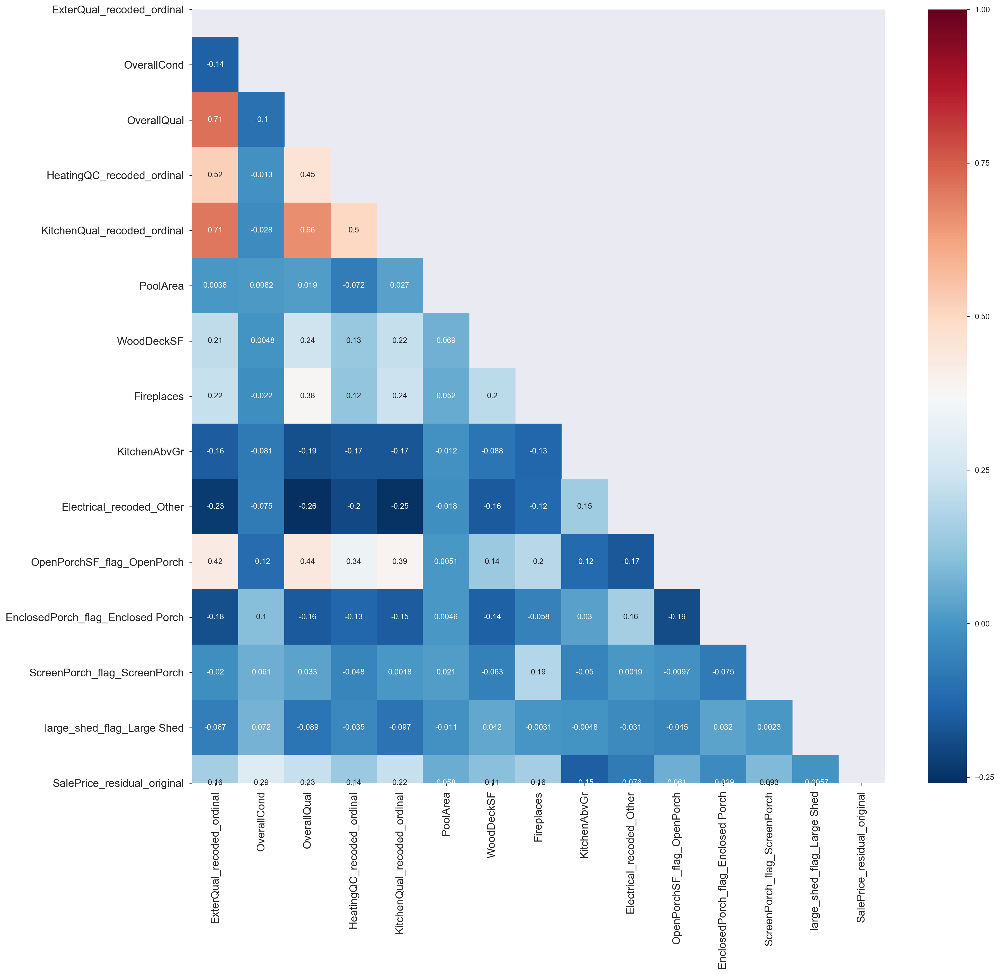

In [325]:
def correlation_heat_map(df):
    corrs = df.corr()

    # Set the default matplotlib figure size:
    fig, ax = plt.subplots(figsize=(20,18))

    # Generate a mask for the upper triangle (taken from seaborn example gallery)
    mask = np.zeros_like(corrs, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True

    # Plot the heatmap with seaborn.
    # Assign the matplotlib axis the function returns. This will let us resize the labels.
    #Uses a diverging colour index to more easily identify positive and negative relationships
    ax = sns.heatmap(corrs, mask=mask, annot=True,cmap='RdBu_r')

    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=14, rotation=90)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=14, rotation=0)
    plt.show()

#Join feature and target into single dataframe to investigate relationships
combinded_change_df = X.join(y) 
correlation_heat_map(np.round(combinded_change_df,decimals=0))
#Suggests little in terms of relationships to residual sale price. Also there is little issue around multi-collinarity
#expect for perhaps between ExteQual and KitchQual at r = .71

In [326]:
ss = StandardScaler()
Xs = ss.fit_transform(X)

In [327]:
# A:
#Creates an empty sklearn.linear_model object
lr = LinearRegression()

lr_values = cross_val_score(lr, Xs, y, cv=10)

print('Predicted K-Fold cross-validation R2 scores:',lr_values)
print('The min is', min(lr_values),'\nThe max is',max(lr_values))
print('The range is',max(lr_values)-min(lr_values))
print('Mean R2 is',lr_values.mean())
print('The Std of R2 is',np.std(lr_values))
#Current model has low R2 and high variance suggesting overfitted model

Predicted K-Fold cross-validation R2 scores: [-0.04434812  0.13430282  0.11821523  0.12966253  0.14911942  0.19299185
  0.12629346  0.17688332  0.25068081  0.21318185]
The min is -0.04434811910203962 
The max is 0.25068080500721024
The range is 0.29502892410924986
Mean R2 is 0.14469831799775937
The Std of R2 is 0.07511508339949995


**Lasso Model**

In [328]:
#Now investigate whether other models improve predictions. We will start with a lasso model
# Intalises a LassoCV (lasso regression cross validation with 10 folds) gradient descent object
optimal_lasso = LassoCV(n_alphas=500, cv=10,verbose=0,max_iter=2000)
# fits the lasso regression with coordinate descent on the X daata with target y
optimal_lasso.fit(Xs, y)
# Prints the optimal alpha (lambda value for use in the final model)
print(optimal_lasso.alpha_)

138.39295172698158


In [329]:
lasso = Lasso(alpha=optimal_lasso.alpha_)

lasso_scores = cross_val_score(lasso, Xs, y, cv=10)

print(lasso_scores)
print('The min is', min(lasso_scores),'\nThe max is',max(lasso_scores))
print('The range is',max(lasso_scores)-min(lasso_scores))
print('The average is',np.mean(lasso_scores))
print('The Std of R2 is',np.std(lasso_scores))

[-0.0395274   0.13840503  0.12080009  0.13039256  0.14855633  0.19639047
  0.13034623  0.17459621  0.24817223  0.21122958]
The min is -0.03952739755051904 
The max is 0.2481722264613071
The range is 0.28769962401182614
The average is 0.14593613395904487
The Std of R2 is 0.0732524857868191


In [330]:
#
lasso_model = optimal_lasso.fit(Xs, y)
#Creating predicting on Xs_test data set
lasso_predictions  =  lasso_model.predict(Xs)
#Assessing how well lasso model fitted above is for predicting test set
lasso_score        =  lasso_model.score(Xs, y)
print("The LASSO REGRESSION model predicts", lasso_score, "% of variance in residual sale price" )

The LASSO REGRESSION model predicts 0.17301039213316438 % of variance in residual sale price


In [331]:
#Create a new dataframe containing all the coefficients needed
lasso_coefficient_dataframe = pd.DataFrame({'Feature':X.columns,
                                      'Coefficient':lasso_model.coef_,
                                      'Coefficient Absolute': abs(lasso_model.coef_)})
#Output coefficients to a file for review
# Positive coefficient = blue, Negative coefficient = Red # 
lasso_coefficient_dataframe['colour']=lasso_coefficient_dataframe['Coefficient'].apply(lambda x : 'green' if x>0 else 'red')
lasso_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False).to_csv(r'lasso_regression_model_coefficients.csv')
#Reorders the coefficients dataframe. These coefficients can be used in prediction coefficients but does not 
#tell us the respective importance of each feature as the values are not standardised
lasso_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)

,Feature,Coefficient,Coefficient Absolute,colour
1,OverallCond,7159.387383,7159.387383,green
2,OverallQual,3701.316357,3701.316357,green
4,KitchenQual_recoded_ordinal,2625.707484,2625.707484,green
8,KitchenAbvGr,-1690.304740,1690.304740,red
7,Fireplaces,1427.231238,1427.231238,green
12,ScreenPorch_flag_ScreenPorch,1254.344862,1254.344862,green
5,PoolArea,934.274453,934.274453,green
6,WoodDeckSF,827.231912,827.231912,green
10,OpenPorchSF_flag_OpenPorch,-761.315565,761.315565,red
9,Electrical_recoded_Other,651.137331,651.137331,green


Text(0, 0.5, 'Predicted Feature Value ($)')

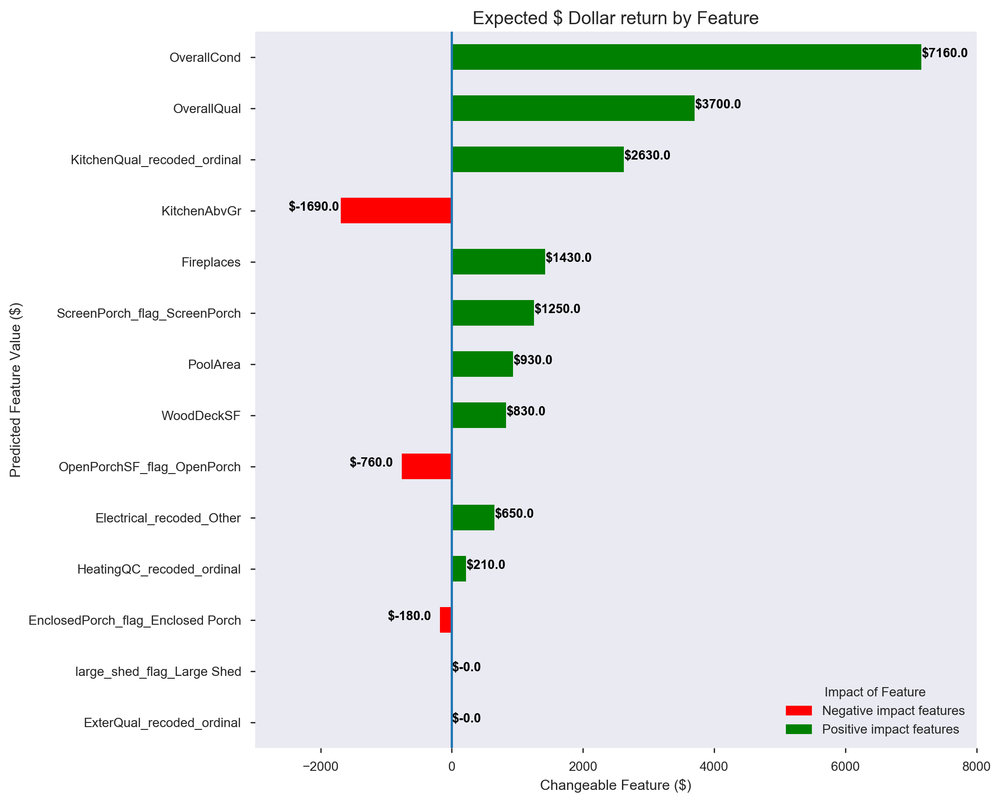

In [332]:
import matplotlib.patches as mpatches

lasso_coefficient_dataframe.sort_values(by='Coefficient Absolute', ascending=False)
lasso_coefficient_dataframe_sorted = lasso_coefficient_dataframe.sort_values('Coefficient Absolute',ascending=True)
lasso_coefficient_dataframe_sorted.plot(x='Feature',
                                        y='Coefficient',
                                        kind='barh',
                                        figsize=(10,10),color=lasso_coefficient_dataframe_sorted['colour'],
                                       )
ax = plt.gca()

#This sets the axis to the same 
plt.xlim(-3000, 8000)
plt.axvline(x=0)
plt.grid(b=False)

#Create a legend labels for colour coded bars
negative_features = mpatches.Patch(color='red', label='Negative impact features')
positive_features= mpatches.Patch(color='green', label='Positive impact features')

ax.legend(handles=[negative_features,positive_features],title='Impact of Feature',loc='lower right')

for i, v in enumerate(lasso_coefficient_dataframe_sorted['Coefficient']):
    if v>=0:
        ax.text(v, i, str("$")+str(np.round(v,decimals=-1)), color='black', fontweight='bold')
    if v<0:
        ax.text(v-800, i, str("$")+str(np.round(v,decimals=-1)), color='black', fontweight='bold')

plt.title('Expected $ Dollar return by Feature', fontdict={'fontsize': 14})
plt.xlabel('Changeable Feature ($)')
plt.ylabel('Predicted Feature Value ($)')

### Discussion of Results


**Effect in dollars of the renovate-able features**

In terms of the renovate-able features, the **top-three** features relative to all features that have an impact on overall price is:
* **The overall condition of the house**: an increase in rating by one standard deviation unit (1.1081) on the scale is associated with an expected return of **\$7,160**. For example, an increase from a rating of 5 (Average) to 9 (Excellent) which is a four-point increase would be generate an expected return on investment of ~\$25,846‬. 

* **The overall material and finish of the house**: an increase in rating by one standard deviation unit (1.3516) is associated with an expected return of **\$3,700**. For example, an increase from a rating of 5 (Average) to 9 (Excellent) which is a four-point increase would be generate an expected return on investment of ~\$10,950‬.

* **Kitchen quality**: an increase in the quality of a kitchen by one standard deviation unit (0.6551) on the scale (ranging from 5 Poor to Excellent)) is associated with an expected return of **$2,630**. For example, an increase from a poor rating to an excellent rating would be generate an expected return on investment of ~\$16,059‬. 


While not appearing in the top three, other features of note include:

* **Pool Size**: an increase in rating by one standard deviation unit (35.54 sq. ft) in pool size is associated with an expected return of *\$*930**. The expected return on investment for a median size pool (576.0sqft) therefore would be ~\$15,071.



**How would your company use this second model and its coefficients to determine whether they should buy a property or not?** 

As implied above the company could use the renovate-able features model coefficients to calculate the expected return on investment if they achieve improvements in the respective features on a property (all other features being equal). Therefore, the company could:

* for the identified property, the company should input the current feature status of a property PRIOR to any renovation to obtain the current estimated 'value' of renovate-able property features (that are part of the model)
* input the expected feature property status AFTER any renovation of a feature(s) and obtain the estimated 'value' after renovating
* calculate the dollar value difference between the PRIOR value and AFTER value to identify the expected ROI
* compare the expected ROI to the projected cost of the renovation
* if projected cost is MORE than expected ROI then the property should not be purchased
* if projected cost is substantially LESS than expected ROI then the property may be an opportunity for purchase. The "substantially" is included on the fact that the model has somewhat high levels of error/low confidence.  


**Explain how the company can use the two models you have built to determine if they can make money.**

The recommended approach would first use the fixed feature model help identify potentially 'undervalued' properties. Fixed features are more of a driver of sale price then renovate-able features as shown by the high ability to predict sale price from these features.

In the case of the fixed feature model, we could use the coefficients to calculate the expected sale price of a property, with an emphasis on features with an expected positive impact on price. It would be recommended to focus on properties the most impactful features:

* **Size of General living area**: the size of the general living area has the highest impact on price.
* **Height/Quality of Basement**: surprisingly, the size of the base (defined as quality in the data dictionary) has a large impact on price. Focusing on properties with basements more than 90cm (rated as good or excellent), therefore, is recommend.
* **Neighbourhoods of College Creek, Northridge Heights, Somerset and Northridge**: recommend focus on the neighbourhoods of College Creek, Northridge Heights, Somerset and Northridge as these neighbourhoods compared to Old Town (the reference neighbourhood) are better predictors of price than other neighbourhoods. Identifying undervalued properties in these neighbourhoods, therefore, will contribute to higher sale prices.

However, while more weight should be placed on the fixed feature model due to improved ability to make predictions, the renovate-able features model can also be used to further inform decision-making. Specifically, it is recommended that:

* **General Condition and Quality**: recommend focus improving the overall condition and quality of a property rather than adding specific features to a property such as a pool or changing the electrics.
* **Kitchen**: recommend focus on improving the existing kitchen if possible, as inexpensively as possible as while the quality of the kitchen is a driving factor, the return on investment is not particularly high when improvements are made to this feature.


**Do you trust your model? Should it be used to evaluate which properties to buy and fix up?**

As noted above, there is quite high confidence in the fixed price model, which can be expected to explain about 81-85% of variance in the log of SalePrice. The fixed feature model, therefore, would have quite high confidence, particularly for those properties around the median sale price for all properties where the model did particularly well. Properties at the lower end of the sale price though see some higher levels of uncertainty. 

In regards to the renovate-able features, there is less confidence in the model to predict price, with only 15% of residual sale price being explained although there is somewhat low variance in this prediction with most models falling +/-5% of this. However, all things being equal, it can increase the confidence in decisions made, particularly by focusing on properties that are in poorer condition and lower overall quality once properties with the key fixed features have been identified.


**Note this is some other testing with PCA being used prior to modelling**

In [333]:
from sklearn.decomposition import FactorAnalysis
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import make_pipeline

In [334]:
#Initalises a Factor Analysis wrapper, with no factors specified. Random state used for replication
FA = FactorAnalysis(n_components=5, random_state=0)

In [335]:
#Create a SKLearn pipeline
#First applied a MinMax Scaler (is a standardisation approac), before running the factors analysis, and finally running the lassoCV
mod=make_pipeline(MinMaxScaler(),FA,LassoCV())

In [336]:
#Runs the pipeline and outputs result for the changeable features model 
mod.fit(X,y)
mod.score(X,y)

0.14867232081083703

In [337]:
#Data Frame with factors. 
Factor_loadings = pd.DataFrame(mod[1].components_,columns=X.columns).T
Factor_loadings.style.apply(lambda x: ["background: green" if v > .1
                                           or v < -0.1
                                       else "" for v in x], axis = 1)

,0,1,2,3,4
ExterQual_recoded_ordinal,-0.162078,-0.0256846,-0.000835038,0.0086592,0.0129452
OverallCond,0.0160036,0.0170193,0.0451029,-0.059835,0.00269594
OverallQual,-0.125887,0.0158141,0.00583456,0.0119733,-0.00558873
HeatingQC_recoded_ordinal,-0.140638,-0.0333382,0.00998647,-0.0337853,0.00508979
KitchenQual_recoded_ordinal,-0.175939,-0.0143963,0.0190275,-0.0181936,0.0107782
PoolArea,-0.000729319,0.00421268,0.000620173,0.000740031,-0.00288983
WoodDeckSF,-0.0408021,0.0173974,-0.0101272,-0.0143997,-0.0437739
Fireplaces,-0.0757158,0.118225,0.0108198,0.0301242,-0.0311103
KitchenAbvGr,0.0157702,-0.00886859,-0.00689093,0.0122649,0.00279925
Electrical_recoded_Other,0.0866773,-0.0225339,0.00844026,0.0766931,0.0379059


In [338]:
FA.noise_variance_

array([0.00787005, 0.01299479, 0.00623283, 0.03534931, 0.01567251,
       0.00229021, 0.01708802, 0.02339745, 0.00484865, 0.06370656,
       0.17829259, 0.07111687, 0.04499497, 0.03193479])

##### <img src="http://imgur.com/GCAf1UX.png" style="float: left; margin: 25px 15px 0px 0px; height: 25px">

## 3. What property characteristics predict an "abnormal" sale?

---

The `SaleCondition` feature indicates the circumstances of the house sale. From the data file, we can see that the possibilities are:

       Normal	Normal Sale
       Abnorml	Abnormal Sale -  trade, foreclosure, short sale
       AdjLand	Adjoining Land Purchase
       Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
       Family	Sale between family members
       Partial	Home was not completed when last assessed (associated with New Homes)
       
One of the executives at your company has an "in" with higher-ups at the major regional bank. His friends at the bank have made him a proposal: if he can reliably indicate what features, if any, predict "abnormal" sales (foreclosures, short sales, etc.), then in return the bank will give him first dibs on the pre-auction purchase of those properties (at a dirt-cheap price).

He has tasked you with determining (and adequately validating) which features of a property predict this type of sale. 

---

**Your task:**
1. Determine which features predict the `Abnorml` category in the `SaleCondition` feature.
- Justify your results.

This is a challenging task that tests your ability to perform classification analysis in the face of severe class imbalance. You may find that simply running a classifier on the full dataset to predict the category ends up useless: when there is bad class imbalance classifiers often tend to simply guess the majority class.

It is up to you to determine how you will tackle this problem. I recommend doing some research to find out how others have dealt with the problem in the past. Make sure to justify your solution. Don't worry about it being "the best" solution, but be rigorous.

Be sure to indicate which features are predictive (if any) and whether they are positive or negative predictors of abnormal sales.

In [339]:
# A:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier

0
SaleCondition
Normal     1192
Partial     116
Abnorml     100
Family       20
Alloca       11
AdjLand       4
dtype: int64


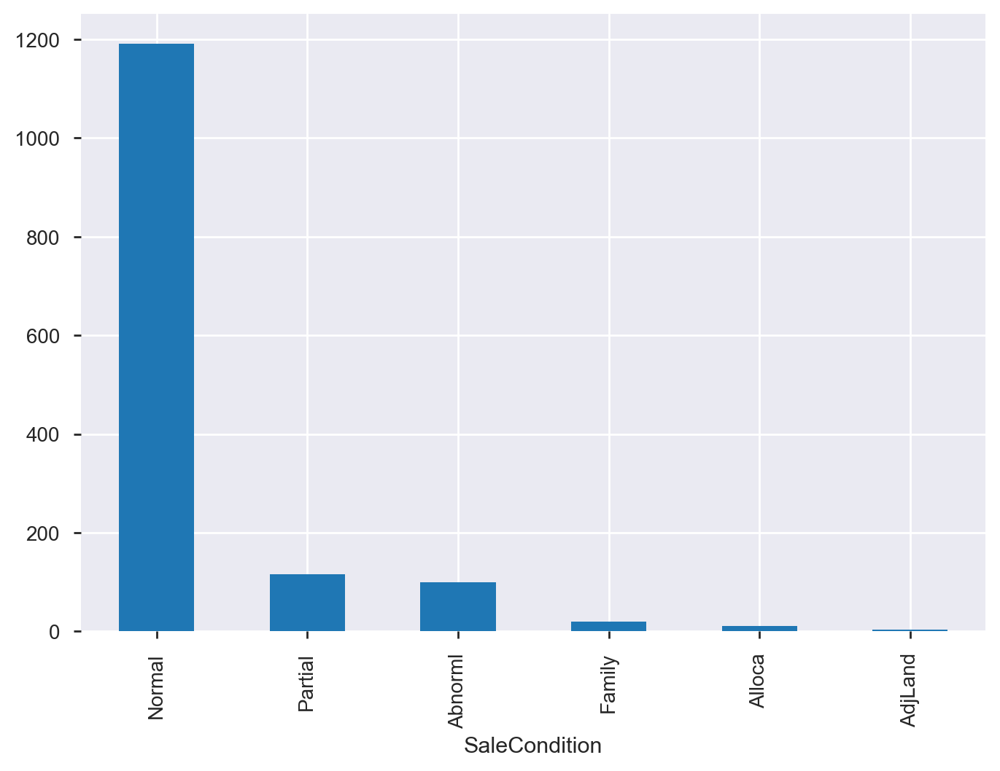

In [340]:
fig, ax = plt.subplots()
#Checking if target has any null values that may need recoding
print(house_clean.SaleCondition.isnull().sum())
#Investigating size of SaleCondition groups
house_clean.groupby(by="SaleCondition").size().sort_values(ascending=False).plot(kind='bar')
print(house_clean.groupby(by="SaleCondition").size().sort_values(ascending=False))

In [341]:
#Reviewing the target variable.

print((house_clean.groupby(by="SaleCondition").size()/len(house_clean.SaleCondition)))
#As can be seen, approximatly 6.9% of properties (n=100) meet the criteria of Abnormal sale 

SaleCondition
Abnorml    0.069300
AdjLand    0.002772
Alloca     0.007623
Family     0.013860
Normal     0.826057
Partial    0.080388
dtype: float64


In [342]:
#As we are only interested in identifing Abnormal Sales, we can condense the other classes into a single class to make this a binary target
house_clean['abnormal_flag'] = house_clean['SaleCondition'].apply(lambda x: 1 if x == 'Abnorml' else 0)
# house_clean['abnormal_flag']

In [343]:
house_clean.groupby(by="abnormal_flag").size()

abnormal_flag
0    1343
1     100
dtype: int64

In [344]:
house_clean.columns.tolist()

['Id',
 'MSSubClass',
 'MSZoning',
 'LotFrontage',
 'LotArea',
 'Alley',
 'LotShape',
 'LandContour',
 'LotConfig',
 'LandSlope',
 'Neighborhood',
 'Condition1',
 'BldgType',
 'HouseStyle',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'RoofStyle',
 'Exterior1st',
 'Exterior2nd',
 'MasVnrType',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'Foundation',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 'CentralAir',
 'Electrical',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'GrLivArea',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'FireplaceQu',
 'GarageType',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'PavedDrive',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 'ThreeSsnPorch',
 'ScreenPorch',
 'PoolArea'

In [345]:
X_class = house_clean[['log_LotFrontage_recoded',
#          'Pre_1980',
         'log_LotArea',
         'log_GrLivArea',
         'total_full_baths',
         'total_half_baths',
#          'total_bathrooms',
         'bed_bath_ratio',
         'alley_recoded_Grvl',
#          'alley_recoded_No_alley_access',
         'alley_recoded_Pave',
         'LotShape_IR1',
         'LotShape_IR2',
         'LotShape_IR3',
#          'LotShape_Reg',
         'LotConfig_Corner',
         'LotConfig_CulDSac',
         'LotConfig_FR2',
         'LotConfig_FR3',
#          'LotConfig_Inside',
#          'LandSlope_Gtl',
         'LandSlope_Mod',
         'LandSlope_Sev',
         'Neighborhood_Blmngtn',
         'Neighborhood_Blueste',
         'Neighborhood_BrDale',
         'Neighborhood_BrkSide',
         'Neighborhood_ClearCr',
         'Neighborhood_CollgCr',
         'Neighborhood_Crawfor',
         'Neighborhood_Edwards',
         'Neighborhood_Gilbert',
         'Neighborhood_IDOTRR',
         'Neighborhood_MeadowV',
         'Neighborhood_Mitchel',
         'Neighborhood_NAmes',
         'Neighborhood_NPkVill',
         'Neighborhood_NWAmes',
         'Neighborhood_NoRidge',
         'Neighborhood_NridgHt',
#          'Neighborhood_OldTown',
         'Neighborhood_SWISU',
         'Neighborhood_Sawyer',
         'Neighborhood_SawyerW',
         'Neighborhood_Somerst',
         'Neighborhood_StoneBr',
         'Neighborhood_Timber',
         'Neighborhood_Veenker',
         'Condition1_recoded_AdjNear_positive',
         'Condition1_recoded_Ajacent or near railroad',
#          'Condition1_recoded_Norm',
         'Condition1_recoded_On or near Artery or Feeder Road',
#          'BldgType_1Fam',
         'BldgType_2fmCon',
         'BldgType_Duplex',
         'BldgType_Twnhs',
         'BldgType_TwnhsE',
         'Basement_recoded_Ex',
         'Basement_recoded_Fa',
         'Basement_recoded_Gd',
#          'Basement_recoded_No_basement',
         'Basement_recoded_TA',
         'MSZoning_C (all)',
         'MSZoning_FV',
         'MSZoning_RH',
#          'MSZoning_RL',
         'MSZoning_RM',
         'MoSold_recoded_Apr',
         'MoSold_recoded_Aug',
         'MoSold_recoded_Dec',
         'MoSold_recoded_Feb',
#          'MoSold_recoded_Jan',
         'MoSold_recoded_Jul',
         'MoSold_recoded_Jun',
         'MoSold_recoded_Mar',
         'MoSold_recoded_May',
         'MoSold_recoded_Nov',
         'MoSold_recoded_Oct',
         'MoSold_recoded_Sep',
#          'House_Finished_Status_Finished',
         'House_Finished_Status_UNFinished',
#          'HouseStyle_recoded_1.0_storeys',
         'HouseStyle_recoded_1.5_storeys',
         'HouseStyle_recoded_2.0_storeys',
         'HouseStyle_recoded_2.5_storeys',
         'HouseStyle_recoded_Split_Foyer',
         'HouseStyle_recoded_Split_Level',
         'GarageType_recoded_2Types',
         'GarageType_recoded_Attchd',
         'GarageType_recoded_Basment',
         'GarageType_recoded_BuiltIn',
         'GarageType_recoded_CarPort',
         'GarageType_recoded_Detchd',
#          'GarageType_recoded_No_Garage'
                      ]]

y_class = house_clean['abnormal_flag']

**Orginal Data Approach**

In [346]:
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score,f1_score, precision_score, recall_score
from sklearn.utils import resample

In [347]:
#Create a test train set for use in modelling. 
X_train_lr,X_test_lr,y_train_lr,y_test_lr=train_test_split(X_class,y_class,test_size=0.2,stratify=y_class)

In [348]:
#Initalise standardscaler wrapper
ss_class_original = StandardScaler()
#and then fit to data and then transform it. In this case the X_class_train data set from above
Xs_class_train_original = ss_class_original.fit_transform(X_train_lr)

In [349]:
#Initialise a logistic regression model with 10 folds appling Ridge penalty and using the area under the curve scoring method
lr_original=LogisticRegressionCV(cv=10, max_iter=20000, penalty='l2', scoring='roc_auc')

In [350]:
#Fit a logistical model to the training data
lr_original_class_model = lr_original.fit(Xs_class_train_original,y_train_lr)

In [351]:
#Using the fitted model, predict class on the testing set
lr_original_class_y_hat = lr_original_class_model.predict(X_test_lr)

In [352]:
#The f1 score shows that the model is poor at classifying the classes in  the training set.
f1_score(y_test_lr,lr_original_class_y_hat)
#Performance metric

0.0

In [353]:
#inspection of the confusion matrix clearly shows that the model is essentially predicting membership to the majority class
#which is likely to be due to the imbalanced classes
confusion_matrix(y_test_lr,lr_original_class_y_hat)

array([[269,   0],
       [ 20,   0]], dtype=int64)

In [354]:
#Indeed, while the accuracy score of 93% looks good on face, it is essentially only accuratly predicting the majority 
#class and misclassifying the minority class which was about 7% of the data set anyway. 
accuracy_score(y_test_lr,lr_original_class_y_hat)
#Performance metric

0.9307958477508651

**Upsampling Approach**

In [355]:
#This approach will attempt to an up-sampling approach which upsamples the minority class (in this case Abnormal sales)
#through randomly adding to the class from existing minority class observations

In [356]:
#Join feature and target into single dataframe 
Xy_class_df = X_class.join(y_class)

In [357]:
# Separate majority and minority classes
class_majority = Xy_class_df[Xy_class_df.abnormal_flag==0]
class_minority = Xy_class_df[Xy_class_df.abnormal_flag==1]
 
# Upsample abnormal minority class
df_abnormal_upsampled = resample(class_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=house_clean.groupby(by="abnormal_flag").size()[0],  # to match size of majority class
                                 random_state=1) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([class_majority, df_abnormal_upsampled])
 
# Display new class counts
df_upsampled.abnormal_flag.value_counts()
# Abnormal has 1343 rows
# Normal/Other has 1343 rows

1    1343
0    1343
Name: abnormal_flag, dtype: int64

In [358]:
#Create new X and y data frames for use in modelling
X_df_upsampled = df_upsampled.drop(labels=['abnormal_flag'], axis=1)
y_df_upsampled = df_upsampled['abnormal_flag']

In [359]:
#Break data into training (80%) and testing (20%) sets
X_class_train,X_class_test,y_class_train,y_class_test=train_test_split(X_df_upsampled,y_df_upsampled,test_size=0.2,stratify=y_df_upsampled)


In [360]:
#Initalise standardscaler wrapper
ss_class = StandardScaler()
#and then fit to data and then transform it. In this case the X_class_train data set from above
Xs_class_train = ss_class.fit_transform(X_class_train)

In [361]:
#Initialise a logistic regression model with 10 folds appling Ridge penalty 
lr_upsampled=LogisticRegressionCV(cv=10, max_iter=20000, penalty='l2')
#Fit the model to the training data 
lr_class_model = lr_upsampled.fit(Xs_class_train,y_class_train)

In [362]:
#Predict class membership on testing set and assign these predicting to a variable
lr_class_y_hat = lr_class_model.predict(X_class_test)

In [363]:
#Retrieve the f1 score for the model on the training set.
#The score has improved significantly over the unbalanced model but is still poorly performing
f1_score(y_class_test,lr_class_y_hat)
#Performance metric

0.022058823529411766

In [364]:
#Investigation of the confusion matrix suggests high levels of misclassification on the training set using fixed features
confusion_matrix(y_class_test,lr_class_y_hat)

array([[269,   0],
       [266,   3]], dtype=int64)

Sorry run out of time to further explore this data. However, would have attempted Cost-Sensitive Training and then Random Forrests which tends to work better on tasks where interpretation of drivers is less important as would be the case in this situation. 